<a href="https://colab.research.google.com/github/D2718281828nis/BioMedAI-Heart-Desease-LifeTime-Forecast/blob/main/model_coronary_syndrome_clsf_regression_forecast.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Установка библиотек

In [1]:
# описание расчетов и результатов

In [2]:
!pip install numpy pandas matplotlib scikit-learn openpyxl seaborn tqdm ipympl optuna xgboost catboost --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.0/519.0 kB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 425.6/425.6 kB 37.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.7/264.7 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 32.5 MB/s eta 0:00:00


In [3]:
!pip install catboost -q

In [4]:
!pip install optuna -q

In [5]:
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import silhouette_score, classification_report, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.cluster import KMeans, DBSCAN
from sklearn.manifold import TSNE
from sklearn.svm import LinearSVC
from mpl_toolkits import mplot3d
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import catboost
import xgboost
import pandas as pd
import numpy as np
import optuna

%matplotlib inline
plt.style.use("seaborn-v0_8-whitegrid")

# Загрузка и разведочный анализ данных

In [6]:
data = pd.read_excel("/content/med_dataset_cardio.xlsx", header=0)

data.head()

,dmonit,"0_no, 1_ther, 2_card",card,time,result,age,result_cvd,af,dm,ckd,...,pulm_cong,bmi,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea
0,1,1,0,1152,0,79.0,0,0,1,0,...,0,30.7,0,84.0,7.1,213.0,2.2,1.06,8.7,117.0
1,1,1,0,949,0,61.0,0,1,1,0,...,0,34.0,0,166.0,9.4,225.0,5.8,3.61,4.4,94.0
2,1,1,0,1135,0,49.0,0,0,0,0,...,0,23.0,1,150.0,10.5,208.0,7.4,5.09,3.9,74.0
3,1,2,1,1524,0,59.0,0,0,0,0,...,0,26.5,1,142.0,5.1,58.0,5.3,3.30,4.2,86.0
4,1,2,1,1396,0,55.0,0,0,0,0,...,0,29.0,1,151.0,7.7,305.0,7.3,5.07,4.3,96.0


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1506 entries, 0 to 1505
Data columns (total 36 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   dmonit                1506 non-null   int64  
 1   0_no, 1_ther, 2_card  1506 non-null   int64  
 2   card                  1506 non-null   int64  
 3   time                  1506 non-null   int64  
 4   result                1506 non-null   int64  
 5   age                   1506 non-null   float64
 6   result_cvd            1506 non-null   int64  
 7   af                    1506 non-null   int64  
 8   dm                    1506 non-null   int64  
 9   ckd                   1506 non-null   int64  
 10  copd                  1506 non-null   int64  
 11  insult                1506 non-null   int64  
 12  onco                  1506 non-null   int64  
 13  0_na, 1_mi            1506 non-null   int64  
 14  na                    1506 non-null   int64  
 15  nstemi               

## Описание данных

**`Binary features`**

* `dmonit`: **Факт наличия диспансерного наблюдения (регулярного контроля врача)**

&emsp;&emsp;Пациент состоит на учёте у врача из-за хронического заболевания (например, сердечной недостаточности)

* `0_no, 1_ther, 2_card`: **Кто ведёт наблюдение**
    * 0: нет наблюдения
    * 1: терапевт
    * 2: кардиолог<br><br>

*  `card`: **Наличие узкой специализированной помощи для сердца**
    * 1: наблюдение кардиолога
    * 0: наблюдение терапевта / отсутствие<br><br>

* `af`: **Фибрилляция/трепетание предсердий (нарушение ритма сердца)**

&emsp;&emsp;Сердце бьётся нерегулярно, что повышает риск тромбов и инсульта

* `dm`: **Сахарный диабет**

&emsp;&emsp;Высокий уровень сахара в крови, который повреждает сосуды и усугубляет сердечные проблемы

* `ckd`: **Хроническая болезнь почек 3а стадии и выше**

&emsp;&emsp;Почки плохо фильтруют кровь, что связано с риском сердечных осложнений

* `copd`: **Хроническая обструктивная болезнь лёгких (ХОБЛ)**

&emsp;&emsp;Затруднение дыхания из-за сужения дыхательных путей (например, у курильщиков)

* `insult`: **История инсульта (острого нарушения мозгового кровообращения)**

&emsp;&emsp;Ранее был эпизод «остановки» кровоснабжения мозга, что повышает риск повторного инсульта или инфаркта

* `onco`: **Наличие онкологического заболевания (рака)**

&emsp;&emsp;Рак может осложнять лечение сердечных заболеваний (например, из-за слабости организма)

* `0_na, 1_mi`: **Тяжесть сердечного приступа**
    * 0: нестабильная стенокардия (сильная боль в груди из-за недостатка крови)
    * 1: инфаркт миокарда (отмирание части сердца)<br><br>

* `na`: **Временное ухудшение состояния сердца без отмирания тканей**
    * 1: нестабильная стенокардия
    * 0: иное<br><br>
* `stemi`: **Острая полная закупорка сосуда (коронарной артерии)**
    * 1: инфаркт миокарда с подъёмом сегмента ST на ЭКГ
    * 0: остальное<br><br>

* `nstemi`: **Частичная закупорка коронарной артерии**
    * 1: инфаркт миокарда без подъёма сегмента ST на ЭКГ (менее выраженный, но опасный)
    * 0: остальное<br><br>

* `llo`: **Факт получения бесплатного (льготного) лекарственного обеспечения после выписки**

* `gender`: **Пол человека**
    * 1: мужской
    * 0: женский<br><br>
* `ca_delay`: **Отсрочка коронарографии (исследования сосудов сердца) более чем на 24 часа**

* `stenting`: **Установка стента («трубки») в закупоренный сосуд**

&emsp;&emsp;Попытка восстановить кровоток в сердце

* `total_revasc`: **Полная или частичная реваскуляризация (восстановление кровотока)**

&emsp;&emsp;Успешность хирургического вмешательства
  
* `pulm_cong`: **Признаки венозного застоя крови в лёгких при поступлении**

&emsp;&emsp;Сердечная недостаточность (сердце не справляется с перекачкой крови)

* `smoking`: **Статус курения**
    * 1: курит
    * 0: не курит

**`Contiguous features`**

* `age`: **Возраст пациента в годах**

&emsp;&emsp;С возрастом риск сердечных заболеваний растёт
  
* `sum_cad`: **Количество поражённых коронарных артерий (судов, питающих сердце)**

&emsp;&emsp;Чем больше артерий сужено или закупорено, тем серьёзнее проблема с кровоснабжением сердца

* `ef_hosp`: **Фракция выброса левого желудочка (сколько крови сердце выталкивает за один удар)**

&emsp;&emsp;Низкое значение (менее 40%) — признак слабого сердца (сердечная недостаточность)

* `bmi`: **Индекс массы тела (соотношение веса и роста)**

&emsp;&emsp;Высокий BMI (выше 30) — ожирение, которое усугубляет сердечные проблемы

* `bpm`: **Частота сердечных сокращений при поступлении (ударов в минуту)**

&emsp;&emsp;Слишком высокая (свыше 100) или низкая (ниже 60) частота — нарушение ритма сердца

* `sysAP`: **Систолическое артериальное давление при поступлении («верхнее» давление)**

&emsp;&emsp;Высокое значение (свыше 140 мм рт. ст.) — гипертония, риск инфаркта

* `hb`: **Уровень гемоглобина в крови при поступлении (переносчик кислорода)**

&emsp;&emsp;Низкий уровень — анемия, что усугубляет недостаток кислорода в сердце

* `leukoc`: **Уровень лейкоцитов при поступлении (клетки иммунной системы)**

&emsp;&emsp;Высокий уровень — воспаление или инфекция

* `tromboc`: **Уровень тромбоцитов при поступлении (клетки, отвечающие за свёртывание крови)**

* `t_chol`: **Уровень общего холестерина в крови при поступлении**

* `ldl`: **Уровень «плохого» холестерина (липопротеинов низкой плотности) при поступлении**

* `glu`: **Уровень глюкозы в крови при поступлении**

* `crea`: **Уровень креатинина в крови при поступлении (показатель работы почек)**

In [8]:
data.rename(columns={"0_na, 1_mi": "severity", "0_no, 1_ther, 2_card": "doctor"}, inplace=True);

### Анализ распределения переменной 'time'

In [9]:
data["time"].describe()

,time
count,1506.000000
mean,1135.884462
std,419.580857
min,1.000000
25%,973.250000
50%,1264.000000
75%,1443.000000
max,1634.000000


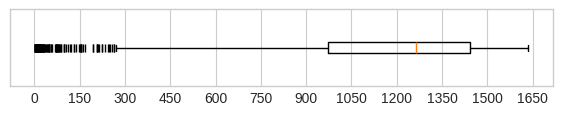

In [10]:
fig, ax = plt.subplots(figsize=(7, 1))

ax.boxplot(data["time"], sym="|", orientation="horizontal")

ax.yaxis.set_major_locator(plt.NullLocator())
ax.xaxis.set_major_locator(plt.MaxNLocator(12));

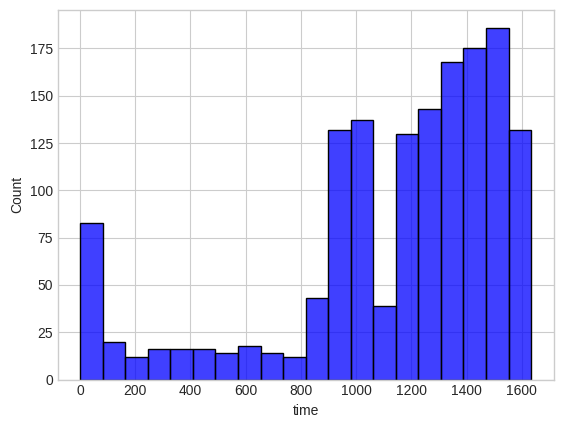

In [11]:
sns.histplot(data["time"], color="blue")

plt.gca().xaxis.set_major_locator(plt.MaxNLocator(10));

### Анализ переменных с дублированием значений

In [12]:
data.value_counts(["doctor", "card"])

,,count
doctor,card,
2,1,893
0,0,403
1,0,208
0,1,2


<br>Thus, the features almost duplicate each other, with the exception of two objects.

After assigning a value of $2$ to these controversial objects, the 'card' column can be removed.<br><br>

In [13]:
idx = data.query("(doctor == 0) & (card == 1)").index
data.loc[idx, "doctor"] = 2

data.value_counts(["doctor", "card"])

,,count
doctor,card,
2,1,895
0,0,403
1,0,208


In [14]:
data.drop(columns=["card"], inplace=True)

In [15]:
data.value_counts(["severity", "na"])

severity  na
1         0     1047
0         1      457
          0        1
1         1        1
Name: count, dtype: int64

<br>Thus, the features are almost opposite to each other, with the exception of two objects.

After assigning the right values to these controversial objects, the 'na' column can be removed?.<br><br>

In [16]:
data.drop(columns=["na"], inplace=True)

## Корреляционный анализ

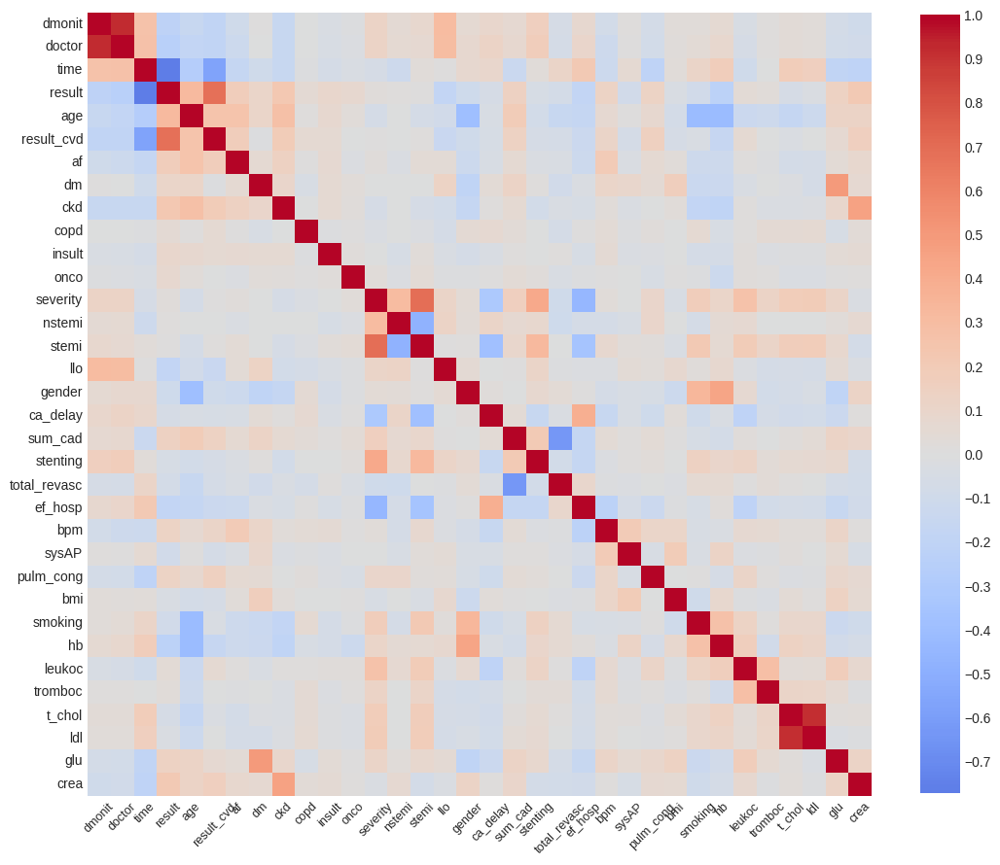

In [17]:
corr = data.corr()

plt.figure(figsize=(13, 13))
sns.heatmap(
    corr,
    annot=False,
    cmap='coolwarm',
    center=0,
    square=True,
    cbar_kws={'shrink': 0.8, 'ticks': plt.MaxNLocator(20)}
)

plt.xticks(rotation=45, ha='center', fontsize=9)
plt.yticks(fontsize=10);

In [18]:
threshold = 0.7
high_corr_pairs = []

for i in range(len(corr.columns)):
    for j in range(i + 1, len(corr.columns)):
        if abs(corr.iloc[i, j]) > threshold:
            high_corr_pairs.append((corr.columns[i], corr.columns[j], corr.iloc[i, j]))

if high_corr_pairs:
    print(f"Highly correlated feature pairs (absolute correlation > {threshold}):")
    for feature1, feature2, correlation_value in high_corr_pairs:
        print(f"- {feature1} and {feature2}: {correlation_value:.2f}")
else:
    print(f"No highly correlated feature pairs found with an absolute correlation greater than {threshold}.")

Highly correlated feature pairs (absolute correlation > 0.7):
- dmonit and doctor: 0.92
- time and result: -0.77
- t_chol and ldl: 0.91


<br>According to the heatmap there are several highly correlated pairs of features, namely, `doctor` and `dmonit`, `time` and `result`, `t_chol` and `ldl`<br><br>

In [19]:
idx_1, idx_2 = ["doctor", "ldl"], ["dmonit", "t_chol"]

corr.loc[idx_1, idx_2]

,dmonit,t_chol
doctor,0.922819,0.034775
ldl,0.026461,0.913415


<br>

(`doctor`; `dmonit`) are the most correlated, followed by (`ldl`; `t_chol`)

* `ldl` and `t_chol` are two different characteristic describing a human's blood. Therefore, despite the high correlation, both columns must remain

Let's see at `doctor` and `dmonit`:<br><br>

In [20]:
data.value_counts(["dmonit", "doctor"])

,,count
dmonit,doctor,
1,2,895
0,0,403
1,1,208


<br>Thus, `dmonit` is excessive:<br>
&emsp;&emsp;when `doctor` column takes a non-zero value, `dmonit` column takes one;<br>
&emsp;&emsp;when `doctor` column takes zero, `dmonit` takes zero as well.<br><br>

In [21]:
data.drop(columns=["dmonit"], inplace=True)

In [22]:
# final view of dataset

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1506 entries, 0 to 1505
Data columns (total 33 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   doctor        1506 non-null   int64  
 1   time          1506 non-null   int64  
 2   result        1506 non-null   int64  
 3   age           1506 non-null   float64
 4   result_cvd    1506 non-null   int64  
 5   af            1506 non-null   int64  
 6   dm            1506 non-null   int64  
 7   ckd           1506 non-null   int64  
 8   copd          1506 non-null   int64  
 9   insult        1506 non-null   int64  
 10  onco          1506 non-null   int64  
 11  severity      1506 non-null   int64  
 12  nstemi        1506 non-null   int64  
 13  stemi         1506 non-null   int64  
 14  llo           1506 non-null   int64  
 15  gender        1506 non-null   int64  
 16  ca_delay      1506 non-null   int64  
 17  sum_cad       1506 non-null   int64  
 18  stenting      1506 non-null 

In [23]:
degree_of_obesity = pd.cut(data["bmi"], bins=[0, 16, 18.5, 25, 30, 35, 40, 100], right=True)

In [24]:
data.groupby(by=[degree_of_obesity])["result"].aggregate(mean_target="mean", count="size").sort_values(by=["count", "mean_target"], ascending=False)

/tmp/ipykernel_596/1178454514.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data.groupby(by=[degree_of_obesity])["result"].aggregate(mean_target="mean", count="size").sort_values(by=["count", "mean_target"], ascending=False)


,mean_target,count
bmi,,
"(25.0, 30.0]",0.177711,664
"(30.0, 35.0]",0.194301,386
"(18.5, 25.0]",0.244514,319
"(35.0, 40.0]",0.191919,99
"(40.0, 100.0]",0.176471,34
"(16.0, 18.5]",0.250000,4
"(0.0, 16.0]",NaN,0


<br>Thus, the next caregories of people are prone to the mortality from cardiovascular diseases:

- normal people
- people with first-degree obesity
- people who are overweight<br><br>

In [25]:
data.groupby(by=[degree_of_obesity, data["smoking"]])["result"].aggregate(mean_target="mean", count="size")

/tmp/ipykernel_596/2042652361.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data.groupby(by=[degree_of_obesity, data["smoking"]])["result"].aggregate(mean_target="mean", count="size")


mean_target  count
bmi           smoking                    
(0.0, 16.0]   0                NaN      0
              1                NaN      0
(16.0, 18.5]  0           0.333333      3
              1           0.000000      1
(18.5, 25.0]  0           0.300578    173
              1           0.178082    146
(25.0, 30.0]  0           0.200436    459
              1           0.126829    205
(30.0, 35.0]  0           0.219697    264
              1           0.139344    122
(35.0, 40.0]  0           0.202899     69
              1           0.166667     30
(40.0, 100.0] 0           0.185185     27
              1           0.142857      7

<br>This is quite unusual: for all the categories being considered smokers are less likely to die from cardiovascular diseases except in the last category<br><br>

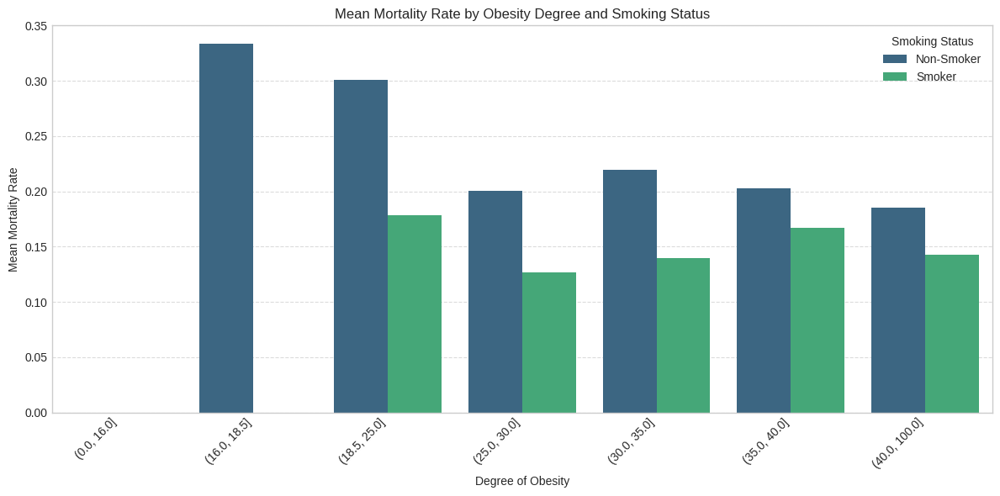

In [26]:
plt.figure(figsize=(12, 6))
sns.barplot(x=degree_of_obesity, y=data["result"], hue=data["smoking"], errorbar=None, palette="viridis")
plt.title('Mean Mortality Rate by Obesity Degree and Smoking Status')
plt.xlabel('Degree of Obesity')
plt.ylabel('Mean Mortality Rate')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Smoking Status', labels=['Non-Smoker', 'Smoker'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

<br>This is quite unusual: for all the categories being considered smokers are less likely to die from cardiovascular diseases except in the last category<br><br>

In [27]:
data["age"].describe()

,age
count,1506.000000
mean,63.737530
std,12.045577
min,27.000000
25%,56.000000
50%,64.000000
75%,71.000000
max,98.000000


In [28]:
age = pd.cut(data["age"], bins=np.arange(25, 95 + 1, 10), right=True)

In [29]:
data.pivot_table("result", index=[age], columns=["gender"], aggfunc=["mean", "size"])

/tmp/ipykernel_596/272617931.py:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  data.pivot_table("result", index=[age], columns=["gender"], aggfunc=["mean", "size"])
/tmp/ipykernel_596/272617931.py:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  data.pivot_table("result", index=[age], columns=["gender"], aggfunc=["mean", "size"])


mean           size     
gender           0         1    0    1
age                                   
(25, 35]  0.000000  0.055556    1   18
(35, 45]  0.100000  0.036145   10   83
(45, 55]  0.093750  0.064356   32  202
(55, 65]  0.115942  0.140845  138  355
(65, 75]  0.225000  0.247899  160  238
(75, 85]  0.335570  0.414286  149   70
(85, 95]  0.750000  0.615385   36   13

<br>Firstly, men under the age of 75 are more prone to ACS than women. The situation is opposite after the age of 75.<br><br>
As far as deaths are concerned, the picture is quite ambiguous and there are no clear patterns<br><br>

In [30]:
Q1 = data['time'].quantile(0.25)
Q3 = data['time'].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_df = data[(data['time'] < lower_bound) | (data['time'] > upper_bound)]
non_outliers_df = data[(data['time'] >= lower_bound) & (data['time'] <= upper_bound)]

print(f"First Quartile (Q1): {Q1}")
print(f"Third Quartile (Q3): {Q3}")
print(f"Interquartile Range (IQR): {IQR}")
print(f"Lower Bound for Outliers: {lower_bound}")
print(f"Upper Bound for Outliers: {upper_bound}")
print(f"Number of outliers: {len(outliers_df)}")
print(f"Number of non-outliers: {len(non_outliers_df)}")


First Quartile (Q1): 973.25
Third Quartile (Q3): 1443.0
Interquartile Range (IQR): 469.75
Lower Bound for Outliers: 268.625
Upper Bound for Outliers: 2147.625
Number of outliers: 120
Number of non-outliers: 1386


In [31]:
outliers_df.head(7)

,doctor,time,result,age,result_cvd,af,dm,ckd,copd,insult,...,pulm_cong,bmi,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea
14,0,49,1,64.000000,0,0,0,0,0,0,...,0,26.0,0,144.0,13.4,362.0,4.2,2.36,4.4,69.0
21,2,14,1,61.194521,0,1,0,0,0,1,...,0,24.0,0,154.0,14.0,241.0,6.3,3.85,8.2,90.0
27,0,153,1,83.000000,1,1,0,1,0,0,...,0,34.0,0,124.0,12.1,335.0,7.1,4.94,11.1,334.0
28,0,139,1,92.000000,1,0,0,1,0,0,...,1,24.0,0,118.0,11.5,181.0,5.3,3.57,8.4,87.0
30,0,80,1,77.000000,0,0,0,0,0,0,...,0,20.0,1,118.0,9.9,399.0,3.7,2.13,5.3,68.0
34,2,263,1,63.000000,0,0,1,0,0,0,...,0,40.0,0,121.0,7.8,202.0,5.3,3.24,4.7,135.0
44,0,11,1,84.326027,1,0,0,0,0,0,...,1,22.0,1,137.0,9.2,211.0,5.9,4.26,6.4,150.0


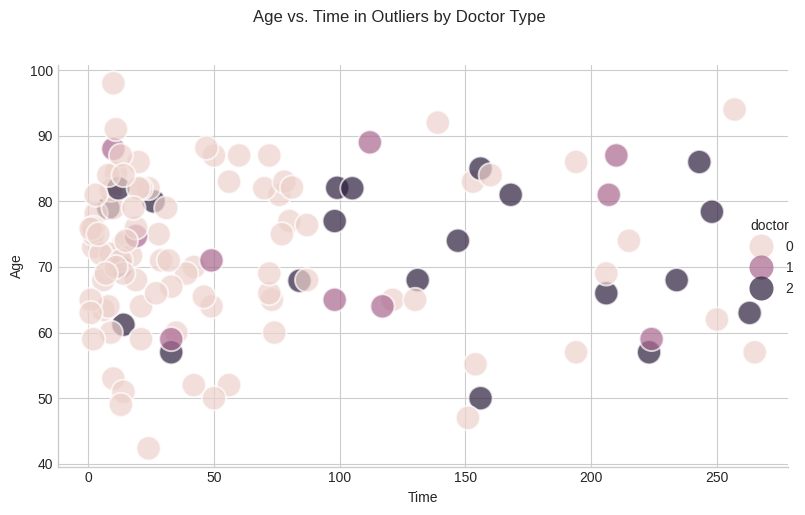

In [32]:
g = sns.relplot(data=outliers_df, x='time', y='age', hue='doctor', kind='scatter', height=5, aspect=1.5, s=300, alpha=0.7)
g.set_axis_labels('Time', 'Age')
plt.suptitle('Age vs. Time in Outliers by Doctor Type', y=1.02)
plt.tight_layout()
plt.show()

## Описательная статистика

Generate descriptive statistics for all features within the outlier DataFrame. Additionally, for categorical features, provide value counts or frequency distributions to understand the common characteristics of these outlier data points.


In [33]:
numerical_cols = outliers_df.select_dtypes(include=['number']).columns
categorical_cols = outliers_df.select_dtypes(include=['object', 'category']).columns

print("Descriptive statistics for numerical features in outliers_df:")
print(outliers_df[numerical_cols].describe())


Descriptive statistics for numerical features in outliers_df:
           doctor        time  result         age  result_cvd          af  \
count  120.000000  120.000000   120.0  120.000000  120.000000  120.000000   
mean     0.433333   71.425000     1.0   72.098082    0.650000    0.300000   
std      0.774958   75.801672     0.0   11.401801    0.478969    0.460179   
min      0.000000    1.000000     1.0   42.361644    0.000000    0.000000   
25%      0.000000   13.000000     1.0   64.750000    0.000000    0.000000   
50%      0.000000   37.000000     1.0   72.000000    1.000000    0.000000   
75%      1.000000  106.750000     1.0   81.979452    1.000000    1.000000   
max      2.000000  265.000000     1.0   98.000000    1.000000    1.000000   

               dm         ckd        copd      insult  ...   pulm_cong  \
count  120.000000  120.000000  120.000000  120.000000  ...  120.000000   
mean     0.308333    0.233333    0.041667    0.150000  ...    0.225000   
std      0.463741    0

In [34]:
print("\nValue counts for categorical features in outliers_df:")
for col in categorical_cols:
    print(f"\n--- {col} ---")
    print(outliers_df[col].value_counts())



Value counts for categorical features in outliers_df:


In [35]:
print("Descriptive statistics for numerical features in the full dataset:")
print(data.select_dtypes(include=['number']).describe())

Descriptive statistics for numerical features in the full dataset:
            doctor         time       result          age   result_cvd  \
count  1506.000000  1506.000000  1506.000000  1506.000000  1506.000000   
mean      1.326693  1135.884462     0.197211    63.737530     0.100930   
std       0.869287   419.580857     0.398025    12.045577     0.301336   
min       0.000000     1.000000     0.000000    27.000000     0.000000   
25%       0.000000   973.250000     0.000000    56.000000     0.000000   
50%       2.000000  1264.000000     0.000000    64.000000     0.000000   
75%       2.000000  1443.000000     0.000000    71.000000     0.000000   
max       2.000000  1634.000000     1.000000    98.000000     1.000000   

                af           dm          ckd         copd       insult  ...  \
count  1506.000000  1506.000000  1506.000000  1506.000000  1506.000000  ...   
mean      0.144754     0.259628     0.106906     0.033201     0.078353  ...   
std       0.351970     0.4385

In [36]:
print("\nDescriptive statistics for numerical features in non_outliers_df:")
print(non_outliers_df.select_dtypes(include=['number']).describe())


Descriptive statistics for numerical features in non_outliers_df:
            doctor         time       result          age   result_cvd  \
count  1386.000000  1386.000000  1386.000000  1386.000000  1386.000000   
mean      1.404040  1228.045455     0.127706    63.013673     0.053391   
std       0.833304   290.061057     0.333882    11.828655     0.224893   
min       0.000000   271.000000     0.000000    27.000000     0.000000   
25%       1.000000  1009.000000     0.000000    56.000000     0.000000   
50%       2.000000  1296.500000     0.000000    63.000000     0.000000   
75%       2.000000  1454.000000     0.000000    70.390411     0.000000   
max       2.000000  1634.000000     1.000000    95.000000     1.000000   

                af           dm          ckd         copd      insult  ...  \
count  1386.000000  1386.000000  1386.000000  1386.000000  1386.00000  ...   
mean      0.131313     0.255411     0.095960     0.032468     0.07215  ...   
std       0.337864     0.436250 

/tmp/ipykernel_596/1945601521.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(outliers_df[col], label='Outliers', color='red', fill=True)


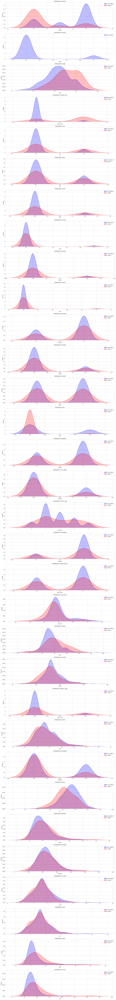

In [37]:
numerical_cols = data.select_dtypes(include=['number']).columns.drop('time')

plt.figure(figsize=(15, 4 * len(numerical_cols)))

for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols), 1, i + 1)
    sns.kdeplot(non_outliers_df[col], label='Non-Outliers', color='blue', fill=True)
    sns.kdeplot(outliers_df[col], label='Outliers', color='red', fill=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

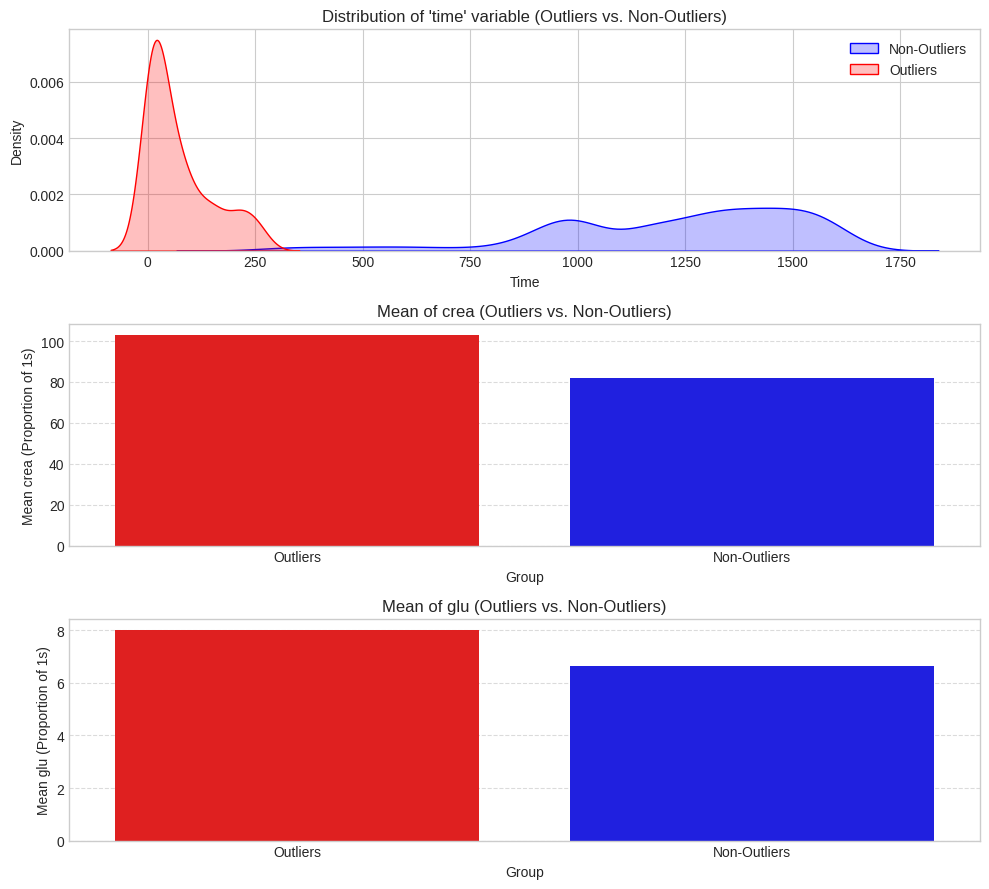

In [38]:
binary_features = ['crea', 'glu']

# Calculate the number of subplots needed (1 for 'time' + number of binary features)
num_plots = 1 + len(binary_features)

fig, axes = plt.subplots(num_plots, 1, figsize=(10, 3 * num_plots))

# Plotting the distribution of 'time'
sns.kdeplot(non_outliers_df['time'], ax=axes[0], label='Non-Outliers', color='blue', fill=True)
sns.kdeplot(outliers_df['time'], ax=axes[0], label='Outliers', color='red', fill=True)
axes[0].set_title("Distribution of 'time' variable (Outliers vs. Non-Outliers)")
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Density')
axes[0].legend()
axes[0].grid(True)

# Plotting binary features
for i, feature in enumerate(binary_features):
    ax = axes[i + 1]

    # Calculate mean for the feature in both dataframes
    mean_outliers = outliers_df[feature].mean()
    mean_non_outliers = non_outliers_df[feature].mean()

    # Create a DataFrame for plotting
    plot_data = pd.DataFrame({
        'Group': ['Outliers', 'Non-Outliers'],
        'Mean': [mean_outliers, mean_non_outliers]
    })

    sns.barplot(x='Group', y='Mean', hue='Group', data=plot_data, ax=ax, palette={'Outliers': 'red', 'Non-Outliers': 'blue'}, legend=False)
    ax.set_title(f'Mean of {feature} (Outliers vs. Non-Outliers)')
    ax.set_xlabel('Group')
    ax.set_ylabel(f'Mean {feature} (Proportion of 1s)')
    #ax.set_ylim(0, 1) # Binary features represent proportions, so limit y-axis to 0-1
    ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### Ключевые выводы анализа данных

*   **Выявление выбросов:** С помощью метода межквартильного размаха (IQR) в переменной «time» было выявлено 120 выбросов. Нижняя граница для выбросов составила 268,625, верхняя — 2147,625. Выбросы в переменной «time» находились в диапазоне от 1 до 265, что указывает на очень короткие периоды наблюдения.
*   **Значительно более высокая смертность в группе выбросов:** Переменная «result» (показатель смертности) была поразительно выше в группе выбросов: среднее значение составило 100% (1,00) по сравнению с примерно 13% (0,127) в группе без выбросов и примерно 20% (0,197) во всём наборе данных. Это означает, что пациенты с очень коротким временем наблюдения подвергаются существенно повышенному риску наступления целевого события.
*   **Более старший возраст в группе выбросов:** У выбросов наблюдался значительно более высокий средний возраст (около 72,10 года) по сравнению с группой без выбросов (около 63,01 года), что говорит о том, что короткие периоды наблюдения чаще встречаются у пожилых пациентов.
*   **Более высокая распространённость сопутствующих заболеваний в группе выбросов:** В группе выбросов отмечена более высокая частота серьёзных состояний:
    *   Фибрилляция предсердий (`af`): среднее значение 0,300 в группе выбросов против 0,131 в группе без выбросов.
    *   Хроническая болезнь почек (`ckd`): среднее значение 0,233 против 0,096.
    *   Сахарный диабет (`dm`): среднее значение 0,308 против 0,255.
    *   Застой в лёгких (`pulm_cong`): среднее значение 0,225 против 0,073.
    *   Инсульт в анамнезе (`insult`): среднее значение 0,150 против 0,072.
*   **Признаки ухудшения состояния здоровья и менее специализированного ухода в группе выбросов:**
    *   **Гемоглобин (`hb`):** более низкое среднее значение в группе выбросов (130,56) по сравнению с группой без выбросов (139,64), что может указывать на анемию.
    *   **Креатинин (`crea`):** более высокое среднее значение в группе выбросов (103,03) по сравнению с группой без выбросов (82,18), что свидетельствует о ухудшении функции почек.
    *   **Глюкоза (`glu`):** более высокое среднее значение в группе выбросов (8,02) по сравнению с группой без выбросов (6,64).
    *   **Наблюдение врача (`doctor`):** среднее значение переменной «doctor» ниже в группе выбросов (0,43) по сравнению с группой без выбросов (1,40), что говорит о том, что у выбросов чаще отсутствует специализированное наблюдение (чаще встречается «нет наблюдения» или «терапевт», а не «кардиолог»).

*   **Инсайт:** Выбросы по переменной «time» представляют собой критическую подгруппу пациентов, характеризующуюся значительно худшими исходами для здоровья (очень высокая смертность), пожилым возрастом и тяжёлыми сопутствующими заболеваниями, а также потенциально недостаточным специализированным медицинским наблюдением. Это позволяет предположить, что сама переменная «time» является сильным прогностическим индикатором: очень короткие периоды наблюдения часто предшествуют неблагоприятным событиям.

## Статистика лабораторных исследований (по данным госпитализации)

In [39]:
feat_to_analyze = ["hb", "leukoc", "tromboc", "t_chol", "ldl", "glu", "crea", "result"]

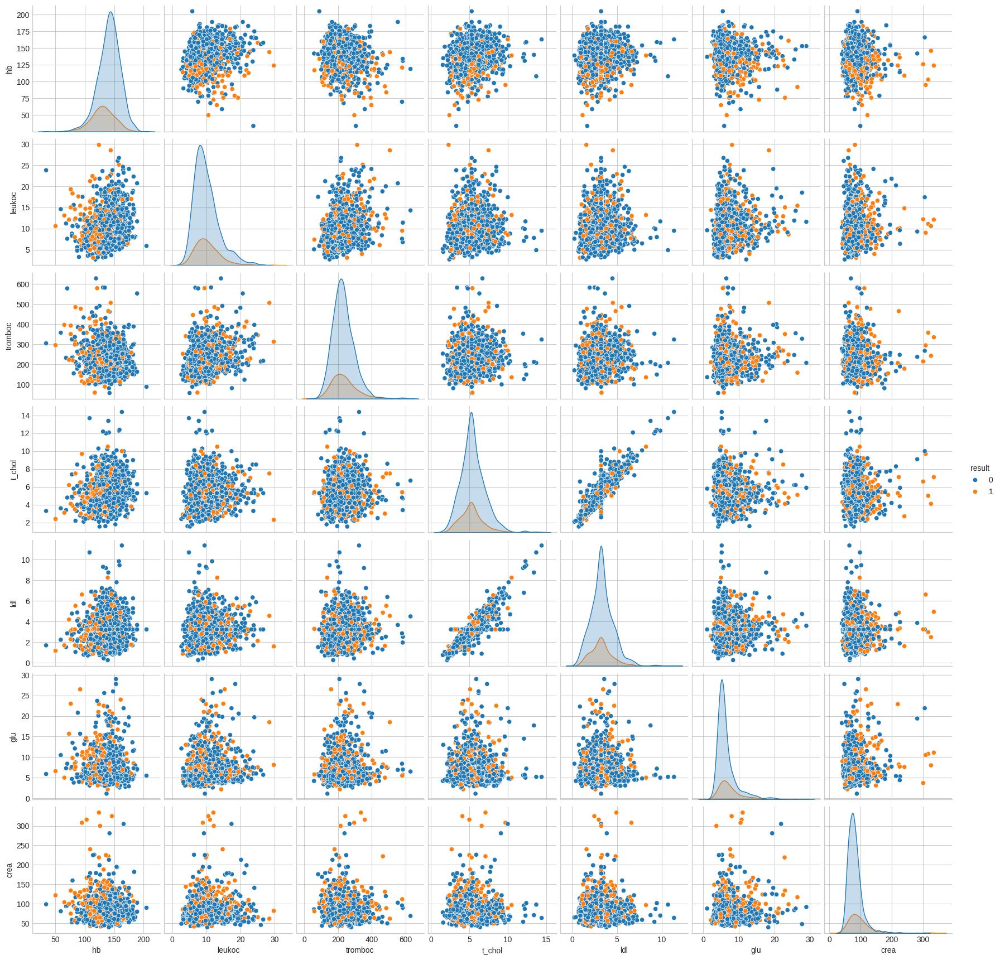

In [40]:
sns.pairplot(data[feat_to_analyze], hue="result", diag_kind="kde");

На основе попарного графика (pairplot) лабораторных параметров (`hb`, `leukoc`, `tromboc`, `t_chol`, `ldl`, `glu`, `crea`) в зависимости от переменной `result` (смертность), можно сделать следующие наблюдения:

*   **Гемоглобин (`hb`):** У пациентов с `result=1` (неблагоприятный исход) уровень гемоглобина, как правило, немного ниже по сравнению с пациентами с `result=0` (отсутствие неблагоприятного исхода), что видно по небольшому сдвигу графика плотности распределения (KDE) влево для группы `result=1`.
*   **Глюкоза (`glu`):** Напротив, у пациентов с `result=1` наблюдается тенденция к несколько более высокому уровню глюкозы: их график KDE демонстрирует слабый сдвиг вправо.
*   **Креатинин (`crea`):** Аналогично, уровень креатинина в группе `result=1` кажется немного повышенным.
*   **Лейкоциты (`leukoc`), тромбоциты (`tromboc`), общий холестерин (`t_chol`) и холестерин ЛПНП (`ldl`):** Для этих признаков распределения в группах `result=0` и `result=1` в значительной степени перекрываются, и на графиках KDE не наблюдается выраженных визуальных различий.
*   **Попарные диаграммы рассеяния:** На всех попарных комбинациях признаков диаграммы рассеяния не демонстрируют чёткого разделения или выраженной кластеризации между группами `result=0` и `result=1`. Категории исхода перемешаны в пространстве признаков.

В целом, хотя `hb`, `glu` и `crea` показывают слабые сдвиги в распределениях, связанные с переменной `result`, что подтверждает их потенциальную релевантность в качестве индикаторов, общий визуальный анализ свидетельствует о том, что ни один отдельный признак или простая комбинация двух признаков не позволяет явно и визуально отделить группу `result=0` от группы `result=1`. Это указывает на необходимость применения более сложных моделей для выявления взаимосвязей, определяющих наступление неблагоприятного исхода.

# Решаем задачу классификации

## **Гипотеза: Zero-shot. Целевая переменная `RESULT` (drop `time`)

In [41]:
#data["target"] = data["result_cvd"]

data["target"] = data["result"]

data.drop(columns=["result", "result_cvd"], inplace=True)
data.drop(columns=["time"], inplace=True)

### K-Means

In [42]:
scores = np.empty(shape=19, dtype=np.float64)

for i in range(2, 20 + 1):
    model = KMeans(n_clusters=i, n_init=25, random_state=21)
    model.fit(data.iloc[:, :(-1)])

    scores[i - 2] = model.inertia_

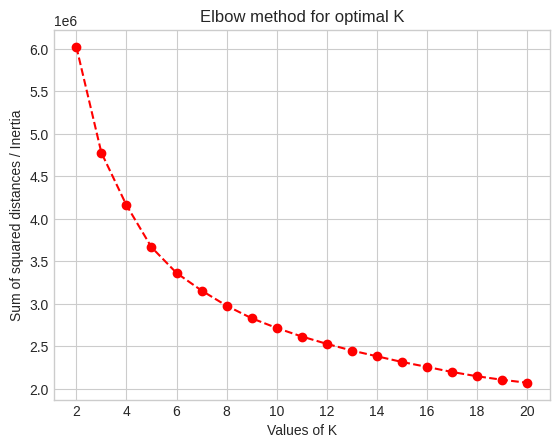

In [43]:
fig, ax = plt.subplots()

ax.plot(np.arange(2, 20 + 1), scores, "--or")
ax.set(xlabel="Values of K", ylabel="Sum of squared distances / Inertia", title="Elbow method for optimal K")
ax.xaxis.set_major_locator(plt.MaxNLocator(12));

<br>In terms of *sum of squared distances*, the optimal number of clusters defined with elbow method is equal to $5$<br><br>

In [44]:
model = KMeans(n_clusters=5, n_init=25, random_state=21)
model.fit(data.iloc[:, :(-1)])

clusters = model.predict(data.iloc[:, :(-1)])
clusters = pd.Series(clusters, name="clusters")

clusters.value_counts()

,count
clusters,
0,624
1,444
4,334
3,54
2,50


In [45]:
data.groupby(by=clusters).aggregate({"target": "mean", "llo": "mean", "severity": "mean", "sum_cad": "mean"})

,target,llo,severity,sum_cad
clusters,,,,
0,0.161859,0.314103,0.725962,1.692308
1,0.207207,0.292793,0.605856,1.772523
2,0.320000,0.120000,0.800000,1.840000
3,0.462963,0.203704,0.759259,1.907407
4,0.188623,0.263473,0.733533,1.742515


<br>Thus, K-Means identified two clusters with the highest percentage of deaths. The other clusters showed the lower scores.<br>

Cluster $0$ and $3$ have the lowest mean value for the number of affected coronary arteries; cluster 0 also has the lowest number of myocardial infarctions.<br><br> The clusters with the highest `%` of deaths have the largest values for these two params.<br><br> llo, in large part, is distributed to the clusters with the low scores of deaths.

In [46]:
data.groupby(by=clusters)["doctor"].value_counts(normalize=True)

clusters  doctor
0         2         0.616987
          0         0.240385
          1         0.142628
1         2         0.576577
          0         0.286036
          1         0.137387
2         2         0.600000
          0         0.260000
          1         0.140000
3         2         0.444444
          0         0.407407
          1         0.148148
4         2         0.598802
          0         0.272455
          1         0.128743
Name: proportion, dtype: float64

<br>Clusters also show how many people were seen by a cardiologist.<br>


Thus, the clustering has been done well, because they reflects main differences and similarities between objects. The cluster number can be used as an additional feature.

### DBSCAN

In [47]:
metrics_dict, data_view = {1: 'euclidean', 0: 'manhattan'}, data.iloc[:, :(-1)]

eps = np.array([10.0, 25.0, 50.0, 100.0, 250.0, 260.0, 270.0, 280.0, 290.0, 300.0, 350], dtype=np.float64)
min_samples = np.array([3, 10, 25, 50, 100], dtype=np.int64)
metrics = np.arange(2)

scores = np.empty(shape=(2, min_samples.size, eps.size), dtype=np.float64)

with tqdm(total=(eps.size * min_samples.size * metrics.size), desc='Score calculating') as pbar:
    for i, curr_eps in enumerate(eps):
        for j, curr_min_samples in enumerate(min_samples):
            for curr_metric in metrics:
                model = DBSCAN(eps=curr_eps, min_samples=curr_min_samples, metric=metrics_dict[curr_metric], n_jobs=(-1))
                labels = model.fit_predict(data_view)

                if len(np.unique(labels)) > 1:
                    scores[curr_metric, j, i] = silhouette_score(data_view, labels, metric=metrics_dict[curr_metric], random_state=21)
                else:
                    scores[curr_metric, j, i] = -1

                pbar.update(1)

Score calculating: 100%|██████████| 110/110 [00:24<00:00,  4.53it/s]


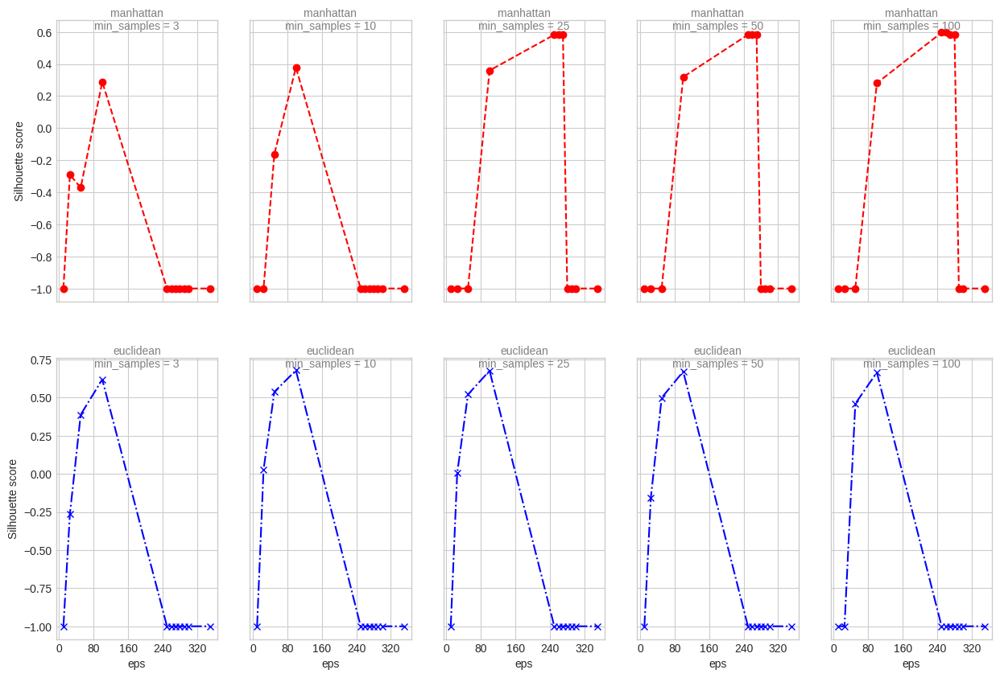

In [48]:
fig, ax = plt.subplots(scores.shape[0], scores.shape[1], figsize=(15, 10), sharex='col', sharey='row')
styles = ["--or", "-.xb"]

for row in range(scores.shape[0]):
    for col in range(scores.shape[1]):
        ax[row, col].plot(eps, scores[row, col, :], styles[row])
        ax[row, col].xaxis.set_major_locator(plt.MaxNLocator(5));
        ax[row, col].text(0.5, 0.965, f"{metrics_dict[row]}\nmin_samples = {min_samples[col]}", ha="center", size=10, color="grey",
                          transform=ax[row, col].transAxes);

        if col == 0:
            ax[row, col].set_ylabel("Silhouette score", fontsize=10)

        if row == scores.shape[0] - 1:
            ax[row, col].set_xlabel("eps", fontsize=10)

<br>Based on the silhouette score plots, the optimal `eps` value appears to be around 230, regardless of the `min_samples` parameter. However, the subsequent application of DBSCAN with these parameters resulted in all data points being assigned to a single cluster, indicating that DBSCAN did not effectively segment the data into meaningful clusters in this context. This suggests either a limitation of DBSCAN for this dataset or that the chosen metrics/parameters do not allow for distinct cluster separation.<br>

In [49]:
### Final model

model = DBSCAN(eps=70, min_samples=100, metric="euclidean", n_jobs=(-1))
clusters_2 = pd.Series(model.fit_predict(data_view), name="clusters_2")

print("DBSCAN Cluster Counts:")
print(clusters_2.value_counts())


DBSCAN Cluster Counts:
clusters_2
 0    1466
-1      40
Name: count, dtype: int64


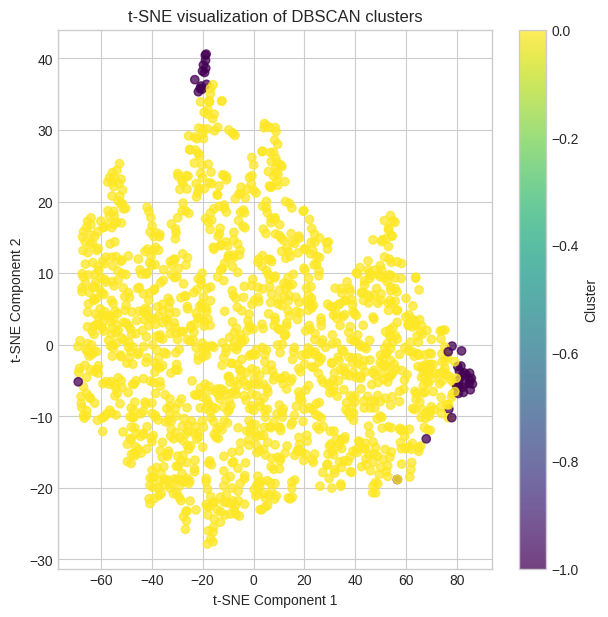

In [50]:
model = DBSCAN(eps=70, min_samples=100, metric="euclidean", n_jobs=(-1))
clusters_2 = pd.Series(model.fit_predict(data_view), name="clusters_2")

# Re-calculating t-SNE embeddings as requested, not using previous 'points'
new_points = TSNE(max_iter=2500, init="pca", random_state=21, n_jobs=(-1)).fit_transform(data_view)

fig, ax = plt.subplots(figsize=(7, 7))
scatter = ax.scatter(new_points[:, 0], new_points[:, 1], c=clusters_2, alpha=0.75, cmap='viridis')
ax.set_title("t-SNE visualization of DBSCAN clusters")
ax.set_xlabel("t-SNE Component 1")
ax.set_ylabel("t-SNE Component 2")
plt.colorbar(scatter, label="Cluster")
plt.show()

### t-SNE

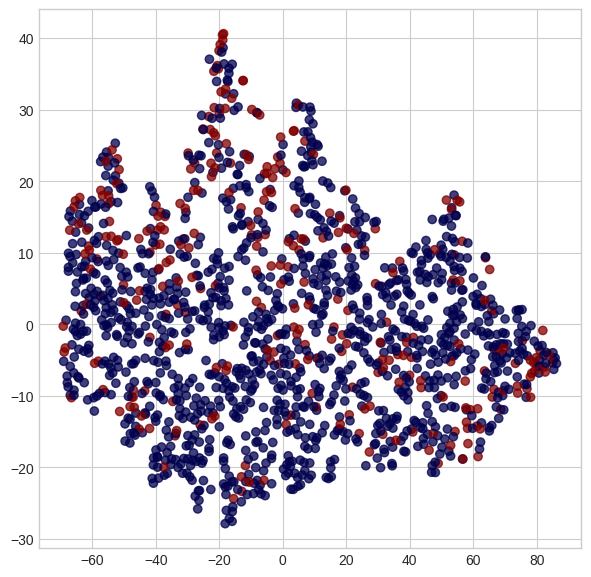

In [51]:
points = TSNE(max_iter=2500, init="pca", random_state=21, n_jobs=(-1)).fit_transform(data_view)

fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(points[:, 0], points[:, 1], c=data["target"], alpha=0.75, cmap="seismic");

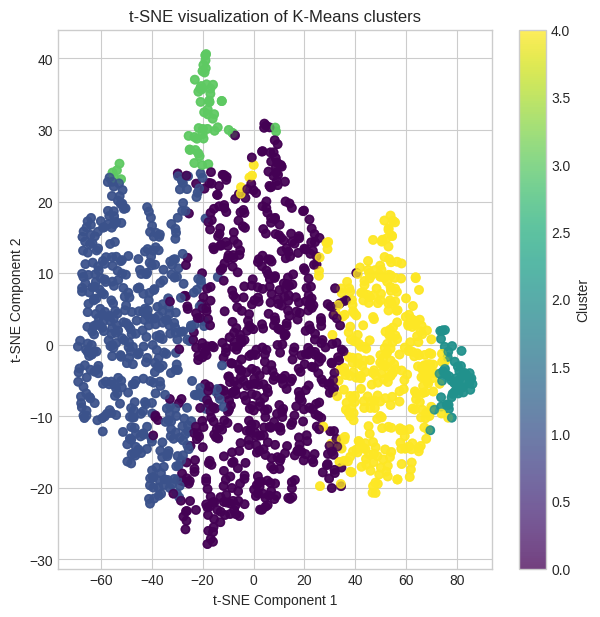

In [52]:
fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(points[:, 0], points[:, 1], c=clusters, alpha=0.75, cmap="viridis")
ax.set_title("t-SNE visualization of K-Means clusters")
ax.set_xlabel("t-SNE Component 1")
ax.set_ylabel("t-SNE Component 2")
plt.colorbar(ax.scatter(points[:, 0], points[:, 1], c=clusters, alpha=0.75, cmap="viridis"), label="Cluster")
plt.show()

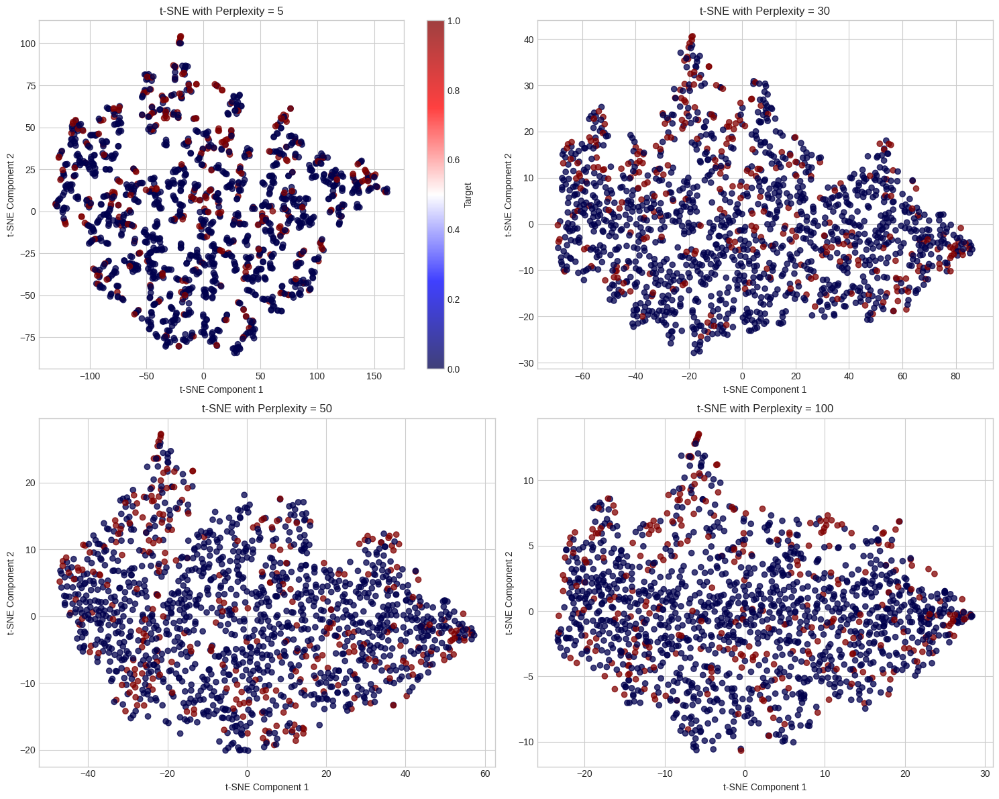

In [53]:
perplexities = [5, 30, 50, 100]

plt.figure(figsize=(15, 12))

for i, perplexity_val in enumerate(perplexities):
    # Re-calculate t-SNE for each perplexity
    tsne_points = TSNE(n_components=2, perplexity=perplexity_val, max_iter=2500, init="pca", random_state=21, n_jobs=(-1)).fit_transform(data_view)

    plt.subplot(2, 2, i + 1)
    scatter = plt.scatter(tsne_points[:, 0], tsne_points[:, 1], c=data["target"], alpha=0.75, cmap="seismic")
    plt.title(f"t-SNE with Perplexity = {perplexity_val}")
    plt.xlabel("t-SNE Component 1")
    plt.ylabel("t-SNE Component 2")
    # Add colorbar for consistency, but for binary target it's less critical
    if i == 0:
        plt.colorbar(scatter, label="Target")

plt.tight_layout()
plt.show()

By examining these plots, you can see how robust any potential separation of your target classes (0 and 1) is across different scales. If the two target classes remain highly intermingled across all perplexity levels, it suggests that they are not easily separable in the original high-dimensional feature space, implying that a linear or simple boundary might not effectively distinguish them. Conversely, if certain perplexities reveal some discernible separation or distinct regions for each target class, it could highlight important underlying structures related to the patient outcomes.

--- Typical Representatives (Medoids) for each K-Means Cluster ---

Cluster 0 Medoid (Original Index: 1078):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,bmi,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target
1078,2,59.580822,0,1,0,0,0,0,1,1,...,28.0,0,136.0,14.6,230.0,5.5,3.52,8.4,79.0,0



Cluster 1 Medoid (Original Index: 309):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,bmi,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target
309,2,69.0,0,0,0,0,0,0,0,0,...,29.7,0,143.0,11.2,172.0,6.9,4.5,8.4,84.0,0



Cluster 2 Medoid (Original Index: 606):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,bmi,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target
606,2,56.0,0,0,0,0,0,0,1,1,...,28.0,0,118.0,11.4,441.0,4.8,3.1,4.2,93.0,0



Cluster 3 Medoid (Original Index: 492):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,bmi,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target
492,2,68.0,0,0,1,0,0,0,1,1,...,26.2,0,126.0,15.5,243.0,4.0,2.09,6.5,175.0,0



Cluster 4 Medoid (Original Index: 482):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,bmi,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target
482,2,56.0,0,0,0,0,0,0,1,0,...,24.0,1,133.0,9.8,298.0,5.0,3.24,5.8,77.0,1


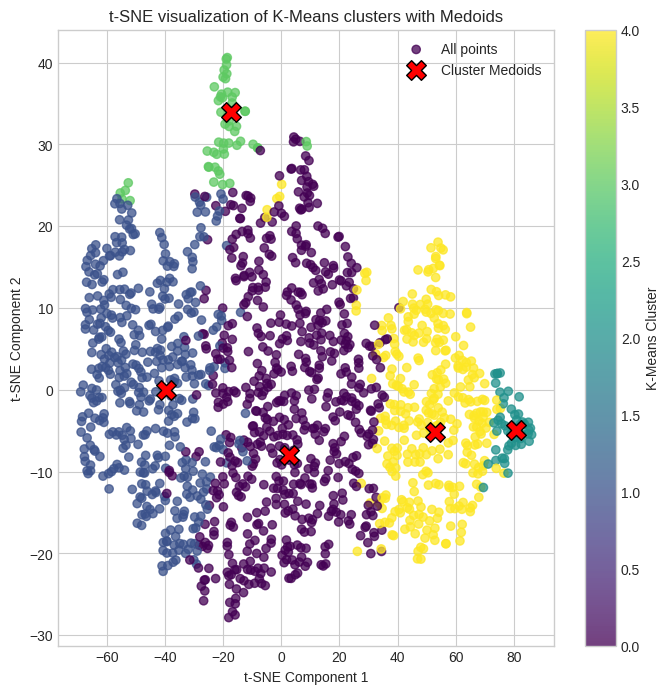

In [54]:
# The KMeans model was originally fitted with n_clusters=5. Re-instantiate it to ensure correctness.
kmeans_model = KMeans(n_clusters=5, n_init=25, random_state=21)
kmeans_model.fit(data_view) # Re-fit to ensure cluster_centers_ are available

# 2. Find medoids (representative samples) for each cluster
medoid_indices = []
for i in range(kmeans_model.n_clusters):
    # Get original indices of points belonging to the current cluster
    cluster_points_original_indices = clusters[clusters == i].index

    # Select the actual data points for this cluster from the data_view
    cluster_data_for_dist = data_view.loc[cluster_points_original_indices]

    # Get the centroid for the current cluster
    centroid = kmeans_model.cluster_centers_[i]

    # Calculate Euclidean distances from all points in the cluster to its centroid
    distances = np.linalg.norm(cluster_data_for_dist - centroid, axis=1)

    # Find the local index of the point with the minimum distance to the centroid
    medoid_local_idx = np.argmin(distances)

    # Get the original DataFrame index of this medoid point
    medoid_original_idx = cluster_points_original_indices[medoid_local_idx]
    medoid_indices.append(medoid_original_idx)

# 3. Display clinical characteristics of medoids
print("--- Typical Representatives (Medoids) for each K-Means Cluster ---")
for i, idx in enumerate(medoid_indices):
    print(f"\nCluster {i} Medoid (Original Index: {idx}):")
    # Display the full row from the `data` DataFrame (which includes 'target') for rich interpretation
    display(data.loc[[idx]])

# 4. Visualize on t-SNE plot with medoids highlighted
fig, ax = plt.subplots(figsize=(8, 8))

# Scatter plot of all points, colored by K-Means cluster
scatter_all = ax.scatter(points[:, 0], points[:, 1], c=clusters, alpha=0.75, cmap="viridis", label="All points")

# Highlight medoid points on the t-SNE plot
medoid_tsne_points = points[medoid_indices]
ax.scatter(
    medoid_tsne_points[:, 0],
    medoid_tsne_points[:, 1],
    marker='X', # Use a distinct marker
    s=200,      # Make them larger
    c='red',    # Give them a distinct color
    edgecolors='black',
    linewidths=1,
    label="Cluster Medoids"
)

ax.set_title("t-SNE visualization of K-Means clusters with Medoids")
ax.set_xlabel("t-SNE Component 1")
ax.set_ylabel("t-SNE Component 2")
plt.colorbar(scatter_all, label="K-Means Cluster")
plt.legend()
plt.grid(True)
plt.show()


In [55]:
numerical_features = data.select_dtypes(include=['number']).columns.drop('target')

cluster_means = data.groupby(clusters)[numerical_features].mean()

print("Mean of numerical features for each K-Means cluster:")
print(cluster_means)

Mean of numerical features for each K-Means cluster:
            doctor        age        af        dm       ckd      copd  \
clusters                                                                
0         1.376603  62.762895  0.129808  0.246795  0.059295  0.017628   
1         1.290541  65.979390  0.164414  0.250000  0.112613  0.040541   
2         1.340000  62.331178  0.140000  0.260000  0.120000  0.100000   
3         1.037037  69.356114  0.222222  0.462963  0.592593  0.037037   
4         1.326347  61.880346  0.134731  0.263473  0.107784  0.041916   

            insult      onco  severity    nstemi  ...  pulm_cong        bmi  \
clusters                                          ...                         
0         0.081731  0.011218  0.725962  0.181090  ...   0.073718  28.977976   
1         0.078829  0.018018  0.605856  0.159910  ...   0.092342  28.797163   
2         0.040000  0.020000  0.800000  0.200000  ...   0.180000  27.776022   
3         0.111111  0.018519  0.759259  

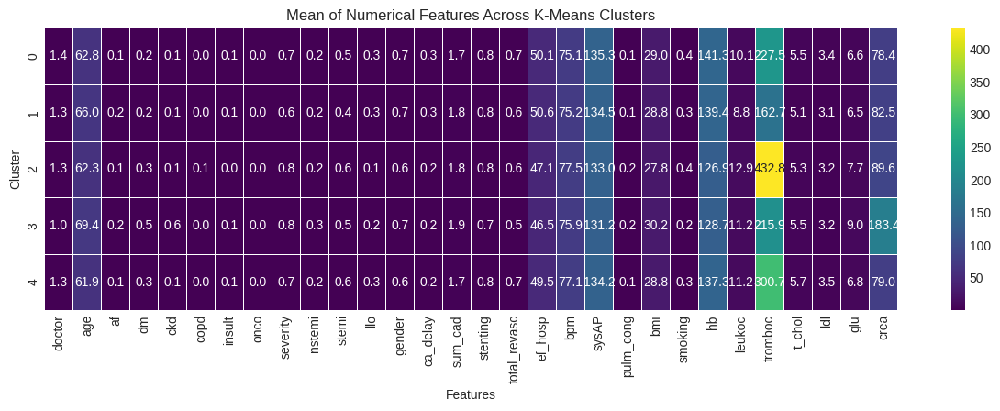

In [56]:
plt.figure(figsize=(15, 4))
sns.heatmap(cluster_means, annot=True, cmap='viridis', fmt=".1f", linewidths=.5)
plt.title('Mean of Numerical Features Across K-Means Clusters')
plt.xlabel('Features')
plt.ylabel('Cluster')
plt.show()

Тепловая карта, приведенная выше, наглядно представляет средние значения числовых характеристик для каждого из 5 кластеров с K-средним значением. Наблюдая за различиями в этих средних значениях по кластерам, мы можем сделать вывод, какие характеристики наиболее важны для отличия одного кластера от другого.

Например, если какой-либо признак показывает значительно более высокое среднее значение в кластере 3 по сравнению с другими, это означает, что этот признак в значительной степени характеризует пациентов в кластере 3. Этот анализ помогает нам понять лежащие в его основе закономерности и то, как различные клинические параметры влияют на группировку пациентов в отдельные сегменты K-средних.

**Интерпретация характеристик кластера из K-средних значений**

Основываясь на средних значениях числовых признаков для каждого кластера из K-средних значений, мы можем интерпретировать типичный профиль пациента в каждой группе:

**Кластер 0 (624 пациента):**
*   **Низкая смертность (целевой показатель: 7,37%):** Этот кластер отличается относительно низким уровнем смертности, что говорит о более стабильной группе пациентов.
*   **Младший возраст (61,61 года):** Эта группа немного моложе, чем в среднем по группе.
*   **Более высокий уровень наблюдения со стороны кардиолога (врач: 1,56, что указывает на более высокую долю пациентов, посещаемых кардиологом):** Пациенты в этой группе чаще наблюдаются у специалистов.
*   **Средние сопутствующие заболевания:** Показывает средние уровни для большинства сопутствующих заболеваний, таких как "af", "dm", "ckd" и "pulm_cong", по сравнению с другими кластерами.
*   **Профиль пациента:** Этот кластер представляет собой относительно здоровую группу, находящуюся под тщательным наблюдением, с умеренной тяжестью сердечных осложнений, но благоприятными исходами, вероятно, благодаря постоянному уходу специалиста.

**Кластер 1 (444 пациента):**
*   **Умеренная смертность (целевой показатель: 20,72%):** Этот кластер имеет более высокий уровень смертности, чем Кластер 0, что указывает на более уязвимую группу.
*   **Промежуточный возраст (65,98 года):** Возраст близок к среднему по набору данных.
*   **Умеренное наблюдение кардиологом (врач: 1,29):** Значительная часть этих пациентов находится под наблюдением специалиста.
*   **Слегка более высокая распространенность сопутствующих заболеваний:** Показывает слегка повышенную распространенность фибрилляции предсердий (af: 0,16), сахарного диабета (dm: 0,25), хронической болезни почек (ckd: 0,11) и застойной болезни легких (pulm_cong: 0,09) по сравнению с Кластером 0.
*   **Профиль пациента:** Этот кластер состоит из пациентов с умеренными сердечными проблемами, получающих постоянное специализированное внимание, но все еще сталкивающихся с заметным риском неблагоприятных исходов, возможно, из-за более высокого бремени сопутствующих заболеваний.

**Кластер 2 (50 пациентов):**
*   **Высокая смертность (целевой показатель: 32,00%):** Этот кластер демонстрирует один из самых высоких уровней смертности, что указывает на крайне уязвимую группу.
*   **Средний возраст (62,33 года):** Возраст схож со средним по выборке.
*   **Высокие показатели некоторых лабораторных исследований:** Характеризуется высокими значениями лейкоцитов (leukoc: 12,88), тромбоцитов (tromboc: 432,78), что может указывать на воспалительные процессы или другие патологии. Также повышен уровень глюкозы (glu: 7,68).
*   **Повышенная распространенность застойной болезни легких (pulm_cong: 0,18):** Более высокая доля пациентов с признаками венозного застоя крови в легких.
*   **Профиль пациента:** Этот небольшой, но критически важный кластер представляет пациентов с серьезными множественными сопутствующими заболеваниями и высокими показателями лабораторных исследований, что приводит к очень высокому риску неблагоприятных исходов.

**Кластер 3 (54 пациента):**
*   **Наивысшая смертность (целевой показатель: 46,30%):** Этот кластер демонстрирует самый высокий уровень смертности среди всех групп, что указывает на критически больную и высокорисковую популяцию пациентов.
*   **Промежуточный возраст (69,36 года):** Возраст этой группы выше среднего, но не самый высокий.
*   **Наименьшее специализированное наблюдение (врач: 1,04):** Наблюдение кардиологом менее распространено по сравнению с другими кластерами.
*   **Высокая тяжесть заболевания и количество пораженных коронарных артерий:** Этот кластер имеет одни из самых высоких средних значений по тяжести начальных сердечных событий (severity: 0,76) и количеству пораженных коронарных артерий (sum_cad: 1,91). Также очень высокий уровень хронической болезни почек (ckd: 0,59), сахарного диабета (dm: 0,46), креатинина (crea: 183,44) и глюкозы (glu: 8,96).
*   **Профиль пациента:** Это критически больная группа, характеризующаяся очень высокой смертностью, значительной тяжестью сердечных заболеваний, серьезными сопутствующими заболеваниями (диабет, ХБП) и наименьшим специализированным медицинским наблюдением, что способствует агрессивному прогрессированию заболевания и неблагоприятным исходам.

**Кластер 4 (334 пациента):**
*   **Умеренная смертность (целевой показатель: 18,86%):** Уровень смертности схож с Кластером 1, но с большим количеством пациентов.
*   **Младший возраст (61,88 года):** Этот кластер представляет относительно молодую группу пациентов.
*   **Высокое количество пораженных коронарных артерий (sum_cad: 1,74) и высокие показатели стентирования/реваскуляризации:** Пациенты здесь, как правило, имеют большое количество пораженных коронарных артерий и высокие показатели вмешательств, таких как стентирование и полная реваскуляризация, что указывает на историю значительных кардиологических вмешательств.
*   **Повышенный уровень холестерина (t_chol: 5,70, ldl: 3,54) и тромбоцитов (tromboc: 300,70):** Более высокие средние значения этих показателей могут указывать на повышенный риск сердечно-сосудистых осложнений.
*   **Профиль пациента:** Этот кластер представляет пациентов, перенесших значительные кардиологические вмешательства, что говорит о предшествующей серьезной сердечной патологии. Несмотря на вмешательства, они сталкиваются с умеренным риском смертности, вероятно, из-за таких факторов, как высокий уровень холестерина и тромбоцитов.

**Общий вывод по K-средним кластеризации:**

Кластеризация методом K-средних эффективно сегментирует популяцию пациентов на группы с различными профилями риска и характеристиками здоровья. Мы видим спектр от относительно стабильных пациентов, находящихся под наблюдением специалистов (Кластер 0), до крайне уязвимых групп с очень высокой смертностью, часто связанной с тяжелыми сопутствующими заболеваниями и потенциально недостаточным специализированным мониторингом (Кластеры 2, 3 и 4). Эта сегментация может быть ценной для понимания здоровья населения, выявления лиц из групп риска и разработки индивидуальных медицинских вмешательств.

### K-modes

In [57]:
!pip install KModes -q

In [58]:
!pip install kneed -q

In [59]:
from kmodes import kmodes


In [60]:
data_kmodes = data.copy()

# Identify numerical features
numerical_features = data_kmodes.select_dtypes(include=np.number).columns.tolist()

# Exclude binary features from continuous features for binning
binary_features = [col for col in numerical_features if data_kmodes[col].nunique() <= 2]

# Features to be binned (continuous features)
continuous_features_kmodes = [col for col in numerical_features if col not in binary_features]

print(f"Identified continuous features for K-modes: {continuous_features_kmodes}")

Identified continuous features for K-modes: ['doctor', 'age', 'sum_cad', 'ef_hosp', 'bpm', 'sysAP', 'bmi', 'hb', 'leukoc', 'tromboc', 't_chol', 'ldl', 'glu', 'crea']


Continuous features have been identified and convert them into 5 equal-frequency categorical bins using `pd.qcut`. For features that are already categorical (binary features and the 'doctor' column which has multiple discrete values), The 'target' column will be excluded from this preparation as it is not used for clustering.



In [61]:
for col in continuous_features_kmodes:
    # Using qcut for equal-frequency bins
    data_kmodes[col] = pd.qcut(data_kmodes[col], q=5, duplicates='drop').astype('object')

# Ensure all remaining features are of object type for K-modes
for col in data_kmodes.columns:
    if col not in continuous_features_kmodes and col != 'target': # Exclude target column from clustering input
        data_kmodes[col] = data_kmodes[col].astype('object')

#print("Data prepared for K-modes clustering. Head of the processed DataFrame:")
#print(data_kmodes.head())

To find the optimal number of clusters for K-modes implement the elbow method. This involves iterating through a range of possible cluster numbers (2 to 20), fitting a K-modes model for each, recording its cost, and then plotting these costs to identify the 'elbow point'.



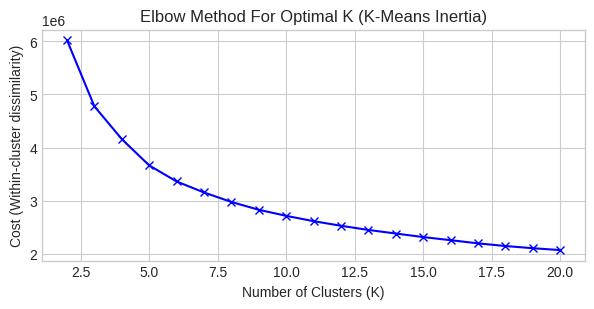

In [62]:
from kneed import KneeLocator
from sklearn.cluster import KMeans # Import KMeans
import numpy as np # Ensure numpy is imported
import matplotlib.pyplot as plt # Ensure matplotlib is imported

# Calculate K-Means inertia scores for the elbow method
scores = np.empty(shape=19, dtype=np.float64)

for i in range(2, 20 + 1):
    model = KMeans(n_clusters=i, n_init=25, random_state=21)
    model.fit(data.iloc[:, :(-1)]) # Use the full 'data' numerical features

    scores[i - 2] = model.inertia_

# Ensure K_np is the range of K values and cost_np is the calculated inertia scores
K_np = np.arange(2, 20 + 1) # This is the X-axis (number of clusters)
cost_np = scores # This is the Y-axis (inertia)

# Use KneeLocator to find the elbow point
# curve='convex' and direction='decreasing' are appropriate for cost functions like inertia
kneelocator = KneeLocator(K_np, cost_np, S=1.0, curve='convex', direction='decreasing', interp_method='polynomial')

optimal_k_value_calculated = kneelocator.elbow

plt.figure(figsize=(7, 3))
ax = plt.gca() # Get current axes
ax.plot(K_np, cost_np, 'bx-')
ax.set_xlabel('Number of Clusters (K)')
ax.set_ylabel('Cost (Within-cluster dissimilarity)')
ax.set_title('Elbow Method For Optimal K (K-Means Inertia)')
ax.grid(True)


In [63]:
print(optimal_k_value_calculated)

7


In [64]:

if optimal_k_value_calculated is not None:
    # Find the cost at the calculated optimal K to place the text correctly
    optimal_k_cost_calculated = cost_np[np.where(K_np == optimal_k_value_calculated)[0][0]]

    ax.axvline(x=optimal_k_value_calculated, color='red', linestyle='--', label=f'Calculated Optimal K = {optimal_k_value_calculated}')
    ax.text(optimal_k_value_calculated + 0.5, optimal_k_cost_calculated, f'  Elbow point (K={optimal_k_value_calculated})', color='red', ha='left', va='center')

    # Add explanation for the elbow method on the plot, emphasizing the 'maximum of tangent' or curvature concept
    ax.text(optimal_k_value_calculated + 1, cost_np[0] * 0.95,
            "The 'elbow' is identified as the point of maximum curvature (where the change in tangent is greatest). \n"
            "It signifies where adding more clusters yields diminishing returns in reducing within-cluster dissimilarity, \n"
            "providing a good balance before overfitting occurs.",
            color='dimgray', fontsize=9, ha='left', va='top')
else:
    ax.text(K_np.max() * 0.7, cost_np[0] * 0.95,
            "No clear elbow point was automatically detected by KneeLocator.",
            color='dimgray', fontsize=9, ha='left', va='top')

ax.legend()
plt.show()

Based on the elbow plot, the elbow point appears to be around K=6. This suggests that 6 is the optimal number of clusters for K-modes. Fit the K-modes model with 6 clusters, assign the cluster labels back to the original `data` DataFrame, and then proceed to analyze the characteristics of these newly formed clusters.

In [65]:
optimal_k = optimal_k_value_calculated - 1 # Use the calculated optimal K

km_optimal = kmodes.KModes(n_clusters=optimal_k, init='Huang', n_init=5, verbose=0, random_state=21)
clusters_kmodes = km_optimal.fit_predict(data_kmodes.drop(columns=['target']))

data['clusters_kmodes'] = clusters_kmodes

print("K-modes clusters added to the original DataFrame. Head of the updated DataFrame:")
print(data.head())

K-modes clusters added to the original DataFrame. Head of the updated DataFrame:
   doctor   age  af  dm  ckd  copd  insult  onco  severity  nstemi  ...  \
0       1  79.0   0   1    0     0       0     0         0       0  ...   
1       1  61.0   1   1    0     0       0     1         1       1  ...   
2       1  49.0   0   0    0     0       0     0         1       1  ...   
3       2  59.0   0   0    0     0       0     0         1       0  ...   
4       2  55.0   0   0    0     0       0     0         1       0  ...   

   smoking     hb  leukoc  tromboc  t_chol   ldl  glu   crea  target  \
0        0   84.0     7.1    213.0     2.2  1.06  8.7  117.0       0   
1        0  166.0     9.4    225.0     5.8  3.61  4.4   94.0       0   
2        1  150.0    10.5    208.0     7.4  5.09  3.9   74.0       0   
3        1  142.0     5.1     58.0     5.3  3.30  4.2   86.0       0   
4        1  151.0     7.7    305.0     7.3  5.07  4.3   96.0       0   

   clusters_kmodes  
0             

The core of the elbow method for K-Modes is to compute the cost (a measure of within-cluster dissimilarity) for each possible number of clusters (K). The code below iterates through K from 2 to 20, fits a K-Modes model for each K, and records its cost. The `cost` array generated by this loop *is* the computation of the elbow curve data.

--- Typical Representatives (Medoids) for each K-Modes Cluster ---

Cluster 0 Medoid (Original Index: 457):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
457,2,53.0,0,0,0,0,0,0,0,0,...,1,135.0,3.3,130.0,2.9,1.85,3.7,64.0,0,0



Cluster 1 Medoid (Original Index: 439):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
439,1,65.0,0,0,0,0,0,0,1,0,...,0,99.0,9.2,217.0,5.8,3.55,4.6,52.0,0,1



Cluster 2 Medoid (Original Index: 1177):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
1177,2,45.0,0,0,0,0,0,0,1,0,...,1,158.0,21.1,310.0,4.9,3.12,5.9,55.0,0,2



Cluster 3 Medoid (Original Index: 760):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
760,2,65.0,0,0,1,0,0,0,1,0,...,0,114.0,9.6,248.0,3.8,1.89,4.4,225.0,0,3



Cluster 4 Medoid (Original Index: 735):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
735,2,53.0,0,0,0,0,0,0,1,0,...,1,178.0,7.9,208.0,5.3,3.24,5.5,59.0,0,4



Cluster 5 Medoid (Original Index: 211):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
211,2,78.0,0,0,0,0,0,0,1,1,...,0,139.0,7.1,184.0,5.3,3.24,5.5,66.0,0,5


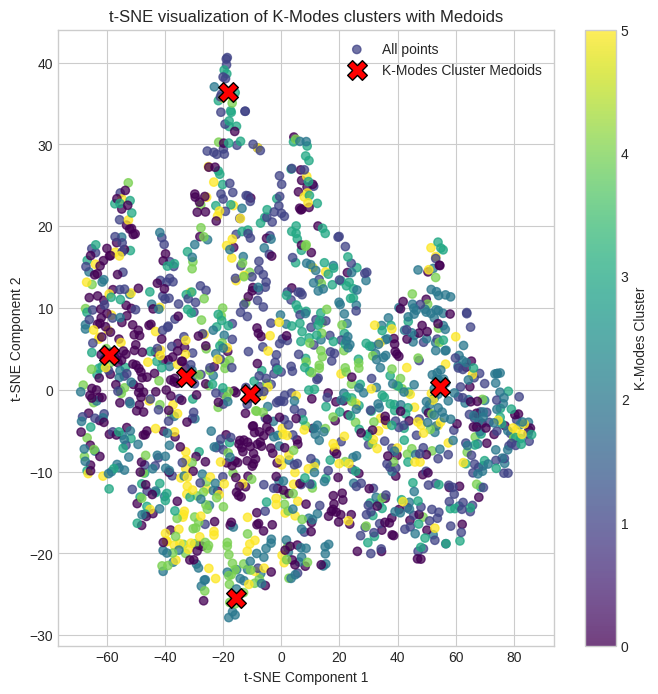

In [66]:
def kmodes_dissimilarity(point_row, mode_array):
    """Calculates Hamming distance between a data point (Series/array) and a K-modes mode."""
    # Ensure both are of comparable type, convert mode to Series for alignment if point_row is Series
    if isinstance(point_row, pd.Series):
        mode_series = pd.Series(mode_array, index=point_row.index, dtype=point_row.dtype)
    else:
        mode_series = mode_array # Assume point_row is also array-like

    return np.sum(point_row != mode_series)


kmodes_medoid_indices = []
# Iterate through each cluster identified by K-modes
for i in range(km_optimal.n_clusters):
    # Get original DataFrame indices of points belonging to the current cluster
    cluster_points_original_indices = data[data['clusters_kmodes'] == i].index

    # Select the actual binned data points for this cluster from data_kmodes (excluding 'target')
    cluster_data_for_dist = data_kmodes.loc[cluster_points_original_indices].drop(columns=['target'], errors='ignore')

    # Get the mode (representative values) for the current cluster from the KModes model
    mode = km_optimal.cluster_centroids_[i] # Corrected attribute here

    dissimilarities = []
    for idx, row in cluster_data_for_dist.iterrows():
        dissimilarities.append(kmodes_dissimilarity(row, mode))

    # Find the local index within the cluster data that has the minimum dissimilarity to the mode
    medoid_local_idx = np.argmin(dissimilarities)

    # Get the original DataFrame index of this medoid point
    medoid_original_idx = cluster_points_original_indices[medoid_local_idx]
    kmodes_medoid_indices.append(medoid_original_idx)

# 3. Display clinical characteristics of medoids from the ORIGINAL data DataFrame
print("--- Typical Representatives (Medoids) for each K-Modes Cluster ---")
for i, idx in enumerate(kmodes_medoid_indices):
    print(f"\nCluster {i} Medoid (Original Index: {idx}):")
    # Display the full row from the `data` DataFrame (which includes original values and 'target')
    display(data.loc[[idx]])

# 4. Visualize on t-SNE plot with medoids highlighted
# Reuse 'points' which is the t-SNE embedding of the original numerical data_view
fig, ax = plt.subplots(figsize=(8, 8))

# Scatter plot of all points, colored by K-Modes cluster labels
scatter_all = ax.scatter(points[:, 0], points[:, 1], c=data['clusters_kmodes'], alpha=0.75, cmap="viridis", label="All points")

# Highlight medoid points on the t-SNE plot
# Get the t-SNE coordinates for the identified K-modes medoids
kmodes_medoid_tsne_points = points[kmodes_medoid_indices]
ax.scatter(
    kmodes_medoid_tsne_points[:, 0],
    kmodes_medoid_tsne_points[:, 1],
    marker='X', # Use a distinct marker
    s=200,      # Make them larger
    c='red',    # Give them a distinct color
    edgecolors='black',
    linewidths=1,
    label="K-Modes Cluster Medoids"
)

ax.set_title("t-SNE visualization of K-Modes clusters with Medoids")
ax.set_xlabel("t-SNE Component 1")
ax.set_ylabel("t-SNE Component 2")
plt.colorbar(scatter_all, label="K-Modes Cluster")
plt.legend()
plt.grid(True)
plt.show()

This plot helps us understand how well the clusters are separated in a reduced-dimension space and where their representative 'medoid' points lie. Each color represents a different K-modes cluster, and the red 'X' markers show the medoids for each group.

**Интерпретация кластеров с медоидами в методе K-Modes**

Медоиды — это фактические точки данных внутри кластера, которые наиболее репрезентативны для этого кластера. В отличие от центроидов (которые представляют собой средние значения и могут не соответствовать ни одному реальному наблюдению), медоиды являются реальными наблюдениями, что делает их особенно полезными для интерпретации кластеров, особенно в случае категориальных данных, где усреднение может быть бессмысленным.

1.  **Репрезентативность**: Каждый медоид — это точка данных, имеющая наименьшее среднее расхождение со всеми остальными точками своего кластера. Изучая клинические характеристики медоида для каждого кластера (как показано ранее), вы получаете конкретный пример «типичного» пациента в этом кластере. Если характеристики этих медоидов логичны в медицинском контексте и отличаются от характеристик других медоидов, это свидетельствует об эффективности кластеризации.

2.  **Внутренняя сплочённость**: «Хорошая» кластеризация приводит к тому, что точки данных внутри одного кластера похожи друг на друга и отличаются от точек данных в других кластерах. Хотя K-modes оптимизирует функцию расхождения, проверка близости медоида к другим членам кластера (что неявно заложено в его выборе) подтверждает это. Низкое внутрикластерное расхождение (стоимость), которое мы оптимизировали при помощи метода локтя, указывает на такую сплочённость.

3.  **Визуальное разделение на t-SNE**: Визуализация t-SNE (например, `j6uU2ziirOcm`) помогает визуально оценить, насколько хорошо кластеры разделены в пространстве сниженной размерности. Если точки для каждого кластера K-modes (окрашенные по-разному) образуют относительно чёткие визуальные группы, а медоиды (красные маркеры в виде «X») расположены центрально внутри этих групп, это указывает на хорошее разделение и на то, что медоиды являются удачными представителями кластеров.

4.  **Распределение целевой переменной**: Наша основная цель часто заключается в понимании паттернов, связанных с целевой переменной (в данном случае — летальность). Как видно из вывода для «Средняя доля 'target' по кластерам K-modes»:
    *   **Кластер 3 (16,23%)** имеет значительно более высокий уровень летальности по сравнению с **Кластером 4 (5,50%)** и **Кластером 1 (7,21%)**.
    *   Такое различие в показателях летальности между кластерами указывает на то, что кластеризация успешно сгруппировала пациентов с разным уровнем риска, что является сильным индикатором её практической ценности. Кластеры не случайны: они отражают значимые различия, связанные с исходами для пациентов.

5.  **Интерпретируемость характеристик медоидов**: После выявления медоидов вы можете детально изучить их конкретные клинические значения из исходного датафрейма `data`. Например, если медоид Кластера 3 часто демонстрирует более высокие значения по признакам «тяжесть состояния», «возраст» или наличие коморбидностей, а медоид Кластера 4 — более низкие значения по этим же признакам, это укрепляет аргументацию в пользу качества кластеризации.

В целом, «качество» кластеров с медоидами оценивается по их способности точно представлять свои группы, по чёткости различий в их характеристиках (особенно в отношении ключевых исходов, таких как летальность) и по визуальному разделению, которое они демонстрируют. Если эти аспекты согласованы и информативны, кластеры с медоидами действительно «достаточно хороши» для получения ценных инсайтов о популяции пациентов.

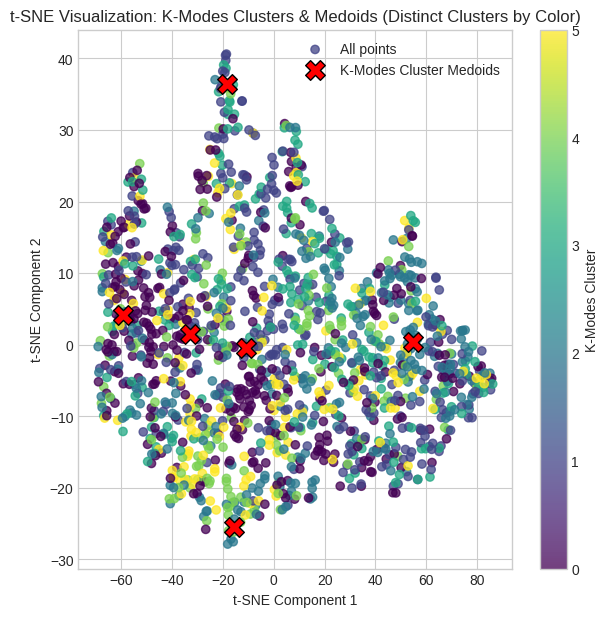

In [67]:
fig, ax = plt.subplots(figsize=(7, 7))

# Scatter plot of all points, colored by K-Modes cluster labels
# Each color represents a distinct K-Modes cluster found by the algorithm.
scatter_all = ax.scatter(points[:, 0], points[:, 1], c=data['clusters_kmodes'], alpha=0.75, cmap="viridis", label="All points")

# Highlight medoid points on the t-SNE plot
# These red 'X' markers show the most representative data point for each cluster.
kmodes_medoid_tsne_points = points[kmodes_medoid_indices]
ax.scatter(
    kmodes_medoid_tsne_points[:, 0],
    kmodes_medoid_tsne_points[:, 1],
    marker='X', # Use a distinct marker
    s=200,      # Make them larger
    c='red',    # Give them a distinct color
    edgecolors='black',
    linewidths=1,
    label="K-Modes Cluster Medoids"
)

ax.set_title("t-SNE Visualization: K-Modes Clusters & Medoids (Distinct Clusters by Color)")
ax.set_xlabel("t-SNE Component 1")
ax.set_ylabel("t-SNE Component 2")
plt.colorbar(scatter_all, label="K-Modes Cluster")
plt.legend()
plt.grid(True)
plt.show()

In [68]:
print("K-modes Cluster Counts:")
display(data['clusters_kmodes'].value_counts().sort_index())

print("\nMean 'target' proportion per K-modes Cluster:")
display(data.groupby('clusters_kmodes')['target'].mean().sort_index())

K-modes Cluster Counts:


,count
clusters_kmodes,
0,356
1,325
2,296
3,206
4,158
5,165



Mean 'target' proportion per K-modes Cluster:


,target
clusters_kmodes,
0,0.134831
1,0.320000
2,0.131757
3,0.266990
4,0.101266
5,0.212121


In [69]:
def kmodes_dissimilarity(point_row, mode_array):
    """Calculates Hamming distance between a data point (Series/array) and a K-modes mode."""
    if isinstance(point_row, pd.Series):
        mode_series = pd.Series(mode_array, index=point_row.index, dtype=point_row.dtype)
    else:
        mode_series = mode_array

    return np.sum(point_row != mode_series)

kmodes_medoid_indices = []
# Iterate through each cluster identified by K-modes
for i in range(km_optimal.n_clusters):
    # Get original DataFrame indices of points belonging to the current cluster
    cluster_points_original_indices = data[data['clusters_kmodes'] == i].index

    # Select the actual binned data points for this cluster from data_kmodes (excluding 'target')
    cluster_data_for_dist = data_kmodes.loc[cluster_points_original_indices].drop(columns=['target'], errors='ignore')

    # Get the mode (representative values) for the current cluster from the KModes model
    mode = km_optimal.cluster_centroids_[i]

    dissimilarities = []
    for idx, row in cluster_data_for_dist.iterrows():
        dissimilarities.append(kmodes_dissimilarity(row, mode))

    # Find the local index within the cluster data that has the minimum dissimilarity to the mode
    medoid_local_idx = np.argmin(dissimilarities)

    # Get the original DataFrame index of this medoid point
    medoid_original_idx = cluster_points_original_indices[medoid_local_idx]
    kmodes_medoid_indices.append(medoid_original_idx)

# Display clinical characteristics of medoids from the ORIGINAL data DataFrame
print("--- Typical Representatives (Medoids) for each K-Modes Cluster ---")
for i, idx in enumerate(kmodes_medoid_indices):
    print(f"\nCluster {i} Medoid (Original Index: {idx}):")
    # Display the full row from the `data` DataFrame (which includes original values and 'target')
    display(data.loc[[idx]])

--- Typical Representatives (Medoids) for each K-Modes Cluster ---

Cluster 0 Medoid (Original Index: 457):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
457,2,53.0,0,0,0,0,0,0,0,0,...,1,135.0,3.3,130.0,2.9,1.85,3.7,64.0,0,0



Cluster 1 Medoid (Original Index: 439):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
439,1,65.0,0,0,0,0,0,0,1,0,...,0,99.0,9.2,217.0,5.8,3.55,4.6,52.0,0,1



Cluster 2 Medoid (Original Index: 1177):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
1177,2,45.0,0,0,0,0,0,0,1,0,...,1,158.0,21.1,310.0,4.9,3.12,5.9,55.0,0,2



Cluster 3 Medoid (Original Index: 760):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
760,2,65.0,0,0,1,0,0,0,1,0,...,0,114.0,9.6,248.0,3.8,1.89,4.4,225.0,0,3



Cluster 4 Medoid (Original Index: 735):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
735,2,53.0,0,0,0,0,0,0,1,0,...,1,178.0,7.9,208.0,5.3,3.24,5.5,59.0,0,4



Cluster 5 Medoid (Original Index: 211):


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target,clusters_kmodes
211,2,78.0,0,0,0,0,0,0,1,1,...,0,139.0,7.1,184.0,5.3,3.24,5.5,66.0,0,5


### Резюме раздела

--- Clinical Characteristics of K-Means Medoids ---


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,clustering_method,cluster_id
1078,2,59.580822,0,1,0,0,0,0,1,1,...,0,136.0,14.6,230.0,5.5,3.52,8.4,79.0,KMeans,0
309,2,69.000000,0,0,0,0,0,0,0,0,...,0,143.0,11.2,172.0,6.9,4.50,8.4,84.0,KMeans,1
606,2,56.000000,0,0,0,0,0,0,1,1,...,0,118.0,11.4,441.0,4.8,3.10,4.2,93.0,KMeans,2
492,2,68.000000,0,0,1,0,0,0,1,1,...,0,126.0,15.5,243.0,4.0,2.09,6.5,175.0,KMeans,3
482,2,56.000000,0,0,0,0,0,0,1,0,...,1,133.0,9.8,298.0,5.0,3.24,5.8,77.0,KMeans,4



--- Clinical Characteristics of K-Modes Medoids ---


,doctor,age,af,dm,ckd,copd,insult,onco,severity,nstemi,...,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,clustering_method,cluster_id
457,2,53.0,0,0,0,0,0,0,0,0,...,1,135.0,3.3,130.0,2.9,1.85,3.7,64.0,KModes,0
439,1,65.0,0,0,0,0,0,0,1,0,...,0,99.0,9.2,217.0,5.8,3.55,4.6,52.0,KModes,1
1177,2,45.0,0,0,0,0,0,0,1,0,...,1,158.0,21.1,310.0,4.9,3.12,5.9,55.0,KModes,2
760,2,65.0,0,0,1,0,0,0,1,0,...,0,114.0,9.6,248.0,3.8,1.89,4.4,225.0,KModes,3
735,2,53.0,0,0,0,0,0,0,1,0,...,1,178.0,7.9,208.0,5.3,3.24,5.5,59.0,KModes,4
211,2,78.0,0,0,0,0,0,0,1,1,...,0,139.0,7.1,184.0,5.3,3.24,5.5,66.0,KModes,5



--- Differences in Clinical Characteristics of Medoids (K-Means vs. K-Modes) ---
Absolute Differences for Cluster 0 Medoid (KMeans vs KModes):


,0
tromboc,100.000000
crea,15.000000
leukoc,11.300000
ef_hosp,10.400000
bmi,7.900000
age,6.580822
glu,4.700000
bpm,4.000000
t_chol,2.600000
sum_cad,2.000000


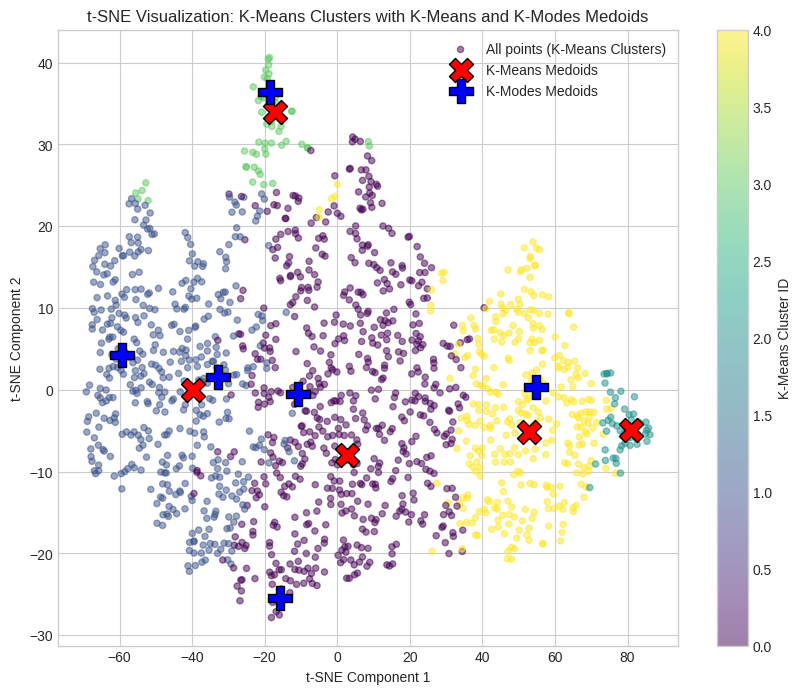

In [70]:
km_optimal = kmodes.KModes(n_clusters=optimal_k, init='Huang', n_init=5, verbose=0, random_state=21)
clusters_kmodes = km_optimal.fit_predict(data_kmodes.drop(columns=['target']))

kmeans_model = KMeans(n_clusters=5, n_init=25, random_state=21)

kmeans_medoids_data = data.loc[medoid_indices].copy()
kmeans_medoids_data['clustering_method'] = 'KMeans'
kmeans_medoid_id_map = {idx: i for i, idx in enumerate(medoid_indices)}
kmeans_medoids_data['cluster_id'] = kmeans_medoids_data.index.map(kmeans_medoid_id_map)

kmodes_medoids_data = data.loc[kmodes_medoid_indices].copy()
kmodes_medoids_data['clustering_method'] = 'KModes'
kmodes_medoid_id_map = {idx: i for i, idx in enumerate(kmodes_medoid_indices)}
kmodes_medoids_data['cluster_id'] = kmodes_medoids_data.index.map(kmodes_medoid_id_map)

all_medoids = pd.concat([kmeans_medoids_data, kmodes_medoids_data])

print("--- Clinical Characteristics of K-Means Medoids ---")
display(kmeans_medoids_data.drop(columns=['clusters_kmodes', 'target']).sort_values(by='cluster_id'))

print("\n--- Clinical Characteristics of K-Modes Medoids ---")
display(kmodes_medoids_data.drop(columns=['clusters_kmodes', 'target']).sort_values(by='cluster_id'))

print("\n--- Differences in Clinical Characteristics of Medoids (K-Means vs. K-Modes) ---")
# For simplicity, let's compare the medoid of cluster 0 from each method as an example
# A more comprehensive comparison would involve matching similar clusters or pairwise differences

# Get numerical features that are not cluster IDs or target
numerical_cols_for_diff = data.select_dtypes(include=np.number).columns.drop(['target', 'clusters_kmodes'])

kmeans_medoid_0 = kmeans_medoids_data[kmeans_medoids_data['cluster_id'] == 0][numerical_cols_for_diff].iloc[0]
kmodes_medoid_0 = kmodes_medoids_data[kmodes_medoids_data['cluster_id'] == 0][numerical_cols_for_diff].iloc[0]

difference_0 = (kmeans_medoid_0 - kmodes_medoid_0).abs().sort_values(ascending=False)
print("Absolute Differences for Cluster 0 Medoid (KMeans vs KModes):")
display(difference_0)

# Visualization on t-SNE plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot all points, colored by K-Means clusters
scatter_kmeans = ax.scatter(points[:, 0], points[:, 1], c=clusters, alpha=0.5, cmap="viridis", label="All points (K-Means Clusters)", s=20)

# Highlight K-Means medoids
kmeans_medoid_tsne_points = points[medoid_indices]
ax.scatter(
    kmeans_medoid_tsne_points[:, 0],
    kmeans_medoid_tsne_points[:, 1],
    marker='X', # Use a distinct marker
    s=300,      # Make them larger
    c='red',    # Give them a distinct color
    edgecolors='black',
    linewidths=1,
    label="K-Means Medoids"
)

# Highlight K-Modes medoids
kmodes_medoid_tsne_points = points[kmodes_medoid_indices]
ax.scatter(
    kmodes_medoid_tsne_points[:, 0],
    kmodes_medoid_tsne_points[:, 1],
    marker='P', # Use a different distinct marker
    s=300,      # Make them larger
    c='blue',    # Give them a distinct color
    edgecolors='black',
    linewidths=1,
    label="K-Modes Medoids"
)

ax.set_title("t-SNE Visualization: K-Means Clusters with K-Means and K-Modes Medoids")
ax.set_xlabel("t-SNE Component 1")
ax.set_ylabel("t-SNE Component 2")
plt.colorbar(scatter_kmeans, label="K-Means Cluster ID")
plt.legend()
plt.grid(True)
plt.show()

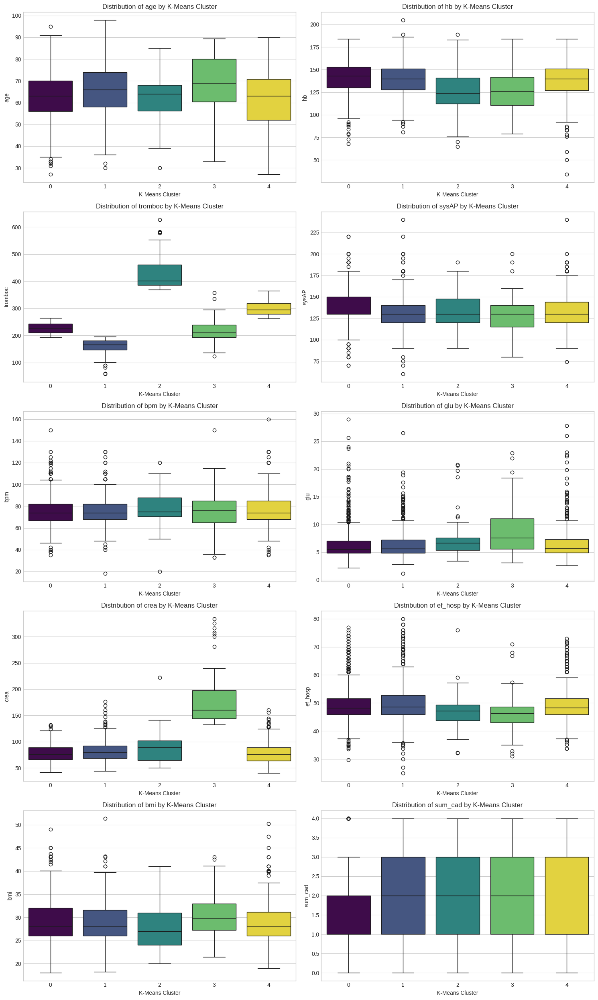

In [71]:
numerical_cols = data.select_dtypes(include=np.number).columns.drop(['target', 'clusters_kmodes', 'doctor'])

# Select a subset of features that showed significant differences or are generally important
features_to_plot = ['age', 'hb', 'tromboc', 'sysAP', 'bpm', 'glu', 'crea', 'ef_hosp', 'bmi', 'sum_cad']

# Filter to only include features that are actually numerical and exist in the dataframe
features_to_plot = [f for f in features_to_plot if f in numerical_cols]

# Add the KMeans cluster labels to the original data for plotting
data_with_clusters = data.copy()
data_with_clusters['kmeans_cluster'] = clusters

# Create box plots for each selected numerical feature across the K-Means clusters
num_features = len(features_to_plot)
num_rows = (num_features + 1) // 2  # Arrange in 2 columns

fig, axes = plt.subplots(num_rows, 2, figsize=(15, 5 * num_rows))
axes = axes.flatten() # Flatten the array of axes for easy iteration

for i, feature in enumerate(features_to_plot):
    sns.boxplot(x='kmeans_cluster', y=feature, data=data_with_clusters, ax=axes[i], hue='kmeans_cluster', palette='viridis', legend=False)
    axes[i].set_title(f'Distribution of {feature} by K-Means Cluster')
    axes[i].set_xlabel('K-Means Cluster')
    axes[i].set_ylabel(feature)

# Remove any unused subplots if the number of features is odd
if num_features < len(axes):
    for j in range(num_features, len(axes)):
        fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Решаем задачу предсказания с обучением

### Подготовка выборки: разделяем train/test и делаем Standard scaling

In [72]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1506 entries, 0 to 1505
Data columns (total 32 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   doctor           1506 non-null   int64  
 1   age              1506 non-null   float64
 2   af               1506 non-null   int64  
 3   dm               1506 non-null   int64  
 4   ckd              1506 non-null   int64  
 5   copd             1506 non-null   int64  
 6   insult           1506 non-null   int64  
 7   onco             1506 non-null   int64  
 8   severity         1506 non-null   int64  
 9   nstemi           1506 non-null   int64  
 10  stemi            1506 non-null   int64  
 11  llo              1506 non-null   int64  
 12  gender           1506 non-null   int64  
 13  ca_delay         1506 non-null   int64  
 14  sum_cad          1506 non-null   int64  
 15  stenting         1506 non-null   int64  
 16  total_revasc     1506 non-null   int64  
 17  ef_hosp       

In [73]:
print("Descriptive statistics for 'clusters_kmodes':")
data['clusters_kmodes'].value_counts().sort_index()

Descriptive statistics for 'clusters_kmodes':


,count
clusters_kmodes,
0,356
1,325
2,296
3,206
4,158
5,165


In [74]:
X, y = data.iloc[:, :(-1)], data.iloc[:, -1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)

X_train.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)

y_train.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

In [75]:
feat_to_scale = ['age', 'ef_hosp', 'bmi', 'bpm', 'sysAP', 'hb', 'leukoc', 'tromboc', 't_chol', 'ldl', 'glu', 'crea']

In [76]:
scaler = StandardScaler()
scaler.fit(X_train[feat_to_scale])

X_train[feat_to_scale] = scaler.transform(X_train[feat_to_scale])
X_test[feat_to_scale] = scaler.transform(X_test[feat_to_scale])

X_train[feat_to_scale].agg(func=["mean", "std"])

,age,ef_hosp,bmi,bpm,sysAP,hb,leukoc,tromboc,t_chol,ldl,glu,crea
mean,5.665457e-16,2.655683e-17,3.083543e-16,-3.068789e-16,2.655683e-16,3.157312e-16,-1.917993e-16,4.293354e-16,1.888486e-16,1.711440e-16,-1.895863e-16,3.791725e-16
std,1.000416e+00,1.000416e+00,1.000416e+00,1.000416e+00,1.000416e+00,1.000416e+00,1.000416e+00,1.000416e+00,1.000416e+00,1.000416e+00,1.000416e+00,1.000416e+00


### Logistic Regression

In [77]:
model, k_fold = LogisticRegression(solver="saga", random_state=21, max_iter=5000, tol=1e-3), StratifiedKFold(n_splits=5, shuffle=True, random_state=21)

params = {"C": np.array([0.01, 0.05, 0.1, 0.3, 0.5, 0.7, 1, 5, 10, 25, 50, 100]),
          "l1_ratio": np.arange(0, 1.1, 0.1, dtype=np.float64)}

grid_search = GridSearchCV(model, params, scoring='f1', refit=True, n_jobs=(-1), cv=k_fold)
grid_search.fit(X_train, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan]
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1196: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=21, shuffle=True),
             estimator=LogisticRegression(max_iter=5000, random_state=21,
                                          solver='saga', tol=0.001),
             n_jobs=-1,
             param_grid={'C': array([1.0e-02, 5.0e-02, 1.0e-01, 3.0e-01, 5.0e-01, 7.0e-01, 1.0e+00,
       5.0e+00, 1.0e+01, 2.5e+01, 5.0e+01, 1.0e+02]),
                         'l1_ratio': array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])},
             scoring='f1')

In [78]:
preds = grid_search.best_estimator_.predict(X_test)

print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.70      0.81      0.75        72
           1       0.61      0.75      0.68        65
           2       0.54      0.81      0.65        59
           3       0.42      0.24      0.31        41
           4       0.00      0.00      0.00        32
           5       0.75      0.55      0.63        33

    accuracy                           0.61       302
   macro avg       0.50      0.53      0.50       302
weighted avg       0.54      0.61      0.56       302



### Support Vector Machine (SVM linear)

In [79]:
model, k_fold = LinearSVC(random_state=21, max_iter=5000, tol=1e-1), StratifiedKFold(n_splits=6, shuffle=True, random_state=21)

params = [
    {
        'penalty': ['l1', 'l2'],
        'loss': ['squared_hinge'],
        'C': np.array([0.01, 0.05, 0.1, 0.3, 0.5, 0.7, 1, 5, 10, 25, 50, 100])
    },
    {
        'penalty': ['l2'],
        'loss': ['hinge'],
        'C': np.array([0.01, 0.05, 0.1, 0.3, 0.5, 0.7, 1, 5, 10, 25, 50, 100])
    }
]

grid_search = GridSearchCV(model, params, scoring='f1', refit=True, n_jobs=(-1), cv=k_fold)
grid_search.fit(X_train, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


GridSearchCV(cv=StratifiedKFold(n_splits=6, random_state=21, shuffle=True),
             estimator=LinearSVC(max_iter=5000, random_state=21, tol=0.1),
             n_jobs=-1,
             param_grid=[{'C': array([1.0e-02, 5.0e-02, 1.0e-01, 3.0e-01, 5.0e-01, 7.0e-01, 1.0e+00,
       5.0e+00, 1.0e+01, 2.5e+01, 5.0e+01, 1.0e+02]),
                          'loss': ['squared_hinge'], 'penalty': ['l1', 'l2']},
                         {'C': array([1.0e-02, 5.0e-02, 1.0e-01, 3.0e-01, 5.0e-01, 7.0e-01, 1.0e+00,
       5.0e+00, 1.0e+01, 2.5e+01, 5.0e+01, 1.0e+02]),
                          'loss': ['hinge'], 'penalty': ['l2']}],
             scoring='f1')

<br>Linear didn't turn out to be **a converging algorithm** for this classification task<br><br>

In [80]:
preds = grid_search.best_estimator_.predict(X_test)

print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.70      0.81      0.75        72
           1       0.55      0.74      0.63        65
           2       0.54      0.80      0.64        59
           3       0.50      0.12      0.20        41
           4       0.00      0.00      0.00        32
           5       0.63      0.67      0.65        33

    accuracy                           0.60       302
   macro avg       0.49      0.52      0.48       302
weighted avg       0.53      0.60      0.54       302



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


<br>Despite of the problem described above results for the task are better than for LogisticRegression <br><br>

In [81]:
model, k_fold = DecisionTreeClassifier(random_state=21), StratifiedKFold(n_splits=6, shuffle=True, random_state=21)

params = {"max_depth": np.arange(3, 20 + 1),
          "min_samples_split": np.arange(2, 12 + 1)
         }

grid_search = GridSearchCV(model, params, scoring='f1', refit=True, n_jobs=(-1), cv=k_fold)
grid_search.fit(X_train, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/model_selection/_search.py:1108: UserWarning: One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
  warnings.warn(


GridSearchCV(cv=StratifiedKFold(n_splits=6, random_state=21, shuffle=True),
             estimator=DecisionTreeClassifier(random_state=21), n_jobs=-1,
             param_grid={'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20]),
                         'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])},
             scoring='f1')

In [82]:
preds = grid_search.best_estimator_.predict(X_test)

print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.82      0.69      0.75        72
           1       0.40      0.68      0.51        65
           2       0.52      0.68      0.59        59
           3       0.00      0.00      0.00        41
           4       0.00      0.00      0.00        32
           5       0.42      0.70      0.52        33

    accuracy                           0.52       302
   macro avg       0.36      0.46      0.39       302
weighted avg       0.43      0.52      0.46       302



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### RandomForestClassifier

In [83]:
optuna.logging.set_verbosity(optuna.logging.WARNING)

In [84]:
def objective(trial):
    max_depth = trial.suggest_int("max_depth", low=10, high=40)
    min_samples_split = trial.suggest_int("min_samples_split", low=2, high=12)
    n_estimators = trial.suggest_int("n_estimators", low=300, high=1500, step=50)
    max_samples = trial.suggest_float("max_samples", low=0.01, high=1.00, step=0.01)

    model = RandomForestClassifier(max_depth=max_depth, min_samples_split=min_samples_split, n_estimators=n_estimators, max_samples=max_samples, random_state=21)
    k_fold = StratifiedKFold(n_splits=6, shuffle=True, random_state=21)
    scores = cross_val_score(model, X_train, y_train, scoring="f1_weighted", cv=k_fold, n_jobs=(-1))

    return np.mean(scores)


study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=21), study_name="RandomForest study", direction="maximize")
study.optimize(objective, n_trials=50, gc_after_trial=True, show_progress_bar=True)

  0%|          | 0/50 [00:00<?, ?it/s]

In [85]:
study.best_params

{'max_depth': 16,
 'min_samples_split': 2,
 'n_estimators': 950,
 'max_samples': 0.86}

In [86]:
best_model = RandomForestClassifier(random_state=21, **study.best_params)
best_model.fit(X_train, y_train)

preds = best_model.predict(X_test)

print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.76      0.86      0.81        72
           1       0.70      0.71      0.70        65
           2       0.62      0.76      0.69        59
           3       0.62      0.44      0.51        41
           4       0.62      0.31      0.42        32
           5       0.62      0.70      0.66        33

    accuracy                           0.68       302
   macro avg       0.66      0.63      0.63       302
weighted avg       0.67      0.68      0.66       302



### ExtraTreesClassifier

In [87]:
def objective(trial):
    max_depth = trial.suggest_int("max_depth", low=10, high=40)
    min_samples_split = trial.suggest_int("min_samples_split", low=2, high=12)
    n_estimators = trial.suggest_int("n_estimators", low=300, high=1500, step=50)
    max_features = trial.suggest_int("max_features", low=1, high=X_train.shape[1])
    max_samples = trial.suggest_float("max_samples", low=0.01, high=1.00, step=0.01)

    model = ExtraTreesClassifier(max_depth=max_depth, min_samples_split=min_samples_split, n_estimators=n_estimators, max_samples=max_samples, bootstrap=True, random_state=21)
    k_fold = StratifiedKFold(n_splits=6, shuffle=True, random_state=21)
    scores = cross_val_score(model, X_train, y_train, scoring="f1_weighted", cv=k_fold, n_jobs=(-1))

    return np.mean(scores)

study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=21), study_name="ExtraTreesClassifier study", direction="maximize")
study.optimize(objective, n_trials=50, gc_after_trial=True, show_progress_bar=True)

  0%|          | 0/50 [00:00<?, ?it/s]

In [88]:
study.best_params

{'max_depth': 36,
 'min_samples_split': 2,
 'n_estimators': 1400,
 'max_features': 16,
 'max_samples': 0.97}

In [89]:
best_model = ExtraTreesClassifier(random_state=21, bootstrap=True, **study.best_params)
best_model.fit(X_train, y_train)

preds = best_model.predict(X_test)

print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.74      0.82      0.78        72
           1       0.62      0.72      0.67        65
           2       0.62      0.75      0.68        59
           3       0.48      0.27      0.34        41
           4       0.44      0.22      0.29        32
           5       0.61      0.67      0.64        33

    accuracy                           0.63       302
   macro avg       0.58      0.57      0.57       302
weighted avg       0.61      0.63      0.61       302



<br>Thus, despite of the score on X_train, ExtraTreesClassifier showed a better score for the target class.<br> This is directly related to the lower correlation of the basic models<br><br>

### XGBoost

In [90]:
def objective(trial):
    kwargs = {"objective": "binary:logistic", "booster": "gbtree", "enable_categorical": False, "num_class": len(np.unique(y_train))}

    n_estimators = trial.suggest_int("n_estimators", low=100, high=2500)
    grow_policy = trial.suggest_categorical("grow_policy", choices=["depthwise", "lossguide"])
    tree_method = trial.suggest_categorical("tree_method", choices=["exact", "approx", "hist"])

    if tree_method == "hist":
        max_bin = trial.suggest_int("max_bin", low=2, high=2**10)
        kwargs["max_bin"] = max_bin

    if grow_policy == "depthwise":
        max_depth = trial.suggest_int("max_depth", low=1, high=16)
        max_leaves = 0

        gamma = trial.suggest_float("gamma", 0.0001, 1000, log=True)
    else:
        max_depth = 16
        max_leaves = trial.suggest_int("max_leaves", low=6, high=64)

        gamma = 0.0

    learning_rate = trial.suggest_float("learning_rate", low=0.001, high=1.0, log=True)
    subsample = trial.suggest_float("subsample", low=0.01, high=1.0)

    colsample_bylevel = trial.suggest_float("colsample_bylevel", low=0.01, high=1.0)

    if tree_method != "exact":
        colsample_bynode = trial.suggest_float("colsample_bynode", low=0.01, high=1.0)
        kwargs["colsample_bynode"] = colsample_bynode

    reg_alpha = trial.suggest_float("reg_alpha", low=0.001, high=1000, log=True)
    reg_lambda = trial.suggest_float("reg_lambda", low=0.001, high=1000, log=True)

    base_score = y_train.mean()

    k_fold, f1_scores = StratifiedKFold(n_splits=6, shuffle=True, random_state=21), []

    for train_idx, val_idx in k_fold.split(X_train, y_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        model = xgboost.XGBClassifier(
            n_estimators=n_estimators,
            grow_policy=grow_policy,
            max_depth=max_depth,
            max_leaves=max_leaves,
            gamma=gamma,
            learning_rate=learning_rate,
            subsample=subsample,
            colsample_bylevel=colsample_bylevel,
            reg_alpha=reg_alpha,
            reg_lambda=reg_lambda,
            base_score=base_score,
            tree_method=tree_method,
            **kwargs
        )

        model.fit(X_tr, y_tr)

        y_pred = model.predict(X_val)
        f1 = f1_score(y_val, y_pred, average='weighted')
        f1_scores.append(f1)

    return np.mean(f1_scores)


study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=21), study_name="XGBoost study", direction="maximize")
study.optimize(objective, n_trials=50, gc_after_trial=True, show_progress_bar=True)

  0%|          | 0/50 [00:00<?, ?it/s]

In [91]:
study.best_params

{'n_estimators': 1701,
 'grow_policy': 'lossguide',
 'tree_method': 'hist',
 'max_bin': 669,
 'max_leaves': 37,
 'learning_rate': 0.3787756970593971,
 'subsample': 0.7863604370565346,
 'colsample_bylevel': 0.05302962335400108,
 'colsample_bynode': 0.326803333117667,
 'reg_alpha': 0.001967870979607223,
 'reg_lambda': 155.5660353771619}

In [92]:
base_params = {"objective": "binary:logistic", "eval_metric": "auc", "booster": "gbtree", "enable_categorical": False}

best_model = xgboost.XGBClassifier(**base_params, **study.best_params)
best_model.fit(X_train, y_train)

preds = best_model.predict(X_test)

print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.86      0.86      0.86        72
           1       0.78      0.83      0.81        65
           2       0.87      0.92      0.89        59
           3       0.74      0.76      0.75        41
           4       0.79      0.69      0.73        32
           5       0.83      0.73      0.77        33

    accuracy                           0.82       302
   macro avg       0.81      0.80      0.80       302
weighted avg       0.82      0.82      0.82       302



### CatBoost

In [93]:
model = catboost.CatBoostClassifier(random_seed=21, verbose=False)
model.fit(X_train, y_train)

preds = model.predict(X_test)

print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.81      0.86      0.83        72
           1       0.77      0.82      0.79        65
           2       0.80      0.80      0.80        59
           3       0.64      0.66      0.65        41
           4       0.68      0.59      0.63        32
           5       0.70      0.58      0.63        33

    accuracy                           0.75       302
   macro avg       0.73      0.72      0.72       302
weighted avg       0.75      0.75      0.75       302



### Резюме раздела

In [94]:
X_train_csc = X_train
y_train_c = y_train
X_test_csc = X_test
y_test_c = y_test

Classification Model Comparison:


,Accuracy,Precision,Recall,F1-Score,ROC-AUC
Model,,,,,
Logistic Regression,0.6159,0.6026,0.6159,0.6043,0.8915
Decision Tree,0.5298,0.5324,0.5298,0.5306,0.7520
Random Forest,0.6656,0.6573,0.6656,0.6460,0.9234
Gradient Boosting,0.6921,0.6868,0.6921,0.6880,0.9336
SVM,0.6391,0.6396,0.6391,0.6313,0.8973
ExtraTreesClassifier,0.6391,0.6137,0.6391,0.6153,0.9016
XGBoost,0.7914,0.7910,0.7914,0.7904,0.9759
CatBoost,0.7517,0.7490,0.7517,0.7489,0.9588



Best model by ROC-AUC: XGBoost (0.9759)


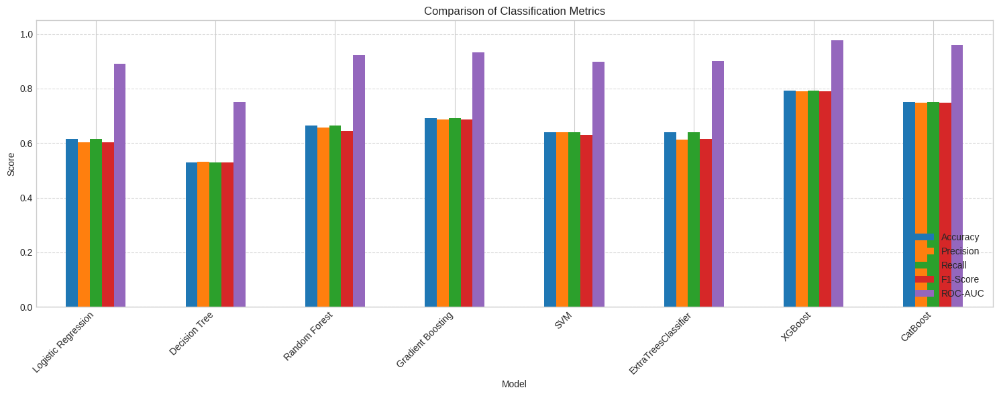

<Figure size 1000x800 with 0 Axes>

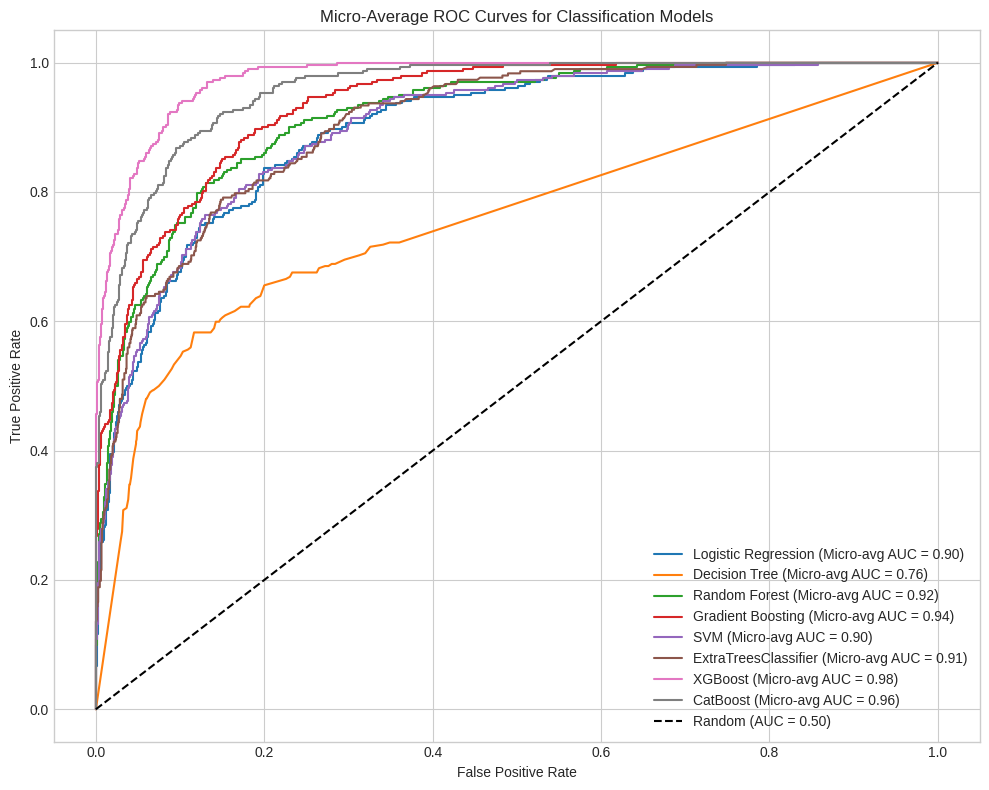

In [95]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
import xgboost
import catboost
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelBinarizer # Import LabelBinarizer
from sklearn.metrics import roc_curve, auc # Import auc

# --- Collect metrics from previously trained models (for the multiclass classification task) ---

# Logistic Regression
log_reg = LogisticRegression(random_state=37, max_iter=1000)
log_reg.fit(X_train_csc, y_train_c)
y_pred_log = log_reg.predict(X_test_csc)
y_proba_log = log_reg.predict_proba(X_test_csc)
log_acc = accuracy_score(y_test_c, y_pred_log)
log_prec = precision_score(y_test_c, y_pred_log, average='weighted', zero_division=0)
log_rec = recall_score(y_test_c, y_pred_log, average='weighted', zero_division=0)
log_f1 = f1_score(y_test_c, y_pred_log, average='weighted', zero_division=0)
log_auc = roc_auc_score(y_test_c, y_proba_log, multi_class='ovr', average='weighted')

# Decision Tree
dt_clf = DecisionTreeClassifier(random_state=37, max_depth=8)
dt_clf.fit(X_train_csc, y_train_c)
y_pred_dt_c  = dt_clf.predict(X_test_csc)
y_proba_dt_c = dt_clf.predict_proba(X_test_csc)
dt_c_acc  = accuracy_score(y_test_c, y_pred_dt_c)
dt_c_prec = precision_score(y_test_c, y_pred_dt_c, average='weighted', zero_division=0)
dt_c_rec  = recall_score(y_test_c, y_pred_dt_c, average='weighted', zero_division=0)
dt_c_f1   = f1_score(y_test_c, y_pred_dt_c, average='weighted', zero_division=0)
dt_c_auc  = roc_auc_score(y_test_c, y_proba_dt_c, multi_class='ovr', average='weighted')

# Random Forest
rf_clf = RandomForestClassifier(n_estimators=100, random_state=37, max_depth=10)
rf_clf.fit(X_train_csc, y_train_c)
y_pred_rf_c  = rf_clf.predict(X_test_csc)
y_proba_rf_c = rf_clf.predict_proba(X_test_csc)
rf_c_acc  = accuracy_score(y_test_c, y_pred_rf_c)
rf_c_prec = precision_score(y_test_c, y_pred_rf_c, average='weighted', zero_division=0)
rf_c_rec  = recall_score(y_test_c, y_pred_rf_c, average='weighted', zero_division=0)
rf_c_f1   = f1_score(y_test_c, y_pred_rf_c, average='weighted', zero_division=0)
rf_c_auc  = roc_auc_score(y_test_c, y_proba_rf_c, multi_class='ovr', average='weighted')

# Gradient Boosting
gb_clf = GradientBoostingClassifier(n_estimators=100, random_state=37, max_depth=5)
gb_clf.fit(X_train_csc, y_train_c)
y_pred_gb_c  = gb_clf.predict(X_test_csc)
y_proba_gb_c = gb_clf.predict_proba(X_test_csc)
gb_c_acc  = accuracy_score(y_test_c, y_pred_gb_c)
gb_c_prec = precision_score(y_test_c, y_pred_gb_c, average='weighted', zero_division=0)
gb_c_rec  = recall_score(y_test_c, y_pred_gb_c, average='weighted', zero_division=0)
gb_c_f1   = f1_score(y_test_c, y_pred_gb_c, average='weighted', zero_division=0)
gb_c_auc  = roc_auc_score(y_test_c, y_proba_gb_c, multi_class='ovr', average='weighted')

# SVM (SVC)
svm_clf = SVC(probability=True, random_state=42)
svm_clf.fit(X_train_csc, y_train_c)
y_pred_svm  = svm_clf.predict(X_test_csc)
y_proba_svm = svm_clf.predict_proba(X_test_csc)
svm_acc  = accuracy_score(y_test_c, y_pred_svm)
svm_prec = precision_score(y_test_c, y_pred_svm, average='weighted', zero_division=0)
svm_rec  = recall_score(y_test_c, y_pred_svm, average='weighted', zero_division=0)
svm_f1   = f1_score(y_test_c, y_pred_svm, average='weighted', zero_division=0)
svm_auc  = roc_auc_score(y_test_c, y_proba_svm, multi_class='ovr', average='weighted')

# ExtraTreesClassifier
extra_trees_clf = ExtraTreesClassifier(n_estimators=750, max_depth=16, min_samples_split=2, max_features=16, max_samples=0.75, bootstrap=True, random_state=21)
extra_trees_clf.fit(X_train_csc, y_train_c)
y_pred_et_c = extra_trees_clf.predict(X_test_csc)
y_proba_et_c = extra_trees_clf.predict_proba(X_test_csc)

et_c_acc = accuracy_score(y_test_c, y_pred_et_c)
et_c_prec = precision_score(y_test_c, y_pred_et_c, average='weighted', zero_division=0)
et_c_rec = recall_score(y_test_c, y_pred_et_c, average='weighted', zero_division=0)
et_c_f1 = f1_score(y_test_c, y_pred_et_c, average='weighted', zero_division=0)
et_c_auc = roc_auc_score(y_test_c, y_proba_et_c, multi_class='ovr', average='weighted')

# XGBoost
xg_best_params = {'n_estimators': 1954,
 'grow_policy': 'lossguide',
 'tree_method': 'exact',
 'max_leaves': 38,
 'learning_rate': 0.048693994985245036,
 'subsample': 0.2471775540995933,
 'colsample_bylevel': 0.98726415418394,
 'reg_alpha': 0.03769394183976329,
 'reg_lambda': 0.42501782005856525}

xg_clf = xgboost.XGBClassifier(objective='binary:logistic', num_class=len(np.unique(y_train_c)), eval_metric='mlogloss', booster='gbtree', enable_categorical=False, **xg_best_params, random_state=21)
xg_clf.fit(X_train_csc, y_train_c)
y_pred_xg_c = xg_clf.predict(X_test_csc)
y_proba_xg_c = xg_clf.predict_proba(X_test_csc)

xg_c_acc = accuracy_score(y_test_c, y_pred_xg_c)
xg_c_prec = precision_score(y_test_c, y_pred_xg_c, average='weighted', zero_division=0)
xg_c_rec = recall_score(y_test_c, y_pred_xg_c, average='weighted', zero_division=0)
xg_c_f1 = f1_score(y_test_c, y_pred_xg_c, average='weighted', zero_division=0)
xg_c_auc = roc_auc_score(y_test_c, y_proba_xg_c, multi_class='ovr', average='weighted')

# CatBoost
cat_clf = catboost.CatBoostClassifier(random_seed=21, verbose=False)
cat_clf.fit(X_train_csc, y_train_c)
y_pred_cat_c = cat_clf.predict(X_test_csc)
y_proba_cat_c = cat_clf.predict_proba(X_test_csc)

cat_c_acc = accuracy_score(y_test_c, y_pred_cat_c)
cat_c_prec = precision_score(y_test_c, y_pred_cat_c, average='weighted', zero_division=0)
cat_c_rec = recall_score(y_test_c, y_pred_cat_c, average='weighted', zero_division=0)
cat_c_f1 = f1_score(y_test_c, y_pred_cat_c, average='weighted', zero_division=0)
cat_c_auc = roc_auc_score(y_test_c, y_proba_cat_c, multi_class='ovr', average='weighted')

# --- Create a summary DataFrame ---

clf_summary_final = pd.DataFrame({
    'Model': ['Logistic Regression', 'Decision Tree',
              'Random Forest', 'Gradient Boosting', 'SVM',
              'ExtraTreesClassifier', 'XGBoost', 'CatBoost'],
    'Accuracy':  [log_acc,  dt_c_acc,  rf_c_acc,  gb_c_acc,  svm_acc,
                  et_c_acc, xg_c_acc, cat_c_acc],
    'Precision': [log_prec, dt_c_prec, rf_c_prec, gb_c_prec, svm_prec,
                  et_c_prec, xg_c_prec, cat_c_prec],
    'Recall':    [log_rec,  dt_c_rec,  rf_c_rec,  gb_c_rec,  svm_rec,
                  et_c_rec, xg_c_rec, cat_c_rec],
    'F1-Score':  [log_f1,   dt_c_f1,   rf_c_f1,   gb_c_f1,   svm_f1,
                  et_c_f1, xg_c_f1, cat_c_f1],
    'ROC-AUC':   [log_auc,  dt_c_auc,  rf_c_auc,  gb_c_auc,  svm_auc,
                  et_c_auc, xg_c_auc, cat_c_auc]
}).set_index('Model').round(4)

print("Classification Model Comparison:")
display(clf_summary_final)

# --- Visualize the comparison ---

best_clf = clf_summary_final['ROC-AUC'].idxmax()
print(f"\nBest model by ROC-AUC: {best_clf} ({clf_summary_final.loc[best_clf, 'ROC-AUC']:.4f})")

# Plotting metrics
clf_summary_final.plot(kind='bar', figsize=(15, 6))
plt.title('Comparison of Classification Metrics')
plt.ylabel('Score')
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.05)
plt.legend(loc='lower right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Plotting ROC Curves
plt.figure(figsize=(10, 8))

# Function to plot micro-average ROC curve for multiclass
def plot_micro_avg_roc_curve(y_true, y_proba_multiclass, label, ax):
    lb = LabelBinarizer()
    y_true_binarized = lb.fit_transform(y_true)

    # Compute micro-average ROC curve and ROC area
    fpr_micro, tpr_micro, _ = roc_curve(y_true_binarized.ravel(), y_proba_multiclass.ravel())
    roc_auc_micro = auc(fpr_micro, tpr_micro)

    ax.plot(fpr_micro, tpr_micro, label=f'{label} (Micro-avg AUC = {roc_auc_micro:.2f})')


fig, ax = plt.subplots(figsize=(10, 8))

plot_micro_avg_roc_curve(y_test_c, y_proba_log, 'Logistic Regression', ax)
plot_micro_avg_roc_curve(y_test_c, y_proba_dt_c, 'Decision Tree', ax)
plot_micro_avg_roc_curve(y_test_c, y_proba_rf_c, 'Random Forest', ax)
plot_micro_avg_roc_curve(y_test_c, y_proba_gb_c, 'Gradient Boosting', ax)
plot_micro_avg_roc_curve(y_test_c, y_proba_svm, 'SVM', ax)
plot_micro_avg_roc_curve(y_test_c, y_proba_et_c, 'ExtraTreesClassifier', ax)
plot_micro_avg_roc_curve(y_test_c, y_proba_xg_c, 'XGBoost', ax)
plot_micro_avg_roc_curve(y_test_c, y_proba_cat_c, 'CatBoost', ax)

ax.plot([0, 1], [0, 1], 'k--', label='Random (AUC = 0.50)')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('Micro-Average ROC Curves for Classification Models')
ax.legend(loc='lower right')
ax.grid(True)
plt.tight_layout()
plt.show()

## Сравним от разных методов свои параметров значимости (feature importance). Для каждого метода свой расчет сделан


Top 10 Feature Importances Across Models (ranked by average importance):


,Logistic Regression,Decision Tree,Random Forest,Gradient Boosting,ExtraTreesClassifier,XGBoost,CatBoost,Average_Importance
age,0.234886,0.055023,0.076035,0.078809,0.057289,0.025666,7.326089,1.121971
ef_hosp,0.239616,0.066753,0.077600,0.064898,0.042436,0.022056,7.309162,1.117503
ldl,0.251288,0.052735,0.053332,0.073495,0.039904,0.023145,6.894274,1.055453
severity,0.606945,0.164502,0.073563,0.125756,0.084257,0.100227,5.957372,1.016089
sysAP,0.200538,0.026788,0.041802,0.039346,0.040438,0.025007,5.889026,0.894706
smoking,0.954278,0.083397,0.040627,0.053680,0.056364,0.044965,4.829531,0.866120
bpm,0.187628,0.021234,0.049177,0.045079,0.038022,0.020727,5.515815,0.839669
leukoc,0.249059,0.041550,0.052887,0.057208,0.038911,0.018949,5.356947,0.830787
glu,0.185391,0.023390,0.046847,0.054856,0.031439,0.019410,5.305738,0.809582
stemi,0.971903,0.074956,0.058710,0.023002,0.055355,0.045341,4.290542,0.788544


/tmp/ipykernel_596/4180147426.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=temp_df, palette='viridis')
/tmp/ipykernel_596/4180147426.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=temp_df, palette='viridis')
/tmp/ipykernel_596/4180147426.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=temp_df, palette='viridis')
/tmp/ipykernel_596/4180147426.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated an

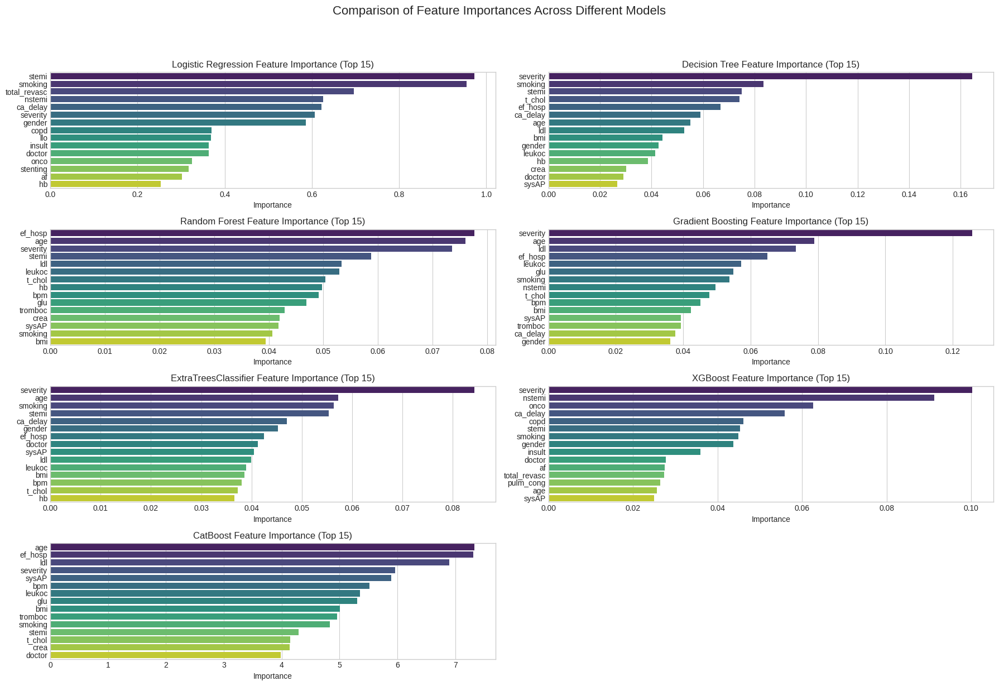

In [96]:
feature_names = X_train.columns

# Dictionary to store feature importances for each model
feature_importances_dict = {}

# 1. Logistic Regression: Use absolute coefficients as a proxy for importance
# For multiclass, take the mean of absolute coefficients across classes
feature_importances_dict['Logistic Regression'] = np.mean(np.abs(log_reg.coef_), axis=0)

# 2. Decision Tree
feature_importances_dict['Decision Tree'] = dt_clf.feature_importances_

# 3. Random Forest
feature_importances_dict['Random Forest'] = rf_clf.feature_importances_

# 4. Gradient Boosting
feature_importances_dict['Gradient Boosting'] = gb_clf.feature_importances_

# 5. SVM (SVC does not provide feature_importances_ directly. Skip for now or explicitly mention limitation)
# If it was LinearSVC, we could use coef_.
# feature_importances_dict['SVM'] = np.mean(np.abs(svm_clf.coef_), axis=0) # Only if LinearSVC

# 6. ExtraTreesClassifier
feature_importances_dict['ExtraTreesClassifier'] = extra_trees_clf.feature_importances_

# 7. XGBoost
feature_importances_dict['XGBoost'] = xg_clf.feature_importances_

# 8. CatBoost
feature_importances_dict['CatBoost'] = cat_clf.get_feature_importance()

# Create a DataFrame for comparison
importance_df = pd.DataFrame(feature_importances_dict, index=feature_names)

# Sort by the average importance across models (or a specific model if preferred)
importance_df['Average_Importance'] = importance_df.mean(axis=1)
importance_df = importance_df.sort_values(by='Average_Importance', ascending=False)

print("Top 10 Feature Importances Across Models (ranked by average importance):")
display(importance_df.head(10))

# Visualize top N features for each model
num_top_features = 15

plt.figure(figsize=(18, 12))
plot_counter = 0
for i, (model_name, importances) in enumerate(feature_importances_dict.items()):
    # Skip SVM as it doesn't provide direct feature importances via feature_importances_ or get_feature_importance()
    if model_name == 'SVM':
        continue

    plot_counter += 1
    plt.subplot(4, 2, plot_counter) # Adjusted subplot grid to 4 rows, 2 columns
    # Create a temporary DataFrame for sorting and selecting top features for the current model
    temp_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
    temp_df = temp_df.sort_values(by='importance', ascending=False).head(num_top_features)

    sns.barplot(x='importance', y='feature', data=temp_df, palette='viridis')
    plt.title(f'{model_name} Feature Importance (Top {num_top_features})')
    plt.xlabel('Importance')
    plt.ylabel('')
    plt.tight_layout()

plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout to prevent title overlap
plt.suptitle('Comparison of Feature Importances Across Different Models', fontsize=16, y=1.02)
plt.show()

# Специальный прием: синтез данных SMOTE для противодействия дисбаллансу классов

In [97]:
numerical_cols_no_time = numerical_cols.drop('time', errors='ignore')

mean_outliers = outliers_df[numerical_cols_no_time].mean()
mean_non_outliers = non_outliers_df[numerical_cols_no_time].mean()

mean_differences = abs(mean_outliers - mean_non_outliers)

print("Mean for outliers_df (excluding 'time'):")
print(mean_outliers)
print("\nMean for non_outliers_df (excluding 'time'):")
print(mean_non_outliers)
print("\nAbsolute differences in means:")
print(mean_differences)

Mean for outliers_df (excluding 'time'):
age              72.098082
af                0.300000
dm                0.308333
ckd               0.233333
copd              0.041667
insult            0.150000
onco              0.025000
severity          0.691667
nstemi            0.200000
stemi             0.491667
llo               0.025000
gender            0.550000
ca_delay          0.183333
sum_cad           1.933333
stenting          0.700000
total_revasc      0.591667
ef_hosp          46.699167
bpm              81.708333
sysAP           128.866667
pulm_cong         0.225000
bmi              27.920396
smoking           0.191667
hb              130.558333
leukoc           10.930000
tromboc         233.700000
t_chol            5.138333
ldl               3.204750
glu               8.020000
crea            103.031667
dtype: float64

Mean for non_outliers_df (excluding 'time'):
age              63.013673
af                0.131313
dm                0.255411
ckd               0.095960
copd   

In [98]:
print("\nColumns with most significant mean differences between outliers and non-outliers (ranked descending):\n")
print(mean_differences.sort_values(ascending=False))


Columns with most significant mean differences between outliers and non-outliers (ranked descending):

crea            20.850640
age              9.084409
hb               9.080437
bpm              6.557842
sysAP            6.195196
ef_hosp          3.436327
tromboc          2.894306
glu              1.381020
bmi              1.053187
leukoc           0.916511
t_chol           0.302637
llo              0.283802
sum_cad          0.210390
af               0.168687
smoking          0.160426
pulm_cong        0.152128
ckd              0.137374
ldl              0.132099
stenting         0.121789
gender           0.108730
ca_delay         0.082179
insult           0.077850
total_revasc     0.067785
dm               0.052922
stemi            0.034307
nstemi           0.029726
copd             0.009199
onco             0.009127
severity         0.004582
dtype: float64


In [99]:
print("Features with mean difference > 0.5:")
print(mean_differences[mean_differences > 0.5])

Features with mean difference > 0.5:
age         9.084409
ef_hosp     3.436327
bpm         6.557842
sysAP       6.195196
bmi         1.053187
hb          9.080437
leukoc      0.916511
tromboc     2.894306
glu         1.381020
crea       20.850640
dtype: float64


In [100]:
print(mean_differences[mean_differences > 0.5].index.tolist())

['age', 'ef_hosp', 'bpm', 'sysAP', 'bmi', 'hb', 'leukoc', 'tromboc', 'glu', 'crea']


In [101]:
numerical_features = data.select_dtypes(include=['number']).columns.drop('target')

cluster_means = data.groupby(clusters)[numerical_features].mean()

print("Mean of numerical features for each cluster:")
print(cluster_means)

Mean of numerical features for each cluster:
            doctor        age        af        dm       ckd      copd  \
clusters                                                                
0         1.376603  62.762895  0.129808  0.246795  0.059295  0.017628   
1         1.290541  65.979390  0.164414  0.250000  0.112613  0.040541   
2         1.340000  62.331178  0.140000  0.260000  0.120000  0.100000   
3         1.037037  69.356114  0.222222  0.462963  0.592593  0.037037   
4         1.326347  61.880346  0.134731  0.263473  0.107784  0.041916   

            insult      onco  severity    nstemi  ...        bmi   smoking  \
clusters                                          ...                        
0         0.081731  0.011218  0.725962  0.181090  ...  28.977976  0.371795   
1         0.078829  0.018018  0.605856  0.159910  ...  28.797163  0.301802   
2         0.040000  0.020000  0.800000  0.200000  ...  27.776022  0.360000   
3         0.111111  0.018519  0.759259  0.277778  ...

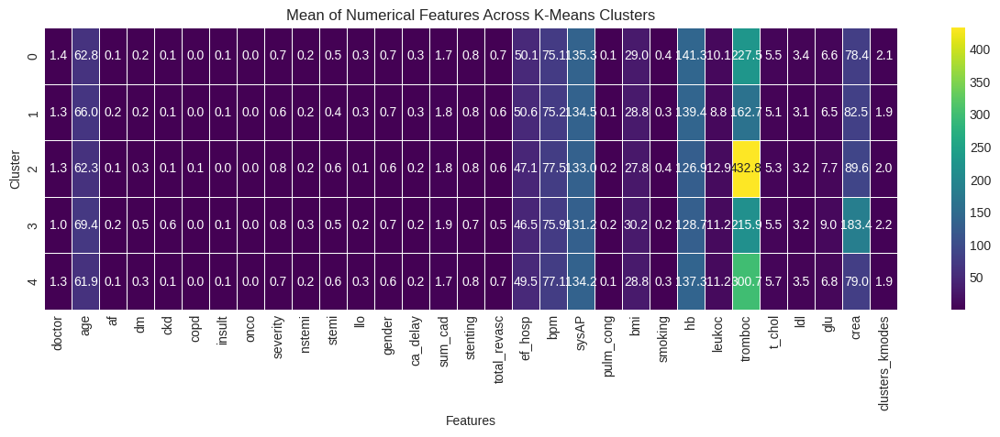

In [102]:
plt.figure(figsize=(15, 4))
sns.heatmap(cluster_means, annot=True, cmap='viridis', fmt=".1f", linewidths=.5)
plt.title('Mean of Numerical Features Across K-Means Clusters')
plt.xlabel('Features')
plt.ylabel('Cluster')
plt.show()

In [103]:
# вывод - несбалансированность классов. Участников с признаком resuld_CVD=1 135, а с признком =0 почти 1300.

In [104]:
from sklearn.utils import resample

In [105]:
df = data

# Separate majority and minority classes
df_majority = df[df['target'] == 0]
df_minority = df[df['target'] == 1]

print(f"\nClass 0 samples: {len(df_majority)}")
print(f"Class 1 samples: {len(df_minority)}")

# Method 1: Downsample majority class to match minority class
df_majority_downsampled = resample(df_majority,
                                   replace=False,  # sample without replacement
                                   n_samples=len(df_minority),  # match minority class size
                                   random_state=42)  # reproducible results

# Combine downsampled majority with minority
df_downsampled = pd.concat([df_majority_downsampled, df_minority])

print(f"\nAfter downsampling - balanced dataset:")
print(df_downsampled['target'].value_counts())
print(f"Total samples after downsampling: {len(df_downsampled)}")

# Method 2: Upsample minority class to match majority class
df_minority_upsampled = resample(df_minority,
                                 replace=True,  # sample with replacement
                                 n_samples=len(df_majority),  # match majority class size
                                 random_state=42)

# Combine majority with upsampled minority
df_upsampled = pd.concat([df_majority, df_minority_upsampled])

print(f"\nAfter upsampling - balanced dataset:")
print(df_upsampled['target'].value_counts())
print(f"Total samples after upsampling: {len(df_upsampled)}")


Class 0 samples: 1209
Class 1 samples: 297

After downsampling - balanced dataset:
target
0    297
1    297
Name: count, dtype: int64
Total samples after downsampling: 594

After upsampling - balanced dataset:
target
0    1209
1    1209
Name: count, dtype: int64
Total samples after upsampling: 2418


In [106]:
df = data

# Separate majority and minority classes
df_majority = df[df['target'] == 0]
df_minority = df[df['target'] == 1]

print(f"\nClass 0 samples: {len(df_majority)}")
print(f"Class 1 samples: {len(df_minority)}")

# Method 1: Downsample majority class to match minority class
df_majority_downsampled = resample(df_majority,
                                   replace=False,  # sample without replacement
                                   n_samples=len(df_minority),  # match minority class size
                                   random_state=42)  # reproducible results

# Combine downsampled majority with minority
df_downsampled = pd.concat([df_majority_downsampled, df_minority])

print(f"\nAfter downsampling - balanced dataset:")
print(df_downsampled['target'].value_counts())
print(f"Total samples after downsampling: {len(df_downsampled)}")

# Method 2: Upsample minority class to match majority class
df_minority_upsampled = resample(df_minority,
                                 replace=True,  # sample with replacement
                                 n_samples=len(df_majority),  # match majority class size
                                 random_state=42)

# Combine majority with upsampled minority
df_upsampled = pd.concat([df_majority, df_minority_upsampled])

print(f"\nAfter upsampling - balanced dataset:")
print(df_upsampled['target'].value_counts())
print(f"Total samples after upsampling: {len(df_upsampled)}")


Class 0 samples: 1209
Class 1 samples: 297

After downsampling - balanced dataset:
target
0    297
1    297
Name: count, dtype: int64
Total samples after downsampling: 594

After upsampling - balanced dataset:
target
0    1209
1    1209
Name: count, dtype: int64
Total samples after upsampling: 2418


In [107]:
# теперь наши классы сбалансированные
df_upsampled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2418 entries, 0 to 447
Data columns (total 32 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   doctor           2418 non-null   int64  
 1   age              2418 non-null   float64
 2   af               2418 non-null   int64  
 3   dm               2418 non-null   int64  
 4   ckd              2418 non-null   int64  
 5   copd             2418 non-null   int64  
 6   insult           2418 non-null   int64  
 7   onco             2418 non-null   int64  
 8   severity         2418 non-null   int64  
 9   nstemi           2418 non-null   int64  
 10  stemi            2418 non-null   int64  
 11  llo              2418 non-null   int64  
 12  gender           2418 non-null   int64  
 13  ca_delay         2418 non-null   int64  
 14  sum_cad          2418 non-null   int64  
 15  stenting         2418 non-null   int64  
 16  total_revasc     2418 non-null   int64  
 17  ef_hosp          241

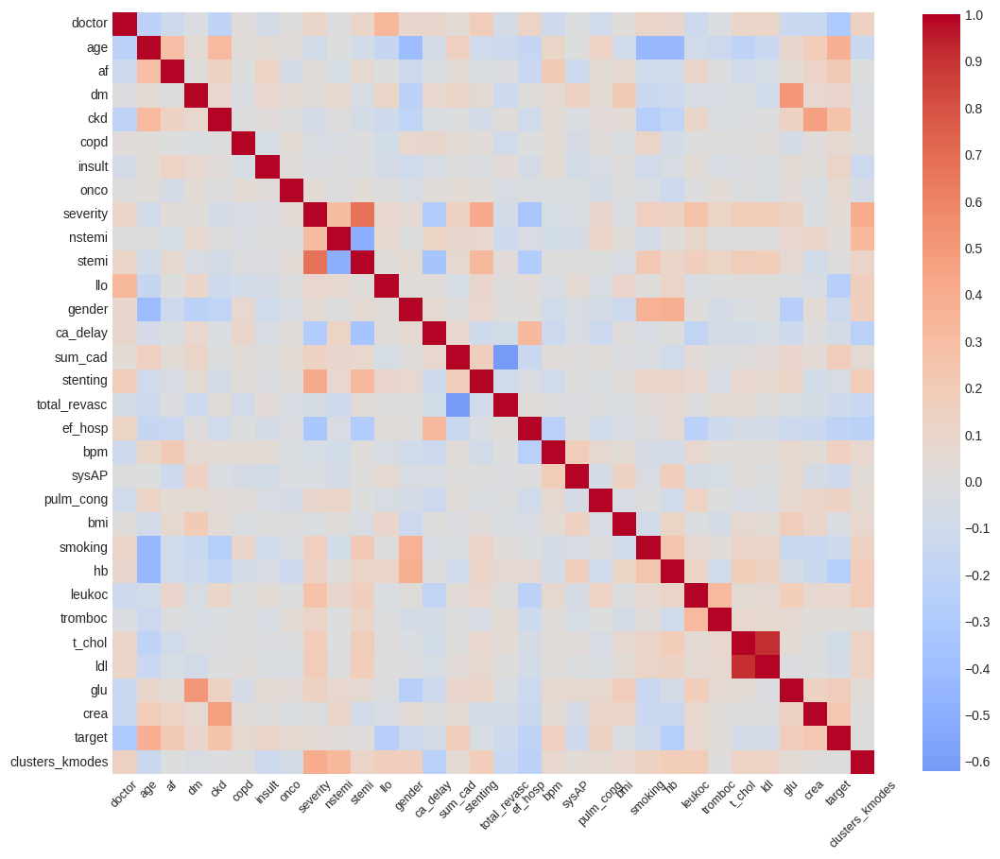

In [108]:
corr = df_upsampled.corr()

plt.figure(figsize=(13, 13))
sns.heatmap(
    corr,
    annot=False,
    cmap='coolwarm',
    center=0,
    square=True,
    cbar_kws={'shrink': 0.8, 'ticks': plt.MaxNLocator(20)}
)

plt.xticks(rotation=45, ha='center', fontsize=9)
plt.yticks(fontsize=10);

In [109]:
threshold = 0.67
high_corr_pairs = []

for i in range(len(corr.columns)):
    for j in range(i + 1, len(corr.columns)):
        if abs(corr.iloc[i, j]) > threshold:
            high_corr_pairs.append((corr.columns[i], corr.columns[j], corr.iloc[i, j]))

if high_corr_pairs:
    print(f"Highly correlated feature pairs (absolute correlation > {threshold}):")
    for feature1, feature2, correlation_value in high_corr_pairs:
        print(f"- {feature1} and {feature2}: {correlation_value:.2f}")
else:
    print(f"No highly correlated feature pairs found with an absolute correlation greater than {threshold}.")

Highly correlated feature pairs (absolute correlation > 0.67):
- severity and stemi: 0.68
- t_chol and ldl: 0.92


# Решаем задачу регрессии для time

In [110]:
import pandas as pd
import numpy as np

import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve

from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree
from sklearn.svm import SVC

import warnings
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')
%matplotlib inline

In [111]:
data = pd.read_excel("/content/med_dataset_cardio.xlsx", header=0)
data.rename(columns={"0_na, 1_mi": "severity", "0_no, 1_ther, 2_card": "doctor"}, inplace=True);
data.drop(columns=["card"], inplace=True)
data.drop(columns=["na"], inplace=True)
data.drop(columns=["dmonit"], inplace=True)
data["target"] = data["result_cvd"]
data.drop(columns=["result", "result_cvd"], inplace=True)

In [112]:
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE

df = data.copy()

# Separate majority and minority classes
df_majority = df[df['target'] == 0]
df_minority = df[df['target'] == 1]

print(f"\nClass 0 samples: {len(df_majority)}")
print(f"Class 1 samples: {len(df_minority)}")

# Method 1: Downsample majority class to match minority class
df_majority_downsampled = resample(df_majority,
                                   replace=False,  # sample without replacement
                                   n_samples=len(df_minority),  # match minority class size
                                   random_state=37)  # reproducible results

# Combine downsampled majority with minority
df_downsampled = pd.concat([df_majority_downsampled, df_minority])

print(f"\nAfter downsampling - balanced dataset:")
print(df_downsampled['target'].value_counts())
print(f"Total samples after downsampling: {len(df_downsampled)}")

# Method 2: Upsample minority class using SMOTE to match majority class
# Prepare data for SMOTE: features and target
X_smote = df.drop('target', axis=1)
y_smote = df['target']

smote = SMOTE(random_state=37)
X_resampled, y_resampled = smote.fit_resample(X_smote, y_smote)

# Combine resampled features and target into a new DataFrame
df_upsampled = pd.concat([X_resampled, y_resampled], axis=1)

print(f"\nAfter upsampling with SMOTE - balanced dataset:")
print(df_upsampled['target'].value_counts())
print(f"Total samples after upsampling: {len(df_upsampled)}")


Class 0 samples: 1354
Class 1 samples: 152

After downsampling - balanced dataset:
target
0    152
1    152
Name: count, dtype: int64
Total samples after downsampling: 304

After upsampling with SMOTE - balanced dataset:
target
0    1354
1    1354
Name: count, dtype: int64
Total samples after upsampling: 2708


In [113]:
y = df_upsampled['time']
X = df_upsampled.drop(['time','target'], axis=1)
##X = df_upsampled.drop('target', axis=1)


#y = df_downsampled['time']
#X = df_downsampled.drop(['time','target'], axis=1)


#делим выборку на тестовую и тренировочную
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=37
)

#данные имеют разную природу, поэтому нужно их стандартизовать
scaler = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc  = scaler.transform(X_test)

print(f"Train: {X_train.shape}  |  Test: {X_test.shape}")

Train: (2166, 30)  |  Test: (542, 30)


In [114]:
# линейная регрессия
lr = LinearRegression()
lr.fit(X_train_sc, y_train)

y_pred_lr = lr.predict(X_test_sc)

lr_r2   = r2_score(y_test, y_pred_lr)
lr_rmse = np.sqrt(mean_squared_error(y_test, y_pred_lr))
lr_mae  = mean_absolute_error(y_test, y_pred_lr)

print("Linear Regression")
print(f"  R²   = {lr_r2:.4f}")
print(f"  RMSE = {lr_rmse:.4f}")
print(f"  MAE  = {lr_mae:.4f}")
print(f"\nКоэффициенты модели:")
coef_df = pd.DataFrame({'feature': X.columns, 'coef': lr.coef_}).sort_values('coef')
print(coef_df.to_string(index=False))

Linear Regression
  R²   = 0.4826
  RMSE = 389.9284
  MAE  = 316.6099

Коэффициенты модели:
     feature       coef
    severity -82.192957
         glu -72.457361
        crea -61.649805
         bpm -52.362951
         ldl -46.822007
         age -46.059769
   pulm_cong -28.570592
         llo  -8.439040
     sum_cad  -0.346749
          hb   0.441079
      leukoc   0.529431
        onco   4.139093
        copd   7.756621
     tromboc   9.780790
      insult  12.959180
     ef_hosp  14.731043
          af  24.064542
      gender  34.445668
       sysAP  34.698107
    stenting  37.332949
    ca_delay  37.888564
         bmi  43.260171
         ckd  43.435428
      nstemi  44.681167
     smoking  45.822414
          dm  66.647591
total_revasc  82.414948
       stemi  82.612745
      t_chol 111.145819
      doctor 198.720653


In [115]:
# деревья решений
dt_reg = DecisionTreeRegressor(random_state=37, max_depth=10)
dt_reg.fit(X_train_sc, y_train)

y_pred_dt = dt_reg.predict(X_test_sc)

dt_r2   = r2_score(y_test, y_pred_dt)
dt_rmse = np.sqrt(mean_squared_error(y_test, y_pred_dt))
dt_mae  = mean_absolute_error(y_test, y_pred_dt)

# Train vs Test — проверяем переобучение
dt_r2_train = r2_score(y_train, dt_reg.predict(X_train_sc))

print("Decision Tree (max_depth=10)")
print(f"  Train R² = {dt_r2_train:.4f}")
print(f"  Test  R² = {dt_r2:.4f}")
print(f"  RMSE     = {dt_rmse:.4f}")
print(f"  MAE      = {dt_mae:.4f}")
if dt_r2_train - dt_r2 > 0.1:
    print("Внимание: разрыв Train/Test > 0.1 — возможно переобучение!")

Decision Tree (max_depth=10)
  Train R² = 0.8636
  Test  R² = 0.3424
  RMSE     = 439.6162
  MAE      = 293.4823
Внимание: разрыв Train/Test > 0.1 — возможно переобучение!


Random Forest (100 деревьев, max_depth=10)
  R²   = 0.6561
  RMSE = 317.9243
  MAE  = 242.7310


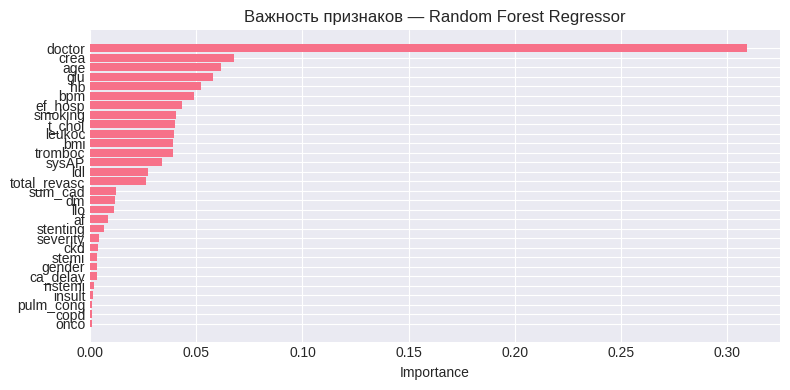

In [116]:
# случайный лес
rf_reg = RandomForestRegressor(n_estimators=100, random_state=42, max_depth=10)
rf_reg.fit(X_train_sc, y_train)

y_pred_rf = rf_reg.predict(X_test_sc)

rf_r2   = r2_score(y_test, y_pred_rf)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred_rf))
rf_mae  = mean_absolute_error(y_test, y_pred_rf)

print("Random Forest (100 деревьев, max_depth=10)")
print(f"  R²   = {rf_r2:.4f}")
print(f"  RMSE = {rf_rmse:.4f}")
print(f"  MAE  = {rf_mae:.4f}")

# Важность признаков
feat_imp = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_reg.feature_importances_
}).sort_values('importance', ascending=True)

plt.figure(figsize=(8, 4))
plt.barh(feat_imp['feature'], feat_imp['importance'])
plt.title('Важность признаков — Random Forest Regressor')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

Gradient Boosting (100 деревьев, max_depth=5)
  R²   = 0.6086
  RMSE = 339.1516
  MAE  = 268.6412


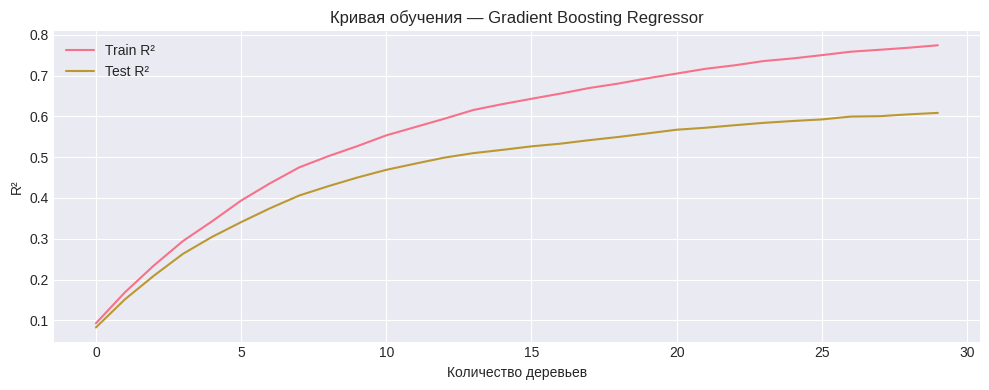

In [117]:
# градиентный бустинг
gb_reg = GradientBoostingRegressor(n_estimators=30, random_state=42, max_depth=5)
gb_reg.fit(X_train_sc, y_train)

y_pred_gb = gb_reg.predict(X_test_sc)

gb_r2   = r2_score(y_test, y_pred_gb)
gb_rmse = np.sqrt(mean_squared_error(y_test, y_pred_gb))
gb_mae  = mean_absolute_error(y_test, y_pred_gb)

print("Gradient Boosting (100 деревьев, max_depth=5)")
print(f"  R²   = {gb_r2:.4f}")
print(f"  RMSE = {gb_rmse:.4f}")
print(f"  MAE  = {gb_mae:.4f}")

# Кривая обучения (staged_predict)
train_scores = [r2_score(y_train, y_pred) for y_pred in gb_reg.staged_predict(X_train_sc)]
test_scores  = [r2_score(y_test,  y_pred) for y_pred in gb_reg.staged_predict(X_test_sc)]

plt.figure(figsize=(10, 4))
plt.plot(train_scores, label='Train R²', linewidth=1.5)
plt.plot(test_scores,  label='Test R²',  linewidth=1.5)
plt.xlabel('Количество деревьев')
plt.ylabel('R²')
plt.title('Кривая обучения — Gradient Boosting Regressor')
plt.legend()
plt.tight_layout()
plt.show()

Сводная таблица — Регрессия:
                       R²      RMSE       MAE
Model                                        
Linear Regression  0.4826  389.9284  316.6099
Decision Tree      0.3424  439.6162  293.4823
Random Forest      0.6561  317.9243  242.7310
Gradient Boosting  0.6086  339.1516  268.6412

Лучшая модель по R²: Random Forest (0.6561)


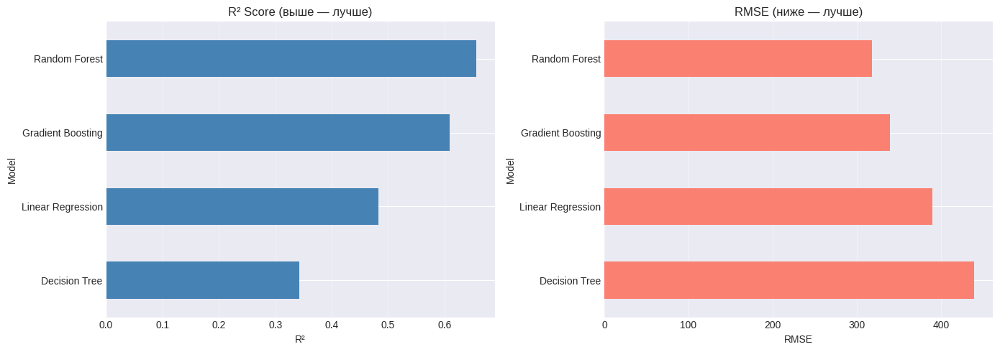

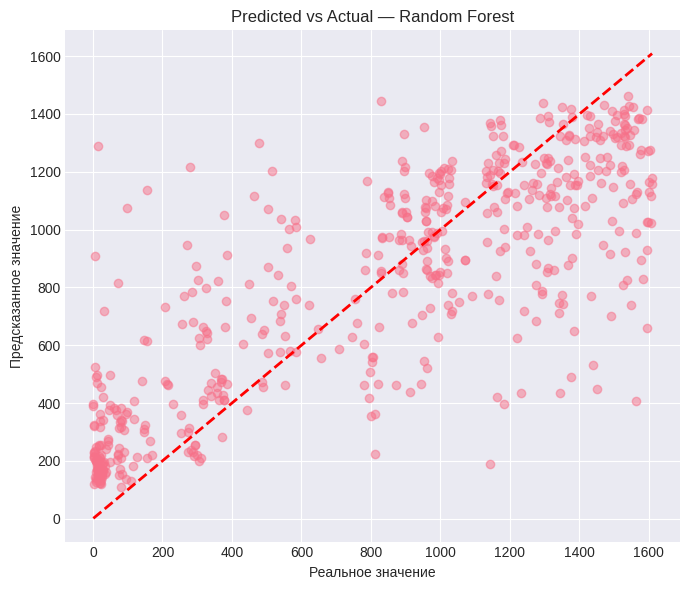

In [118]:
# сравниваем методы
reg_summary = pd.DataFrame({
    'Model': ['Linear Regression',
              'Decision Tree', 'Random Forest', 'Gradient Boosting'],
    'R²':   [lr_r2, dt_r2, rf_r2, gb_r2],
    'RMSE': [lr_rmse, dt_rmse, rf_rmse, gb_rmse],
    'MAE':  [lr_mae,  dt_mae,  rf_mae,  gb_mae]
}).set_index('Model').round(4)

print("Сводная таблица — Регрессия:")
print(reg_summary.to_string())

best_reg = reg_summary['R²'].idxmax()
print(f"\nЛучшая модель по R²: {best_reg} ({reg_summary.loc[best_reg, 'R²']:.4f})")

# График сравнения R²
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

reg_summary['R²'].sort_values().plot(kind='barh', ax=axes[0], color='steelblue')
axes[0].set_title('R² Score (выше — лучше)')
axes[0].set_xlabel('R²')
axes[0].grid(axis='x', alpha=0.4)

reg_summary['RMSE'].sort_values(ascending=False).plot(kind='barh', ax=axes[1], color='salmon')
axes[1].set_title('RMSE (ниже — лучше)')
axes[1].set_xlabel('RMSE')
axes[1].grid(axis='x', alpha=0.4)

plt.tight_layout()
plt.show()

#для лучшей модели
best_pred_map = {
    'Linear Regression': y_pred_lr,
    'Decision Tree': y_pred_dt,
    'Random Forest': y_pred_rf,
    'Gradient Boosting': y_pred_gb
}
y_best = best_pred_map[best_reg]

plt.figure(figsize=(7, 6))
plt.scatter(y_test, y_best, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Реальное значение')
plt.ylabel('Предсказанное значение')
plt.title(f'Predicted vs Actual — {best_reg}')
plt.tight_layout()
plt.show()

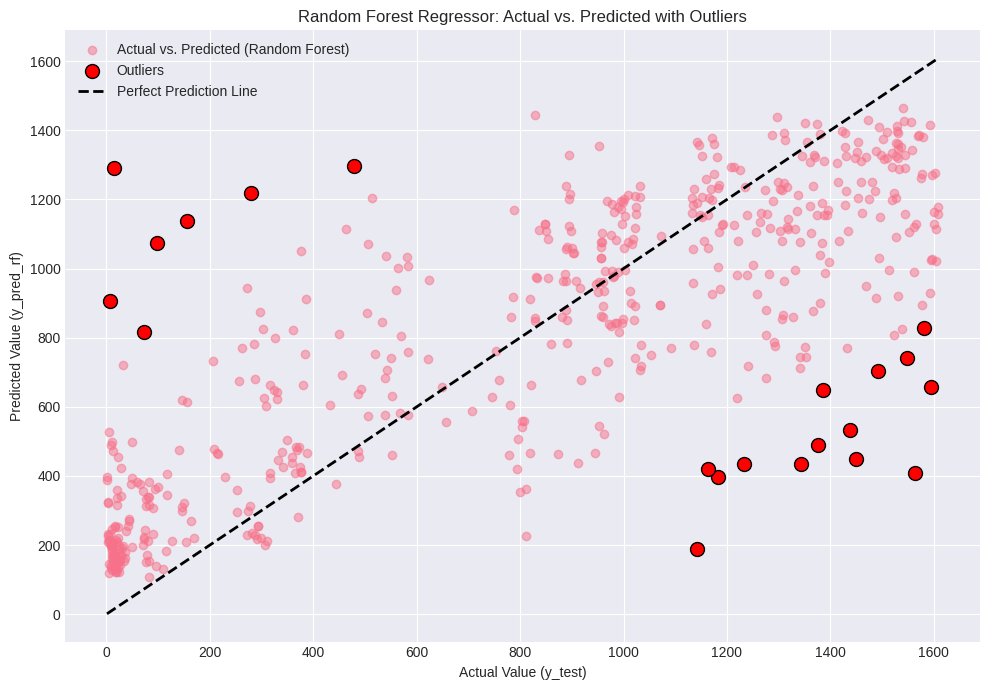


Number of outlier predictions: 21
Lower bound for residual outliers: -715.36
Upper bound for residual outliers: 726.45

--- Outlier Samples (Actual vs. Predicted) ---
      Actual    Predicted     Residual
329     1492   702.534481   789.465519
520     1563   407.574880  1155.425120
1387       7   907.407204  -900.407204
1519     156  1137.445064  -981.445064
2553    1385   648.918173   736.081827
954     1344   435.888420   908.111580
347     1594   658.130194   935.869806
494     1450   448.494231  1001.505769
479     1377   489.071289   887.928711
1970    1143   188.655524   954.344476
67      1549   739.908014   809.091986
2275    1233   434.019234   798.980766
513       72   816.757179  -744.757179
1638    1183   396.393575   786.606425
826     1438   533.116741   904.883259
2178    1163   420.871006   742.128994
1061     478  1298.156292  -820.156292
320       98  1074.947143  -976.947143
1461     279  1217.974639  -938.974639
21        14  1289.868443 -1275.868443
1029    1582 

In [119]:
# Calculate residuals (errors)
residuals = y_test - y_pred_rf

# Calculate IQR for residuals
Q1_res = residuals.quantile(0.25)
Q3_res = residuals.quantile(0.75)
IQR_res = Q3_res - Q1_res

lower_bound_res = Q1_res - 1.5 * IQR_res
upper_bound_res = Q3_res + 1.5 * IQR_res

# Identify outlier residuals
outlier_mask = (residuals < lower_bound_res) | (residuals > upper_bound_res)

outlier_y_test = y_test[outlier_mask]
outlier_y_pred_rf = y_pred_rf[outlier_mask]

# Plotting actual vs. predicted values with outliers highlighted
plt.figure(figsize=(10, 7))
plt.scatter(y_test, y_pred_rf, alpha=0.5, label='Actual vs. Predicted (Random Forest)')
plt.scatter(outlier_y_test, outlier_y_pred_rf, color='red', s=100, label='Outliers', edgecolors='black')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, label='Perfect Prediction Line')
plt.xlabel('Actual Value (y_test)')
plt.ylabel('Predicted Value (y_pred_rf)')
plt.title('Random Forest Regressor: Actual vs. Predicted with Outliers')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print(f"\nNumber of outlier predictions: {len(outlier_y_test)}")
print(f"Lower bound for residual outliers: {lower_bound_res:.2f}")
print(f"Upper bound for residual outliers: {upper_bound_res:.2f}")

print("\n--- Outlier Samples (Actual vs. Predicted) ---")
outlier_df = pd.DataFrame({'Actual': outlier_y_test, 'Predicted': outlier_y_pred_rf, 'Residual': residuals[outlier_mask]})
print(outlier_df.to_string())

--- Typical Best Forecasted Patients (Residuals within 10% of Actual Value) ---


,Actual,Predicted,Residual
1008,567,581.332389,-14.332389
1789,486,471.640103,14.359897
2648,989,989.260014,-0.260014
1460,1164,1155.414094,8.585906
1262,860,781.473058,78.526942


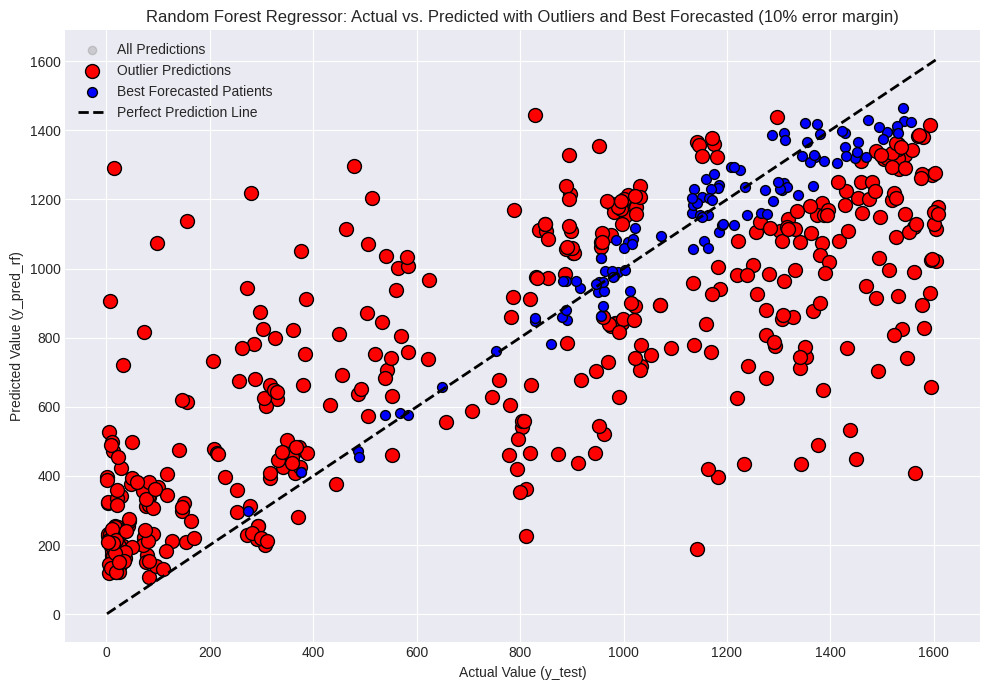


Number of outlier predictions: 429
Number of best forecasted patients: 113
Error margin for acceptable residuals: +/- 10% of actual value

--- Outlier Samples (Actual vs. Predicted) ---

--- Real Outlier Samples ---
     Actual    Predicted     Residual
0    1527.0  1325.138136   201.861864
1     464.0  1114.623766  -650.623766
2    1384.0  1074.189998   309.810002
3     376.0  1049.743573  -673.743573
4    1460.0  1249.177065   210.822935
5    1022.0   892.057446   129.942554
6     759.0   677.660589    81.339411
7     504.0   870.437312  -366.437312
8       3.0   320.753614  -317.753614
9    1033.0   779.908490   253.091510
10    745.0   629.315219   115.684781
11    828.0  1444.359861  -616.359861
12     76.0   313.477337  -237.477337
13   1545.0  1327.221461   217.778539
14   1530.0  1360.687857   169.312143
15    303.0   826.424524  -523.424524
16    812.0   224.705061   587.294939
17   1174.0  1360.856562  -186.856562
18   1580.0  1381.500371   198.499629
19   1025.0  1177.02898

In [120]:
residuals = y_test - y_pred_rf

# Define 'best forecasted patients' based on a 10% error margin
# A prediction is 'best' if its absolute error is within 10% of the actual value.
error_margin = 0.10 # 10%

# Calculate lower and upper bounds for predictions to be considered 'best'
# Predicted value should be between (Actual * (1 - error_margin)) and (Actual * (1 + error_margin))
# This implies: Actual - (Actual * error_margin) <= Predicted <= Actual + (Actual * error_margin)
# Rearranging: -(Actual * error_margin) <= Predicted - Actual <= (Actual * error_margin)
# Or: -abs(Actual * error_margin) <= Residual <= abs(Actual * error_margin)

# For each actual value in y_test, define its acceptable residual range
acceptable_residual_lower_bound = -np.abs(y_test * error_margin)
acceptable_residual_upper_bound = np.abs(y_test * error_margin)

# Identify 'best forecasted patients' based on the new error margin
best_forecasted_mask = (residuals >= acceptable_residual_lower_bound) & (residuals <= acceptable_residual_upper_bound)

# Identify 'outlier predictions' as those NOT in the best forecasted group
outlier_mask = ~best_forecasted_mask

outlier_y_test = y_test[outlier_mask]
outlier_y_pred_rf = y_pred_rf[outlier_mask]

best_forecasted_y_test = y_test[best_forecasted_mask]
best_forecasted_y_pred_rf = y_pred_rf[best_forecasted_mask]

# Create DataFrame for best forecasted patients
best_forecasted_df = pd.DataFrame({
    'Actual': best_forecasted_y_test,
    'Predicted': best_forecasted_y_pred_rf,
    'Residual': residuals[best_forecasted_mask]
})

print("--- Typical Best Forecasted Patients (Residuals within 10% of Actual Value) ---")
display(best_forecasted_df.head())

# Plotting actual vs. predicted values with outliers and best forecasted patients highlighted
plt.figure(figsize=(10, 7))
plt.scatter(y_test, y_pred_rf, alpha=0.3, label='All Predictions', color='gray') # All points in gray
plt.scatter(outlier_y_test, outlier_y_pred_rf, color='red', s=100, label='Outlier Predictions', edgecolors='black')
plt.scatter(best_forecasted_y_test, best_forecasted_y_pred_rf, color='blue', s=50, label='Best Forecasted Patients', edgecolors='black')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, label='Perfect Prediction Line')
plt.xlabel('Actual Value (y_test)')
plt.ylabel('Predicted Value (y_pred_rf)')
plt.title('Random Forest Regressor: Actual vs. Predicted with Outliers and Best Forecasted (10% error margin)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print(f"\nNumber of outlier predictions: {len(outlier_y_test)}")
print(f"Number of best forecasted patients: {len(best_forecasted_y_test)}")
print(f"Error margin for acceptable residuals: +/- {error_margin*100:.0f}% of actual value")

print("\n--- Outlier Samples (Actual vs. Predicted) ---")
outlier_df = pd.DataFrame({'Actual': outlier_y_test, 'Predicted': outlier_y_pred_rf, 'Residual': residuals[outlier_mask]})

# Determine the threshold for original samples based on the length of the original `data` DataFrame
original_data_length = len(data)

# Create lists to store real and SMOTE-generated outlier samples
real_outliers = []
smote_outliers = []

for original_upsampled_index, row in outlier_df.iterrows():
    if original_upsampled_index < original_data_length:
        # This index corresponds to an original sample
        real_outliers.append(row.to_dict())
    else:
        # This index corresponds to a SMOTE-generated sample
        smote_outliers.append(row.to_dict())

print("\n--- Real Outlier Samples ---")
if real_outliers:
    print(pd.DataFrame(real_outliers).to_string())
else:
    print("No real outlier samples found.")

print("\n--- SMOTE-Generated Outlier Samples ---")
if smote_outliers:
    print(pd.DataFrame(smote_outliers).to_string())
else:
    print("No SMOTE-generated outlier samples found.")

In [121]:
real_outliers_df = pd.DataFrame(real_outliers)
real_outlier_indices = real_outliers_df.index

print("Real Outlier Samples from the original `data` DataFrame:")
display(data.loc[real_outlier_indices])

Real Outlier Samples from the original `data` DataFrame:


,doctor,time,age,af,dm,ckd,copd,insult,onco,severity,...,bmi,smoking,hb,leukoc,tromboc,t_chol,ldl,glu,crea,target
0,1,1152,79.0,0,1,0,0,0,0,0,...,30.7,0,84.0,7.1,213.0,2.2,1.06,8.7,117.0,0
1,1,949,61.0,1,1,0,0,0,1,1,...,34.0,0,166.0,9.4,225.0,5.8,3.61,4.4,94.0,0
2,1,1135,49.0,0,0,0,0,0,0,1,...,23.0,1,150.0,10.5,208.0,7.4,5.09,3.9,74.0,0
3,2,1524,59.0,0,0,0,0,0,0,1,...,26.5,1,142.0,5.1,58.0,5.3,3.30,4.2,86.0,0
4,2,1396,55.0,0,0,0,0,0,0,1,...,29.0,1,151.0,7.7,305.0,7.3,5.07,4.3,96.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214,2,1549,68.0,0,1,0,0,0,0,1,...,45.0,0,128.0,8.0,276.0,7.5,5.42,8.5,83.0,0
215,2,1282,61.0,0,0,0,0,0,0,1,...,34.5,1,144.0,16.5,301.0,6.9,4.60,6.7,76.0,0
216,2,1019,67.0,0,0,0,0,0,1,1,...,29.0,0,109.0,11.6,221.0,5.3,3.24,6.1,43.0,0
217,2,1159,73.0,0,0,0,0,0,0,1,...,29.0,1,134.0,9.4,176.0,4.6,2.90,4.5,68.0,0


Mean SHAP for llo: 3.7868


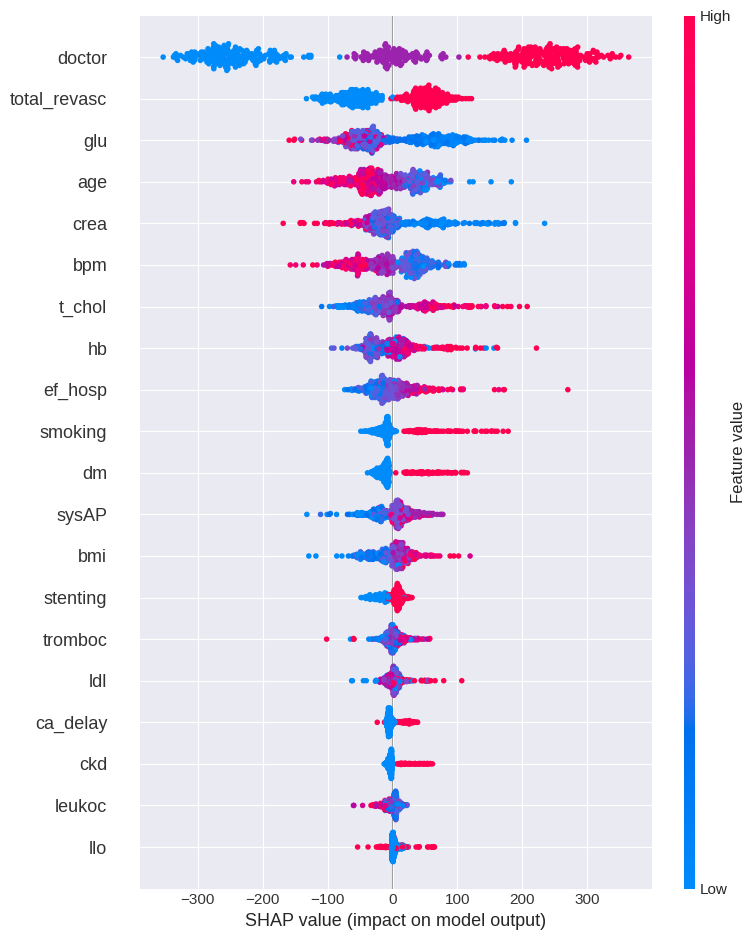

In [122]:
import shap
explainer = shap.TreeExplainer(gb_reg)
shap_values = explainer.shap_values(X_test_sc)

# Усреднённое влияние llo на вероятность result=1
llo_idx = list(X_test.columns).index('llo')
print(f"Mean SHAP for llo: {shap_values[:, llo_idx].mean():.4f}")
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns)

### Разъяснение SHAP-значения для 'llo' в модели регрессии

В модели `llo` (получение бесплатного лекарственного обеспечения) является фактором, который ожидаемо должен оказывать положительное влияние на пациента. SHAP-значение в `3.7868` кажется "недостаточно сильным:

1.  **Интерпретация SHAP-значения для 'llo':**
    Среднее SHAP-значение для `llo` составляет `3.7868`. Это означает, что для пациентов, получающих бесплатное лекарственное обеспечение (`llo=1`), прогнозируемое *время* в среднем **увеличивается примерно на 3.79 единицы** по сравнению с базовым предсказанием модели (или пациентами, не получающими `llo`).

3.  **"Недостаточно сильный" эффект?**
    Величина `3.79` может казаться небольшой, поэтому важно учитывать несколько аспектов:
    *   **Множество факторов:** Модель учитывает множество других факторов. `llo` является одним из них.
    *   **Согласованность с анализом выживаемости (CoxPHFitter):**
        *   Ранее модель `CoxPHFitter` показала, что `llo` имеет `exp(coef)` (отношение рисков) равное `0.26`, с 95% доверительным интервалом `[0.15, 0.46]`. Поскольку этот интервал полностью **ниже 1**, это подтверждает, что `llo` **значительно снижает риск** наступления события (например, смертности). Снижение риска означает *увеличение времени выживания*.
        *   График функции выживаемости также наглядно показал, что кривая для `llo=1` (получающие лекарство) **лежит выше** кривой для `llo=0` (не получающие лекарство), что также свидетельствует о **более высокой вероятности выживания** и, соответственно, более длительном времени до наступления события.

**Вывод:**
SHAP-значение `3.7868` для `llo` в регрессионной модели **действительно указывает на позитивный эффект**: оно предсказывает увеличение `time`, что в данном контексте означает увеличение времени выживания или отсрочку неблагоприятного события. Этот результат полностью согласуется с данными `CoxPHFitter` и графиками выживаемости, которые также показывают, что `llo` ассоциируется со сниженным риском и лучшей выживаемостью. Величина эффекта может быть не самой крупной в абсолютном выражении, но она является статистически значимой и клинически благоприятной.


SHAP values calculated for a single regression output.
Overall SHAP Summary Plot for Gradient Boosting Regressor:


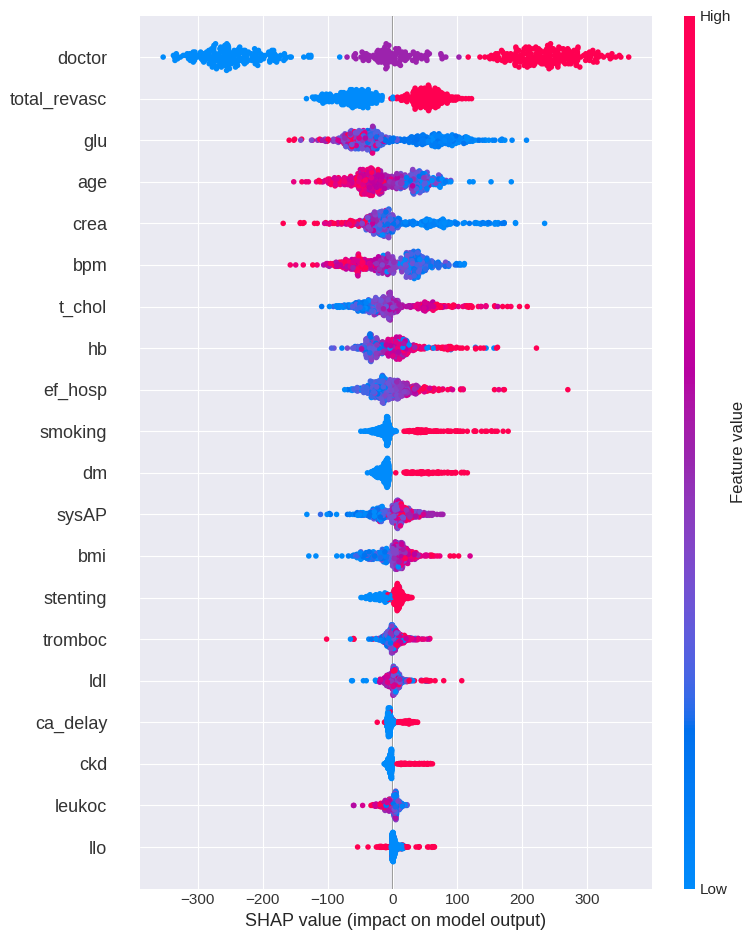


Mean SHAP value for 'llo' on predicting 'time': 3.7868
SHAP Dependence Plot for 'llo' on predicting 'time':


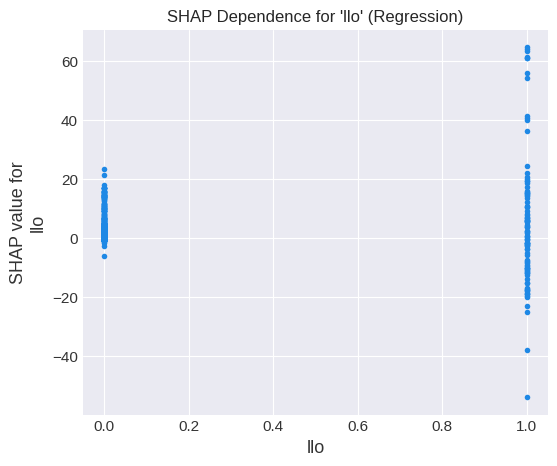

In [123]:
import shap
import matplotlib.pyplot as plt

# The model being explained is `gb_reg`, which is a GradientBoostingRegressor.
# Therefore, the SHAP values will be a 2D array (samples, features), not a 3D array for multiple classes.

# Create a SHAP explainer for the Gradient Boosting Regressor model
explainer = shap.TreeExplainer(gb_reg)

# Calculate SHAP values for the scaled test set
shap_values = explainer.shap_values(X_test_sc)

# Get the index of the 'llo' feature from the unscaled X_test DataFrame
llo_idx = list(X_test.columns).index('llo')

# For regression models, there is only one output, so no 'num_classes' to iterate over.
print(f"\nSHAP values calculated for a single regression output.")

# Overall SHAP Summary Plot for the Regression Model
print("Overall SHAP Summary Plot for Gradient Boosting Regressor:")
# Use X_test (unscaled DataFrame) for feature values in the plot for better interpretability
shap.summary_plot(shap_values, X_test, feature_names=X_test.columns)

# Investigate 'llo' influence
print(f"\nMean SHAP value for 'llo' on predicting 'time': {shap_values[:, llo_idx].mean():.4f}")

# Create a SHAP dependence plot for 'llo'
print(f"SHAP Dependence Plot for 'llo' on predicting 'time':")
shap.dependence_plot('llo', shap_values, X_test, feature_names=X_test.columns, interaction_index=None, show=False)
plt.title(f"SHAP Dependence for 'llo' (Regression)")
plt.show()

SHAP Interaction Plot for 'llo' and 'age':


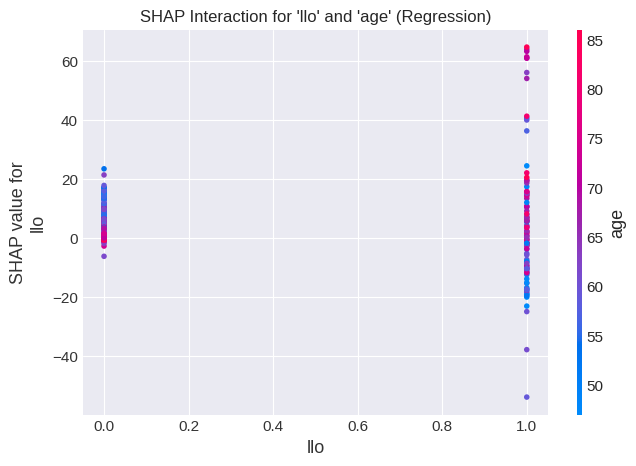

In [124]:
print("SHAP Interaction Plot for 'llo' and 'age':")
shap.dependence_plot('llo', shap_values, X_test, feature_names=X_test.columns, interaction_index='age', show=False)
plt.title("SHAP Interaction for 'llo' and 'age' (Regression)")
plt.show()

In [125]:
!pip install lifelines -q

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 409.1/409.1 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.9/118.9 kB 14.5 MB/s eta 0:00:00


In [126]:
from lifelines import CoxPHFitter

# Подготовка данных
cph_data = df[['time', 'target', 'llo', 'age', 'ef_hosp', 'crea']].dropna()

# Обучение модели
cph = CoxPHFitter()
cph.fit(cph_data, duration_col='time', event_col='target')

# Вывод результатов
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 1506 total observations, 1354 right-censored observations>
             duration col = 'time'
                event col = 'target'
      baseline estimation = breslow
   number of observations = 1506
number of events observed = 152
   partial log-likelihood = -1001.28
         time fit was run = 2026-07-30 07:35:11 UTC

---
           coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                  
llo       -1.34      0.26      0.29           -1.91           -0.77                0.15                0.46
age        0.06      1.06      0.01            0.05            0.08                1.05                1.08
ef_hosp   -0.04      0.96      0.01           -0.06           -0.01                0.94                0.99
crea       0.01      1.01      0.00            0.00            0.01                1.00                1.01

           cmp to     z      p  -log2(p)
covariate                               
llo          0.00 -4.59 <0.005     17.79
age          0.00  8.25 <0.005     52.44
ef_hosp      0.00 -3.05 <0.005      8.77
crea         0.00  4.10 <0.005     14.57
---
Concordance = 0.78
Partial AIC = 2010.56
log-likelihood ratio test = 171.75 on 4 df
-log2(p) of ll-ratio test = 117.45

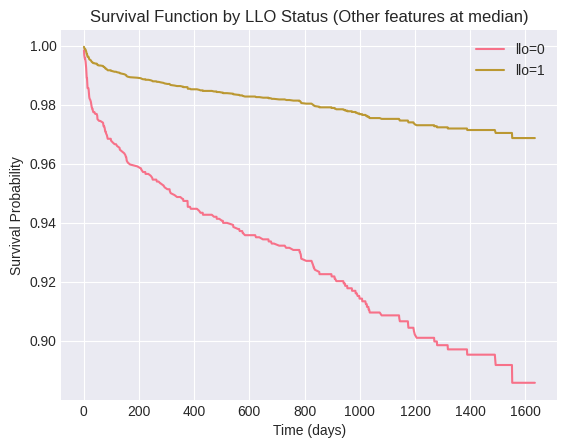

In [127]:
from lifelines import CoxPHFitter

# Create two hypothetical individuals for prediction:
# One with llo=0 and others features at their median
# One with llo=1 and others features at their median

median_data = cph_data.drop(columns=['time', 'target']).median().to_frame().T


# Individual with llo=0
pred_llo_0 = median_data.copy()
pred_llo_0['llo'] = 0

# Individual with llo=1
pred_llo_1 = median_data.copy()
pred_llo_1['llo'] = 1

# Concatenate for plotting
plot_data = pd.concat([pred_llo_0, pred_llo_1])
plot_data.index = ['llo=0', 'llo=1']

# Plot the survival function
cph.predict_survival_function(plot_data).plot()
plt.title('Survival Function by LLO Status (Other features at median)')
plt.xlabel('Time (days)')
plt.ylabel('Survival Probability')
plt.grid(True)
plt.show()

**Интерпретация графика функции выживаемости по статусу LLO:**

Survival function говорит о «накопленном успехе» (кто остался). Этот график функции выживаемости демонстрирует прогнозируемую вероятность выживания с течением времени для двух групп пациентов, различающихся только по статусу `llo` (факт получения лекарственного обеспечения):

*   **Красная линия (llo=0):** Представляет пациентов, которые **не** получают бесплатное лекарственное обеспечение. Кривая начинается со 100% выживаемости и постепенно снижается, показывая, как вероятность выживания уменьшается со временем.

*   **Желтая линия (llo=1):** Представляет пациентов, которые **получают** бесплатное лекарственное обеспечение.

**Вывод:** Визуально видно, что группа пациентов с `llo=1` (получающая льготное лекарственное обеспечение) имеет **более высокую вероятность выживания** по сравнению с группой `llo=0` (не получающей такое обеспечение). Это означает, что получение бесплатного лекарственного обеспечения после выписки ассоциируется с увеличением времени до наступления события (например, смерти) и, следовательно, с улучшением прогноза выживаемости, при условии, что другие факторы остаются на среднем уровне.

In [128]:
llo_hazard_ratio_lower_ci = cph.summary.loc['llo', 'exp(coef) lower 95%']
llo_hazard_ratio_upper_ci = cph.summary.loc['llo', 'exp(coef) upper 95%']

print(f"'llo' hazard ratio 95% CI: [{llo_hazard_ratio_lower_ci:.2f}, {llo_hazard_ratio_upper_ci:.2f}]")

'llo' hazard ratio 95% CI: [0.15, 0.46]


95% доверительный интервал для отношения рисков «llo» составляет [0,15, 0,46].

Это означает, что для пациентов, получающих «llo», риск события (вероятная смертность) оценивается в пределах от 15% до 46% от риска для пациентов, не получающих «llo», при прочих равных условиях. Поскольку этот интервал полностью ниже 1, это подтверждает, что получение «llo» значительно связано со сниженным риском (т.е., с увеличением выживаемости или лучшим исходом).

# Классификация для поиска паттернов риска

In [129]:
X_reg = df_upsampled.drop(['time', 'target'], axis=1)
y_reg = df_upsampled['time']

rf_reg_full = RandomForestRegressor(n_estimators=100, random_state=42, max_depth=10)
rf_reg_full.fit(X_reg, y_reg)

y_pred_time = rf_reg_full.predict(X_reg)
residuals = y_reg - y_pred_time

print("RandomForestRegressor trained and residuals calculated.")

RandomForestRegressor trained and residuals calculated.



Calculate the Interquartile Range (IQR) of the residuals, define lower and upper bounds for outlier detection, and then create a new binary feature in `df_upsampled` to mark these outliers.



In [130]:
Q1_res = residuals.quantile(0.25)
Q3_res = residuals.quantile(0.75)
IQR_res = Q3_res - Q1_res

lower_bound_res = Q1_res - 1.5 * IQR_res
upper_bound_res = Q3_res + 1.5 * IQR_res

# Identify outlier residuals
outlier_mask = (residuals < lower_bound_res) | (residuals > upper_bound_res)

df_upsampled['is_time_prediction_outlier'] = outlier_mask.astype(int)

print(f"Lower Bound for Residual Outliers: {lower_bound_res:.2f}")
print(f"Upper Bound for Residual Outliers: {upper_bound_res:.2f}")
print(f"Number of samples identified as time prediction outliers: {df_upsampled['is_time_prediction_outlier'].sum()}")
print("df_upsampled updated with 'is_time_prediction_outlier' feature.")

Lower Bound for Residual Outliers: -482.93
Upper Bound for Residual Outliers: 476.24
Number of samples identified as time prediction outliers: 63
df_upsampled updated with 'is_time_prediction_outlier' feature.


Prepare the augmented `df_upsampled` for classification by separating features and the target, performing a train-test split, and scaling the numerical features. The `X_clf` will now include the newly created `is_time_prediction_outlier` feature.



In [131]:
X_clf = df_upsampled.drop(['target','time'], axis=1)
y_clf = df_upsampled['target']

X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(
    X_clf, y_clf, test_size=0.2, random_state=42, stratify=y_clf
)

scaler_c = StandardScaler()
X_train_csc = scaler_c.fit_transform(X_train_c)
X_test_csc  = scaler_c.transform(X_test_c)

print(f"Train: {X_train_c.shape}  |  Test: {X_test_c.shape}")
print(f"Доля в train: {y_train_c.mean():.2%}")
print(f"Доля в test:  {y_test_c.mean():.2%}")

Train: (2166, 31)  |  Test: (542, 31)
Доля в train: 50.00%
Доля в test:  50.00%


Train the `RandomForestClassifier` (which was previously identified as the best model) using the augmented `X_train_csc` and `y_train_c` data, including the new `is_time_prediction_outlier` feature.


Random Forest (100 деревьев, max_depth=10)
  Accuracy  = 0.9354
  Precision = 0.9069
  Recall    = 0.9705
  F1-Score  = 0.9376
  ROC-AUC   = 0.9818


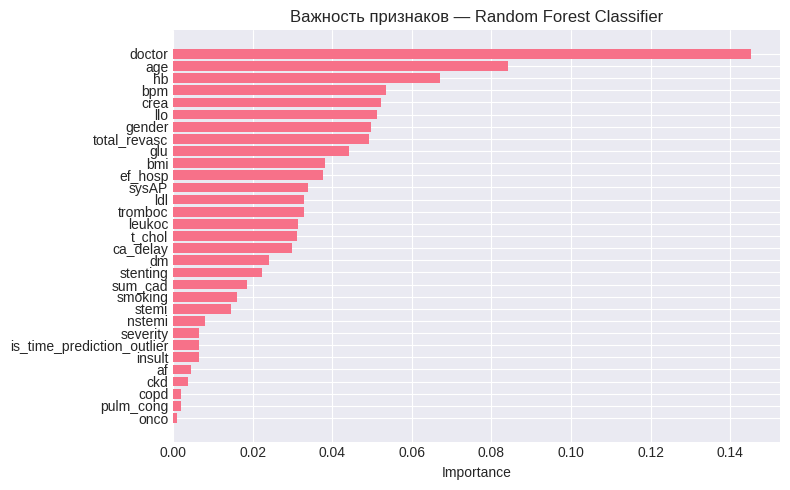

In [132]:
rf_clf = RandomForestClassifier(n_estimators=100, random_state=37, max_depth=10)
rf_clf.fit(X_train_csc, y_train_c)

y_pred_rf_c  = rf_clf.predict(X_test_csc)
y_proba_rf_c = rf_clf.predict_proba(X_test_csc)[:, 1]

rf_c_acc  = accuracy_score(y_test_c, y_pred_rf_c)
rf_c_prec = precision_score(y_test_c, y_pred_rf_c)
rf_c_rec  = recall_score(y_test_c, y_pred_rf_c)
rf_c_f1   = f1_score(y_test_c, y_pred_rf_c)
rf_c_auc  = roc_auc_score(y_test_c, y_proba_rf_c)

print("Random Forest (100 деревьев, max_depth=10)")
print(f"  Accuracy  = {rf_c_acc:.4f}")
print(f"  Precision = {rf_c_prec:.4f}")
print(f"  Recall    = {rf_c_rec:.4f}")
print(f"  F1-Score  = {rf_c_f1:.4f}")
print(f"  ROC-AUC   = {rf_c_auc:.4f}")

# Важность признаков
feat_imp_clf = pd.DataFrame({
    'feature': X_clf.columns,
    'importance': rf_clf.feature_importances_
}).sort_values('importance', ascending=True)

plt.figure(figsize=(8, 5))
plt.barh(feat_imp_clf['feature'], feat_imp_clf['importance'])
plt.title('Важность признаков — Random Forest Classifier')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

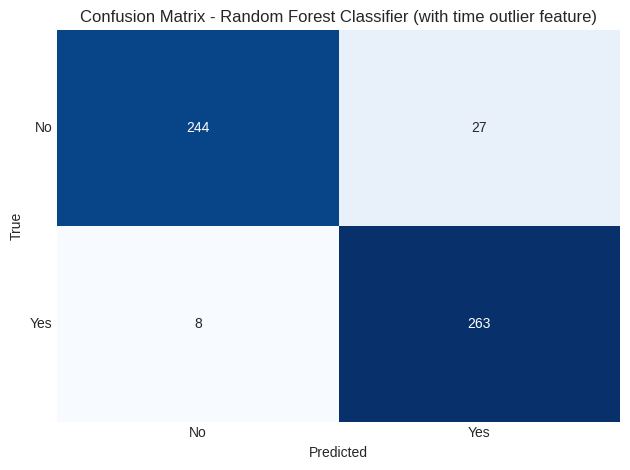

In [133]:
cm = confusion_matrix(y_test_c, y_pred_rf_c)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix - Random Forest Classifier (with time outlier feature)')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks([0.5, 1.5], ['No', 'Yes'])
plt.yticks([0.5, 1.5], ['No', 'Yes'], rotation=0)
plt.tight_layout()
plt.show()

# Система предсказания времени дожития

Time Prediction Model Performance (RandomForestRegressor):
  R²   = 0.7286
  RMSE = 291.3372
  MAE  = 220.6589


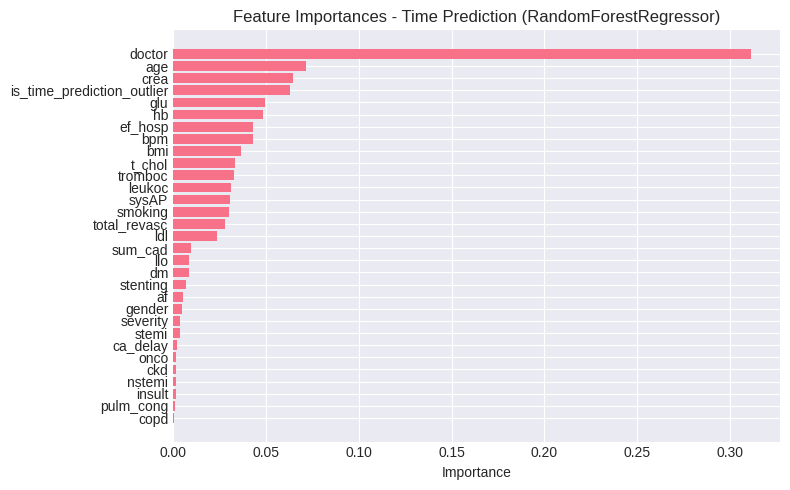

In [134]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Prepare data for time prediction (regression)
# Features for regression should be all columns used for classification, minus 'target', plus 'time' is the target
X_reg = df_upsampled.drop(['time', 'target'], axis=1)
y_reg = df_upsampled['time']

# Split data into training and testing sets
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_reg, y_reg, test_size=0.2, random_state=42
)

# Scale numerical features (assuming X_reg contains numerical features that need scaling)
scaler_reg = StandardScaler()
# Identify numerical columns in X_reg for scaling
numerical_cols_reg = X_reg.select_dtypes(include=np.number).columns

X_train_reg_scaled = X_train_reg.copy()
X_test_reg_scaled = X_test_reg.copy()

X_train_reg_scaled[numerical_cols_reg] = scaler_reg.fit_transform(X_train_reg[numerical_cols_reg])
X_test_reg_scaled[numerical_cols_reg] = scaler_reg.transform(X_test_reg[numerical_cols_reg])

# Train RandomForestRegressor model
rf_reg_prediction = RandomForestRegressor(n_estimators=100, random_state=42, max_depth=10)
rf_reg_prediction.fit(X_train_reg_scaled, y_train_reg)

# Make predictions
y_pred_time_model = rf_reg_prediction.predict(X_test_reg_scaled)

# Evaluate the model
r2_time_model = r2_score(y_test_reg, y_pred_time_model)
rmse_time_model = np.sqrt(mean_squared_error(y_test_reg, y_pred_time_model))
mae_time_model = mean_absolute_error(y_test_reg, y_pred_time_model)

print("Time Prediction Model Performance (RandomForestRegressor):")
print(f"  R²   = {r2_time_model:.4f}")
print(f"  RMSE = {rmse_time_model:.4f}")
print(f"  MAE  = {mae_time_model:.4f}")

# Display feature importances
feat_imp_reg = pd.DataFrame({
    'feature': X_reg.columns,
    'importance': rf_reg_prediction.feature_importances_
}).sort_values('importance', ascending=True)

plt.figure(figsize=(8, 5))
plt.barh(feat_imp_reg['feature'], feat_imp_reg['importance'])
plt.title('Feature Importances - Time Prediction (RandomForestRegressor)')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

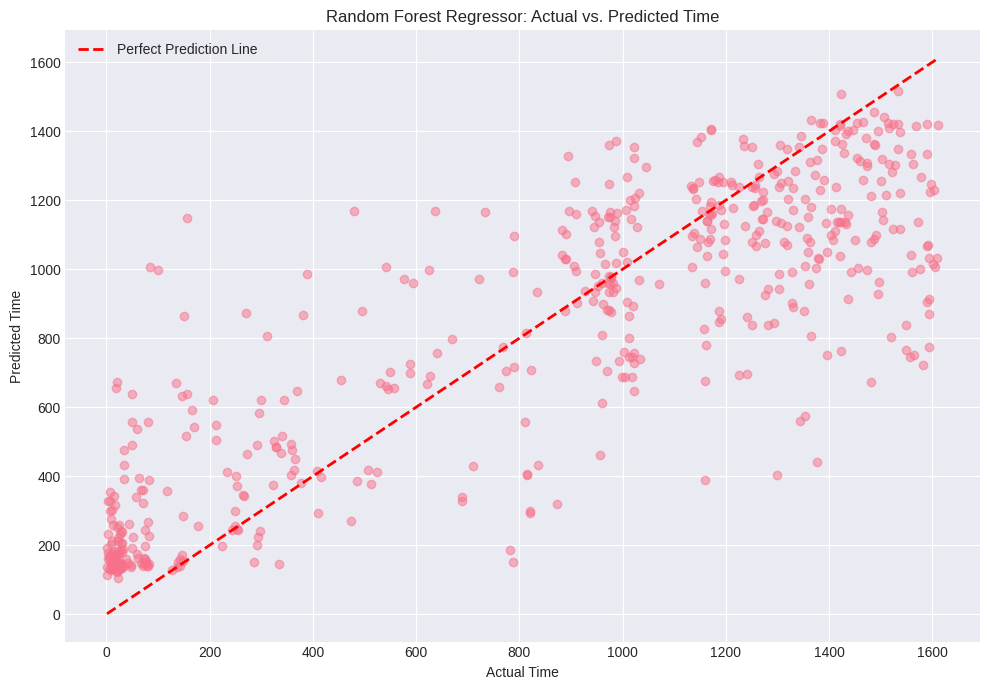

In [135]:
plt.figure(figsize=(10, 7))
plt.scatter(y_test_reg, y_pred_time_model, alpha=0.5)
plt.plot([y_test_reg.min(), y_test_reg.max()], [y_test_reg.min(), y_test_reg.max()], 'r--', lw=2, label='Perfect Prediction Line')
plt.xlabel('Actual Time')
plt.ylabel('Predicted Time')
plt.title('Random Forest Regressor: Actual vs. Predicted Time')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Comparison of Actual vs. Predicted Time:


,Actual_Time,Predicted_Time,Residual
1044,1313,1079.156568,233.843432
439,1591,1070.210107,520.789893
1729,344,621.649478,-277.649478
296,1425,1362.970952,62.029048
2211,1005,687.190358,317.809642
479,1377,441.418834,935.581166
1084,50,489.138858,-439.138858
2080,60,536.505429,-476.505429
2204,292,491.393279,-199.393279
318,1569,1416.076748,152.923252


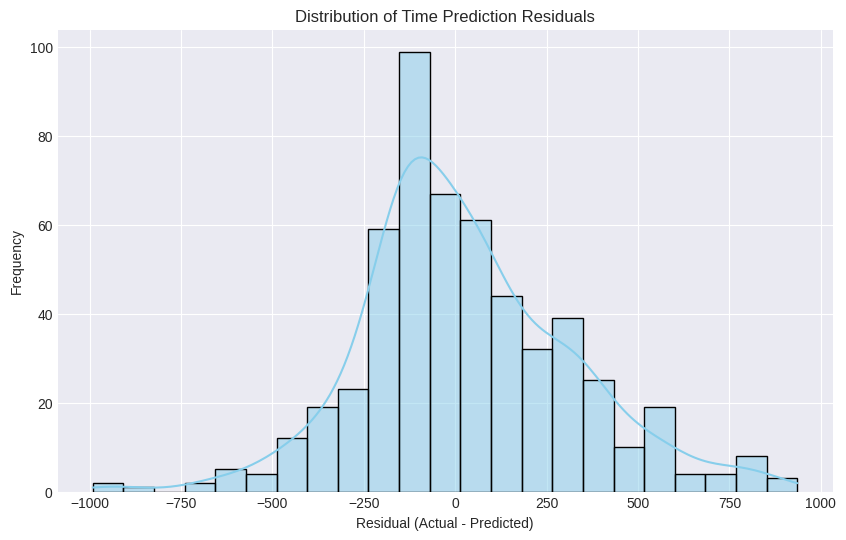


Descriptive statistics for Residuals:


,Residual
count,542.000000
mean,29.056083
std,290.152401
min,-991.135725
25%,-143.325553
50%,-1.833113
75%,200.316774
max,935.581166


In [136]:
time_comparison_df = pd.DataFrame({
    'Actual_Time': y_test_reg,
    'Predicted_Time': y_pred_time_model,
    'Residual': y_test_reg - y_pred_time_model
})

print("Comparison of Actual vs. Predicted Time:")
display(time_comparison_df.head(10))

# Further analysis of residuals
plt.figure(figsize=(10, 6))
sns.histplot(time_comparison_df['Residual'], kde=True, color='skyblue')
plt.title('Distribution of Time Prediction Residuals')
plt.xlabel('Residual (Actual - Predicted)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

print("\nDescriptive statistics for Residuals:")
display(time_comparison_df['Residual'].describe())

# доработка task to do

Способ определения риска (это в патент). Оценить низкий, высокий уровень риска. Это отдаем в способ.
* Пример формулы прошу выслать.

Добавить ЛЛО в XGboost как feature engineering. Xgboost - построить confusion matrix

Кейс 1: был пациент, у него был высокий риск, он погиб на 620 дней. Вязть этого пациента и рассчитать его кривую дожития. Так мы проверим, что способ работает.
Кейс 2: был здоровый пациент - он выжил, мы смотрим его кривую дожитию, оцениваем его вероятность и подтверждаем, что способ работает.